# **Marketing Campaign Analysis**

## **Problem Definition**

## **The Context:*

Customer segmentation is the process of dividing a dataset of customers into groups of similar customers based on certain common characteristics. Understanding customer behavior and characteristics is critical for effective marketing operations, as it allows businesses to tailor their marketing strategies to different customer groups, ultimately leading to better ROI and resource utilization. Segmented campaigns often yield higher engagement and revenue compared to non-segmented campaigns, highlighting the importance of customer segmentation in optimizing marketing efforts.

## **The Objective:**
The objective of this project is to utilize unsupervised learning techniques, such as dimensionality reduction and clustering, to create the best possible customer segments from the given dataset. By identifying meaningful clusters of customers based on their shared characteristics, the goal is to enhance marketing strategies and improve ROI by targeting personalized offers and communications to specific customer segments.

## **The Key Questions:**
- What are the key characteristics or features that define customer segments in the dataset?
- How can unsupervised learning techniques effectively capture and represent the underlying structure of the customer data?
- What clustering algorithms and dimensionality reduction methods are most suitable for the given dataset?
- How can the resulting customer segments be effectively utilized to optimize marketing strategies and improve ROI?

The Problem Formulation:**
Using data science methodologies, the aim is to solve the problem of customer segmentation by analyzing metrics related to customer engagement with various marketing activities. 







------------------------------
## **Data Dictionary**
------------------------------

The dataset contains the following features:

1. ID: Unique ID of each customer
2. Year_Birth: Customer’s year of birth
3. Education: Customer's level of education
4. Marital_Status: Customer's marital status
5. Kidhome: Number of small children in customer's household
6. Teenhome: Number of teenagers in customer's household
7. Income: Customer's yearly household income in USD
8. Recency: Number of days since the last purchase
9. Dt_Customer: Date of customer's enrollment with the company
10. MntFishProducts: The amount spent on fish products in the last 2 years
11. MntMeatProducts: The amount spent on meat products in the last 2 years
12. MntFruits: The amount spent on fruits products in the last 2 years
13. MntSweetProducts: Amount spent on sweet products in the last 2 years
14. MntWines: The amount spent on wine products in the last 2 years
15. MntGoldProds: The amount spent on gold products in the last 2 years
16. NumDealsPurchases: Number of purchases made with discount
17. NumCatalogPurchases: Number of purchases made using a catalog (buying goods to be shipped through the mail)
18. NumStorePurchases: Number of purchases made directly in stores
19. NumWebPurchases: Number of purchases made through the company's website
20. NumWebVisitsMonth: Number of visits to the company's website in the last month
21. AcceptedCmp1: 1 if customer accepted the offer in the first campaign, 0 otherwise
22. AcceptedCmp2: 1 if customer accepted the offer in the second campaign, 0 otherwise
23. AcceptedCmp3: 1 if customer accepted the offer in the third campaign, 0 otherwise
24. AcceptedCmp4: 1 if customer accepted the offer in the fourth campaign, 0 otherwise
25. AcceptedCmp5: 1 if customer accepted the offer in the fifth campaign, 0 otherwise
26. Response: 1 if customer accepted the offer in the last campaign, 0 otherwise
27. Complain: 1 If the customer complained in the last 2 years, 0 otherwise

**Note:** You can assume that the data is collected in the year 2016.

## **Import the necessary libraries and load the data**

In [1]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# To scale the data using z-score
from sklearn.preprocessing import StandardScaler

# To compute distances
from scipy.spatial.distance import cdist

# To perform K-means clustering and compute Silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# To visualize the elbow curve and Silhouette scores
from yellowbrick.cluster import SilhouetteVisualizer

# Importing PCA
from sklearn.decomposition import PCA

# To encode the variable
from sklearn.preprocessing import LabelEncoder

# Importing TSNE
from sklearn.manifold import TSNE

# To perform hierarchical clustering, compute cophenetic correlation, and create dendrograms
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet

# To compute distances
from scipy.spatial.distance import pdist

# To import K-Medoids
from sklearn_extra.cluster import KMedoids

# To import Gaussian Mixture
from sklearn.mixture import GaussianMixture

# To supress warnings
import warnings

warnings.filterwarnings("ignore")

## **Data Overview**

In [2]:
# Storing the path of the data file
path = 'marketing_campaign+%284%29.csv'

data = pd.read_csv(path)

In [3]:
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,10,4,7,0,0,0,0,0,0,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,1,2,5,0,0,0,0,0,0,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,2,10,4,0,0,0,0,0,0,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,0,4,6,0,0,0,0,0,0,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,3,6,5,0,0,0,0,0,0,0


In [4]:
data.tail()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,...,3,4,5,0,0,0,0,0,0,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,...,2,5,7,0,0,0,1,0,0,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,...,3,13,6,0,1,0,0,0,0,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,...,5,10,3,0,0,0,0,0,0,0
2239,9405,1954,PhD,Married,52869.0,1,1,15-10-2012,40,84,...,1,4,7,0,0,0,0,0,0,1


In [5]:
data.shape

(2240, 27)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [7]:
data.drop("ID", axis=1, inplace=True)

In [8]:
data

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,...,10,4,7,0,0,0,0,0,0,1
1,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,...,1,2,5,0,0,0,0,0,0,0
2,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,...,2,10,4,0,0,0,0,0,0,0
3,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,...,0,4,6,0,0,0,0,0,0,0
4,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,...,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,43,...,3,4,5,0,0,0,0,0,0,0
2236,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,0,...,2,5,7,0,0,0,1,0,0,0
2237,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,48,...,3,13,6,0,1,0,0,0,0,0
2238,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,30,...,5,10,3,0,0,0,0,0,0,0


**Observations and Insights from the Data overview:**   The data has a shape of 27 columns and 2240 rows. Most columns have no missing values. The only one with missing values was the column Income. In the next part we will see the shape of this variable and depending on the shape been normal or not, we will substitute the missing incomes by the mean or median.

## **Exploratory Data Analysis (EDA)**


**Objective:**

1. What is the summary statistics of the data? Explore summary statistics for numerical variables and the categorical variables
2. Find out number of unique observations in each category of categorical columns? 
3. Are all categories different from each other or can we combine some categories? 

In [9]:
cols_num = ["Year_Birth", "Income", "Recency","MntWines","MntFruits", "MntMeatProducts","MntFishProducts", "MntSweetProducts","MntGoldProds", "NumDealsPurchases","NumWebPurchases","NumCatalogPurchases","NumStorePurchases","NumWebVisitsMonth"]
data[cols_num].describe()

,Year_Birth,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth
count,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000
mean,1968.805804,52247.251354,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,2.325000,4.084821,2.662054,5.790179,5.316518
std,11.984069,25173.076661,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,1.932238,2.778714,2.923101,3.250958,2.426645
min,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1959.000000,35303.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000
50%,1970.000000,51381.500000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000
75%,1977.000000,68522.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000
max,1996.000000,666666.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,15.000000,27.000000,28.000000,13.000000,20.000000


In [10]:
# List of the categorical columns in the data
cols_cat = ["Education", "Marital_Status", "Kidhome", "Teenhome", "Complain", "Response", "AcceptedCmp1", "AcceptedCmp2", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5"]

for column in cols_cat:
    print("Counts for unique values in", column, "are :")
    print(data[column].value_counts())
    print("*" * 50)

Counts for unique values in Education are :
Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64
**************************************************
Counts for unique values in Marital_Status are :
Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64
**************************************************
Counts for unique values in Kidhome are :
0    1293
1     899
2      48
Name: Kidhome, dtype: int64
**************************************************
Counts for unique values in Teenhome are :
0    1158
1    1030
2      52
Name: Teenhome, dtype: int64
**************************************************
Counts for unique values in Complain are :
0    2219
1      21
Name: Complain, dtype: int64
**************************************************
Counts for unique values in Response are :
0    1906
1     334
Name: R

Education has a weird value called 2nd cycle that corresponds to 203 values. This is possible the same as a Master so we will change the value of Education that are 2n Cycle to Master. Furthermore, Alone, Absurd and YOLO will be transformed into Single as they probably are answers of people that are Single. 

In [11]:
data["Marital_Status"][data["Marital_Status"] == "Alone"] = "Single"
data["Marital_Status"][data["Marital_Status"] == "Absurd"] = "Single"
data["Marital_Status"][data["Marital_Status"] == "YOLO"] = "Single"

In [12]:
data["Education"][data["Education"] == "2n Cycle"] = "Master"

# **Univariate Analysis on Numerical data**

Univariate analysis is used to explore each variable in a data set, separately. It looks at the range of values, as well as the central tendency of the values. It can be done for both numerical and categorical variables.

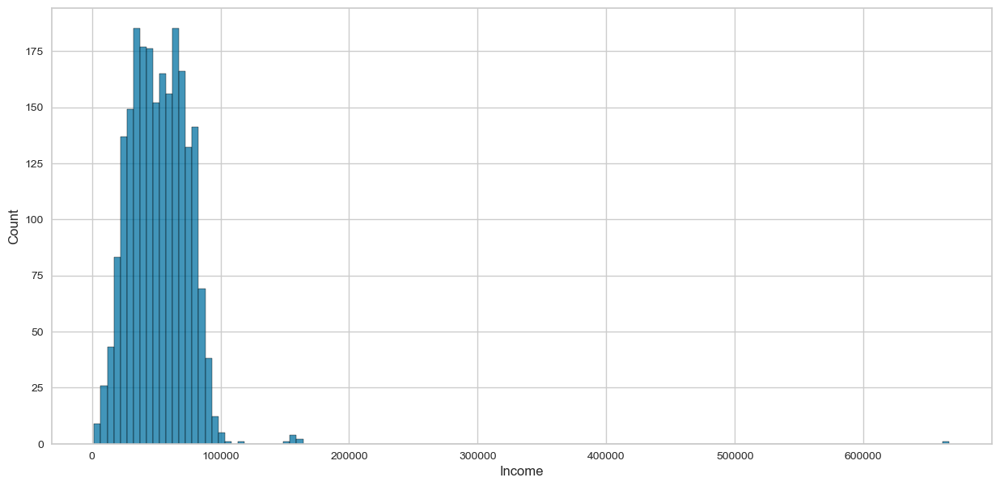

In [13]:
# Create histogram for the Income feature

plt.figure(figsize=(15, 7))
sns.histplot(x="Income", data=data)
plt.show()

<Axes: xlabel='Income'>

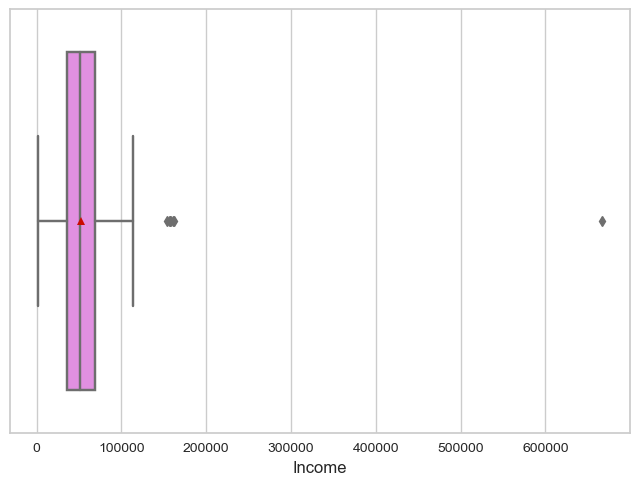

In [14]:
# Plot the boxplot
sns.boxplot(data=data, x="Income", showmeans=True, color="violet")

Their are extreme values inside Income. Thus we will find the values that are above the higher whisker of the box plot and remove them from the data.

In [15]:
# Calculating the upper whisker for the Income variable

Q1 = data.quantile(q=0.25)                          # Finding the first quartile

Q3 = data.quantile(q=0.75)                             # Finding the third quartile

IQR = Q3-Q1
upper_whisker = (Q3 + 1.5 * IQR)["Income"]          # Calculating the Upper Whisker for the Income variable

print(upper_whisker)

118350.5


In [16]:
# Let's check the observations with extreme value for the Income variable
data[data.Income > upper_whisker]

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
164,1973,PhD,Married,157243.0,0,1,01-03-2014,98,20,2,...,22,0,0,0,0,0,0,0,0,0
617,1976,PhD,Together,162397.0,1,1,03-06-2013,31,85,1,...,0,1,1,0,0,0,0,0,0,0
655,1975,Graduation,Divorced,153924.0,0,0,07-02-2014,81,1,1,...,0,0,0,0,0,0,0,0,0,0
687,1982,PhD,Married,160803.0,0,0,04-08-2012,21,55,16,...,28,1,0,0,0,0,0,0,0,0
1300,1971,Master,Together,157733.0,1,0,04-06-2013,37,39,1,...,0,1,1,0,0,0,0,0,0,0
1653,1977,Graduation,Together,157146.0,0,0,29-04-2013,13,1,0,...,28,0,1,0,0,0,0,0,0,0
2132,1949,PhD,Married,156924.0,0,0,29-08-2013,85,2,1,...,0,0,0,0,0,0,0,0,0,0
2233,1977,Graduation,Together,666666.0,1,0,02-06-2013,23,9,14,...,1,3,6,0,0,0,0,0,0,0


In [17]:
# Check the 99.5% percentile value for the Income variable
data.quantile(q=0.995)["Income"]

102145.75000000003

In [18]:
# Dropping observations identified as outliers
data.drop(index=[164, 617, 655, 687,1300, 1653, 2132,2233], inplace=True) # Pass the indices of the observations (separated by a comma) to drop them

### **Exploring all numerical variables after the income transformation**

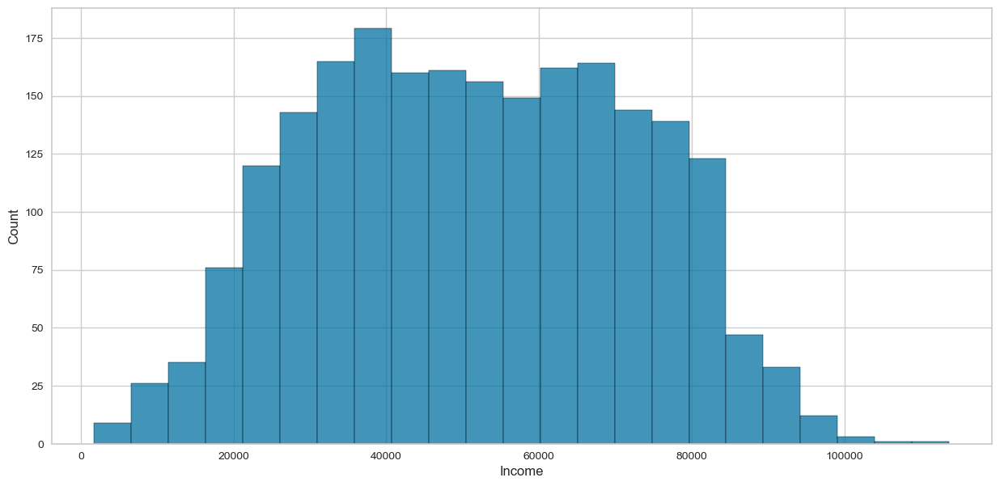

In [19]:
# Create histogram for the Income feature

plt.figure(figsize=(15, 7))
sns.histplot(x="Income", data=data)
plt.show()

Now the distribution looks somehow like a normal one. 

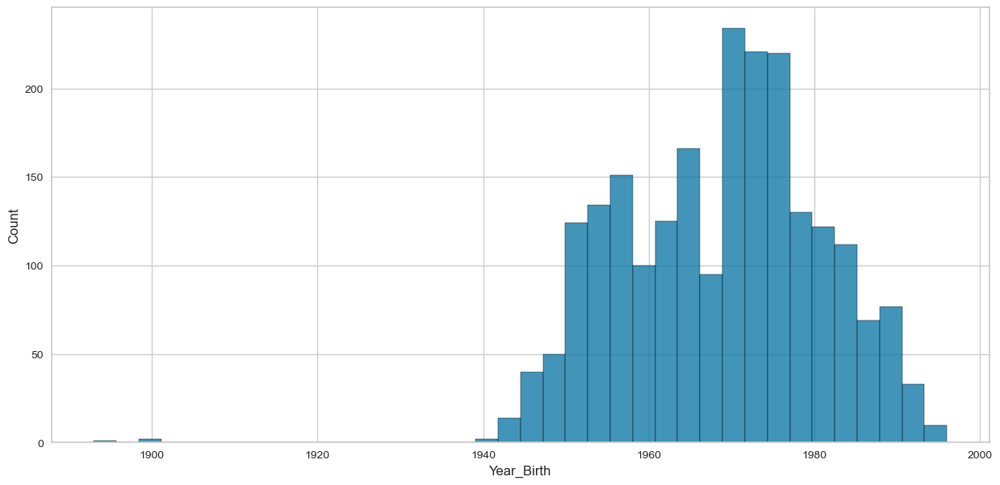

In [20]:
# Create histogram for the Year_Birth feature

plt.figure(figsize=(15, 7))
sns.histplot(x="Year_Birth", data=data)
plt.show()

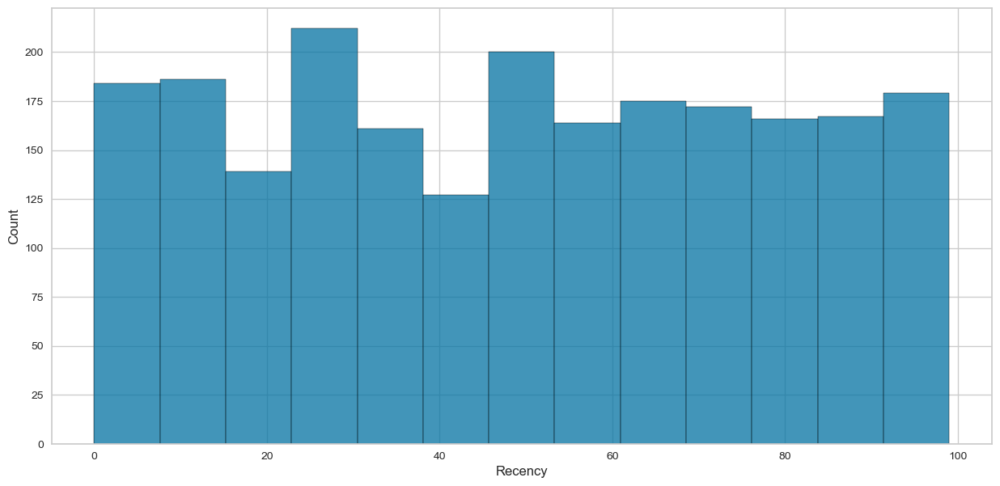

In [21]:
# Create histogram for the Recency feature

plt.figure(figsize=(15, 7))
sns.histplot(x="Recency", data=data)
plt.show()

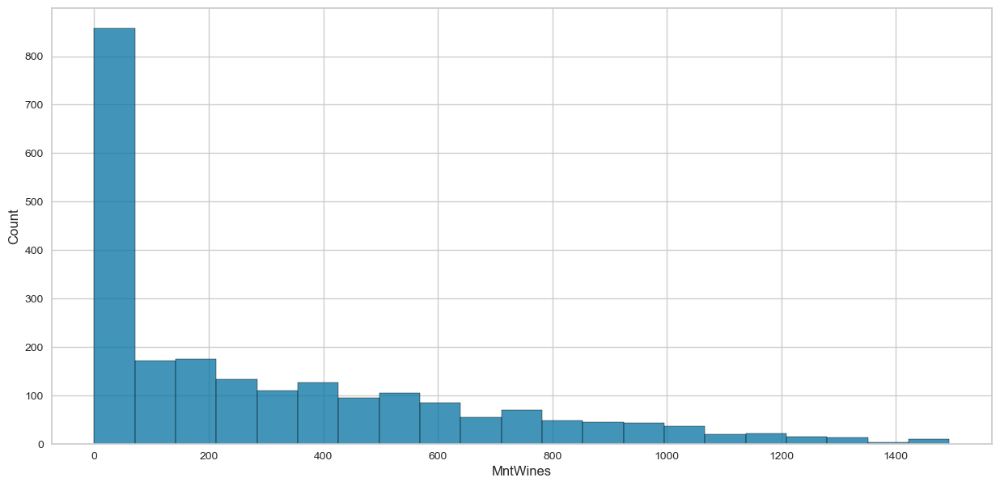

In [22]:
# Create histogram for the MntWines feature

plt.figure(figsize=(15, 7))
sns.histplot(x="MntWines", data=data)
plt.show()

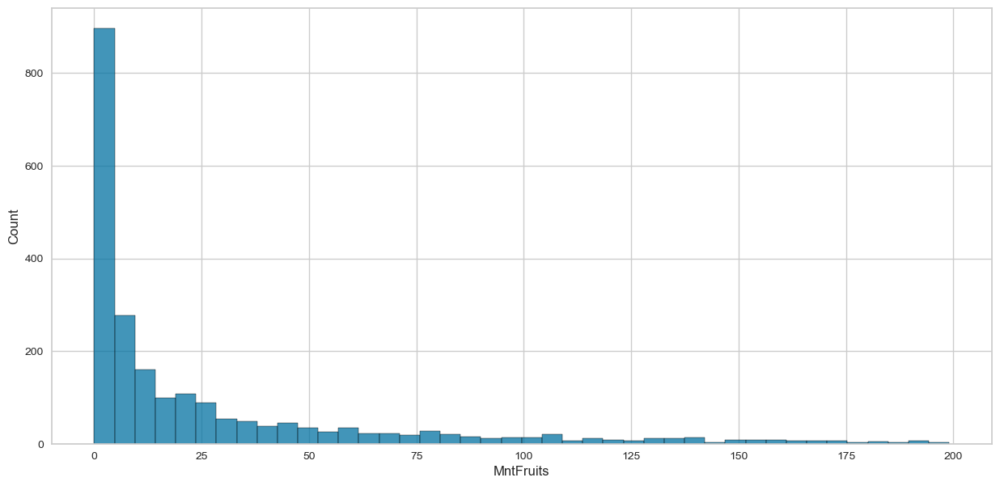

In [23]:
# Create histogram for the MntFruits feature

plt.figure(figsize=(15, 7))
sns.histplot(x="MntFruits", data=data)
plt.show()

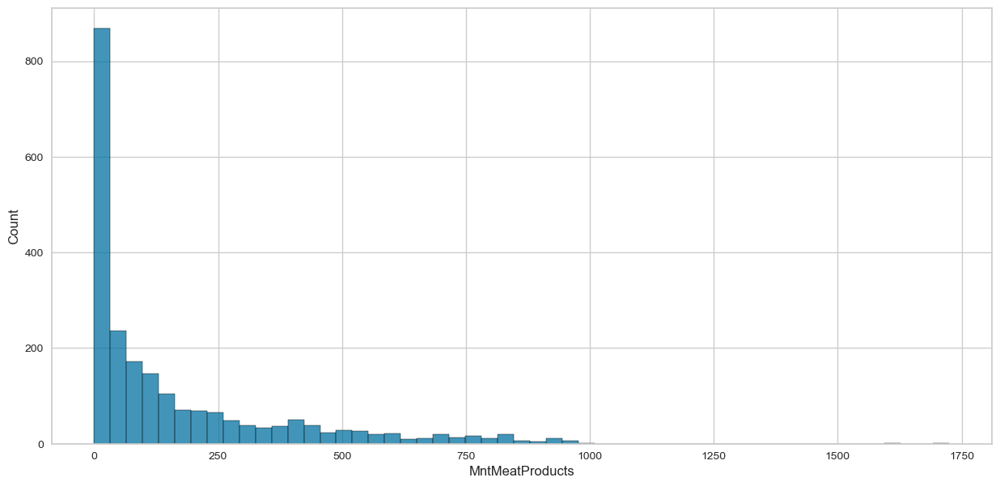

In [24]:
# Create histogram for the MntMeatProducts feature

plt.figure(figsize=(15, 7))
sns.histplot(x="MntMeatProducts", data=data)
plt.show()

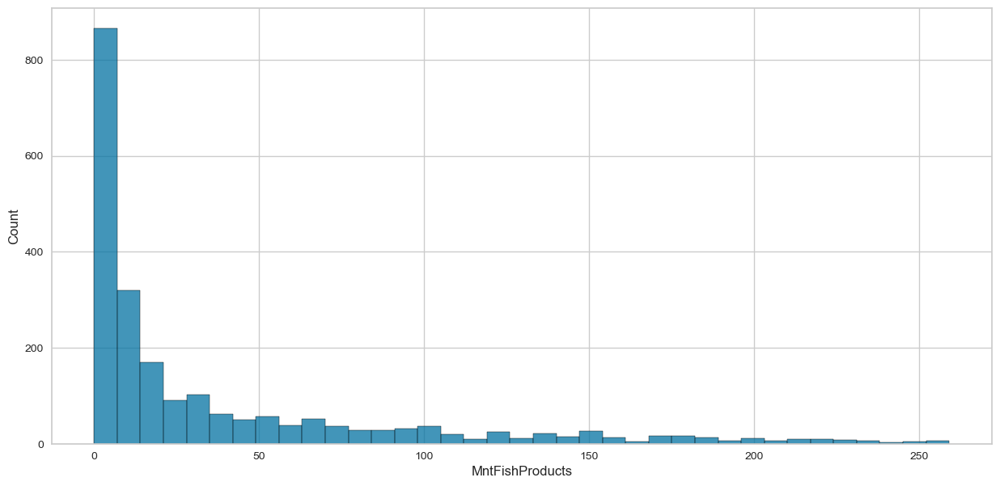

In [25]:
# Create histogram for the MntFishProducts feature

plt.figure(figsize=(15, 7))
sns.histplot(x="MntFishProducts", data=data)
plt.show()

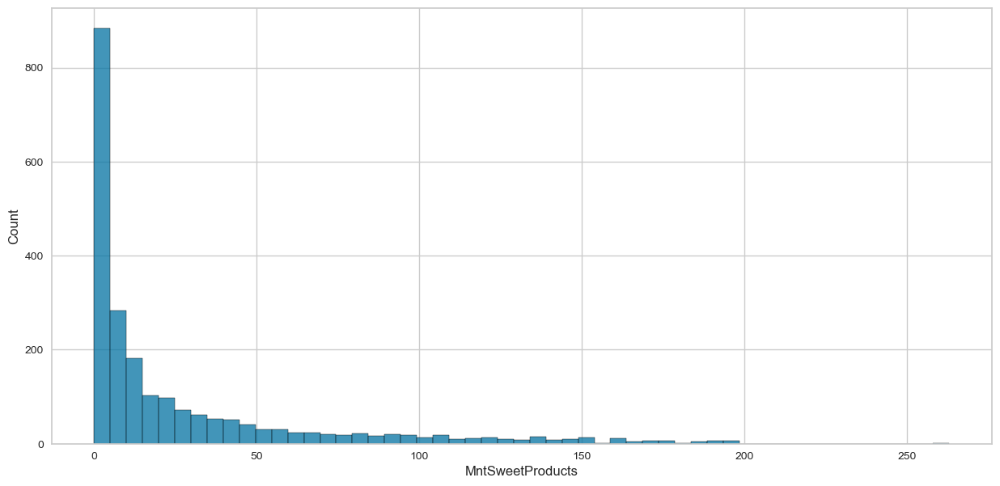

In [26]:
# Create histogram for the MntSweetProducts feature

plt.figure(figsize=(15, 7))
sns.histplot(x="MntSweetProducts", data=data)
plt.show()

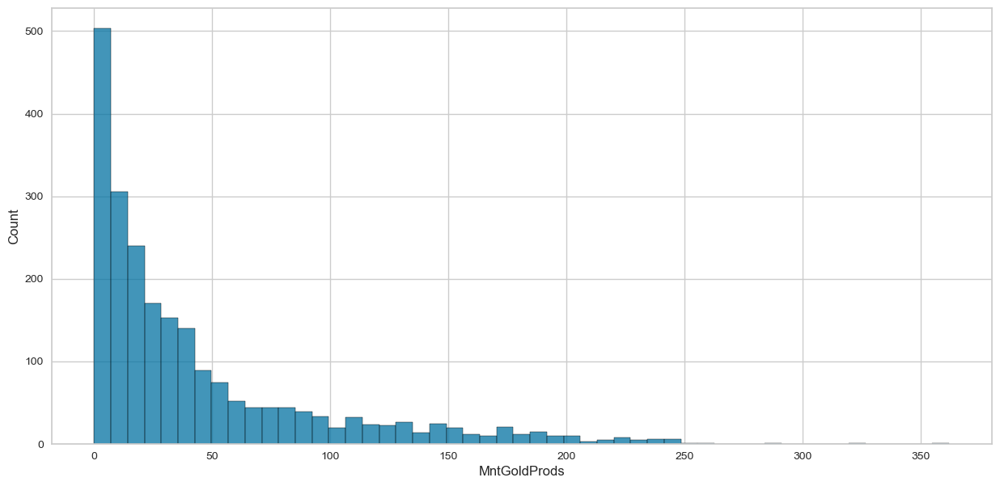

In [27]:
# Create histogram for the MntGoldProds feature

plt.figure(figsize=(15, 7))
sns.histplot(x="MntGoldProds", data=data)
plt.show()

**Observations:** Recency has a Uniform distribution. On the other hand most variables have some kind of exponential distribution with most results been around 0. If you remove extreme values, Year_Birth and Income have distributions that are near to normal.  

### **Removing Non-null values of Income**

Income hasn't got a completely normal distribution with a somehow flat distribution with values that drop in the extremes. Therefore, we will fill null values by the median of income.

In [28]:
# Replace null values with the calculated mean
data['Income'].fillna(data['Income'].median(), inplace=True)

### **Year of Birth**

The year of Birth has some values that simply don't make sense. Either their was a mistake or the people answering our questions were intentionally lying to us. These values are those that we find under 1900 meaning the ones answering this questions had over 110 years when the survey were taken. Therefore we will drop these values.  

In [29]:
# Let's check values of people that claim that they are older than 100 years.
data[data.Year_Birth < 1910]

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
192,1900,Master,Divorced,36640.0,1,0,26-09-2013,99,15,6,...,1,2,5,0,0,0,0,0,1,0
239,1893,Master,Single,60182.0,0,1,17-05-2014,23,8,0,...,0,2,4,0,0,0,0,0,0,0
339,1899,PhD,Together,83532.0,0,0,26-09-2013,36,755,144,...,6,4,1,0,0,1,0,0,0,0


In [30]:
data.drop(index=[192,239, 339], inplace=True) # Pass the indices of the observations (separated by a comma) to drop them

In [31]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2229 entries, 0 to 2239
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Year_Birth           2229 non-null   int64  
 1   Education            2229 non-null   object 
 2   Marital_Status       2229 non-null   object 
 3   Income               2229 non-null   float64
 4   Kidhome              2229 non-null   int64  
 5   Teenhome             2229 non-null   int64  
 6   Dt_Customer          2229 non-null   object 
 7   Recency              2229 non-null   int64  
 8   MntWines             2229 non-null   int64  
 9   MntFruits            2229 non-null   int64  
 10  MntMeatProducts      2229 non-null   int64  
 11  MntFishProducts      2229 non-null   int64  
 12  MntSweetProducts     2229 non-null   int64  
 13  MntGoldProds         2229 non-null   int64  
 14  NumDealsPurchases    2229 non-null   int64  
 15  NumWebPurchases      2229 non-null   i

<Axes: xlabel='Year_Birth', ylabel='Count'>

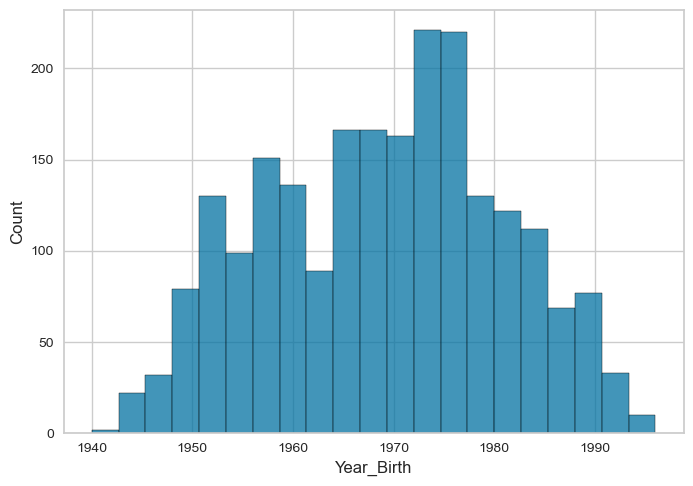

In [32]:
sns.histplot(data['Year_Birth'])

# **Univariate analysis for Categorical Variables**

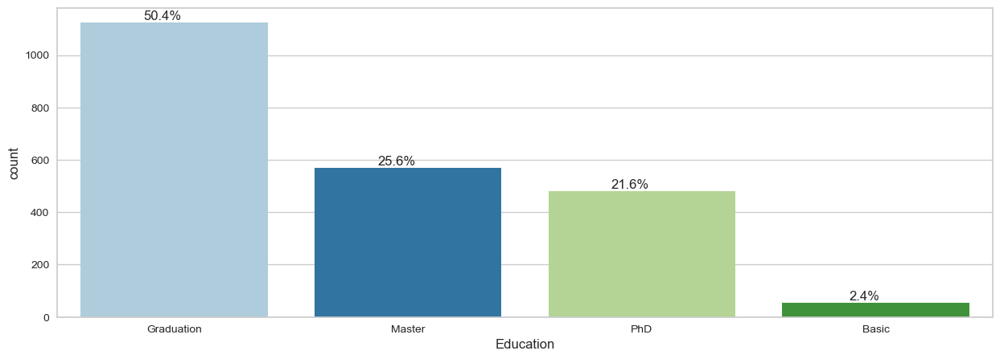

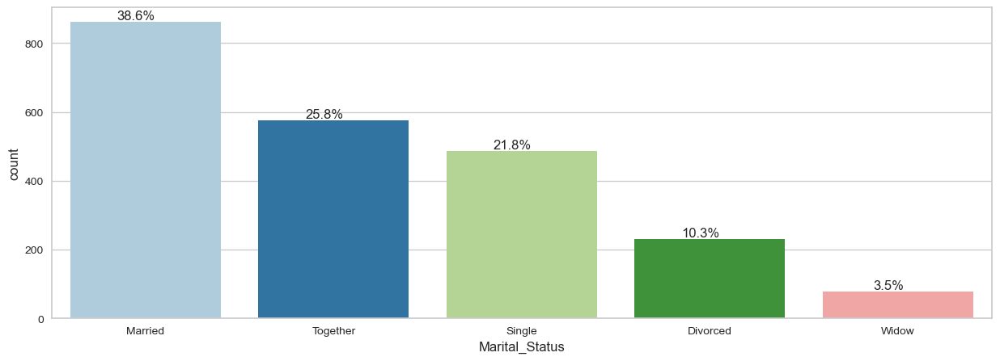

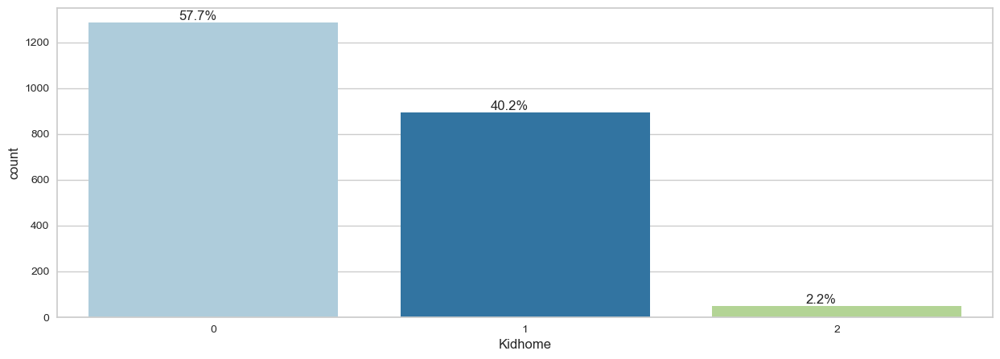

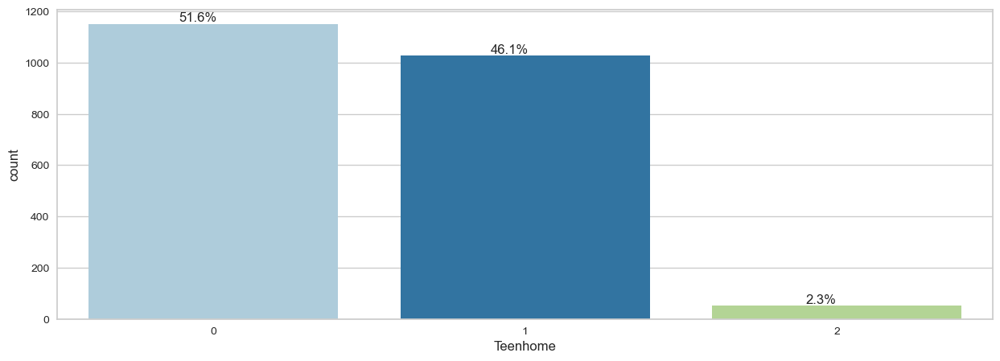

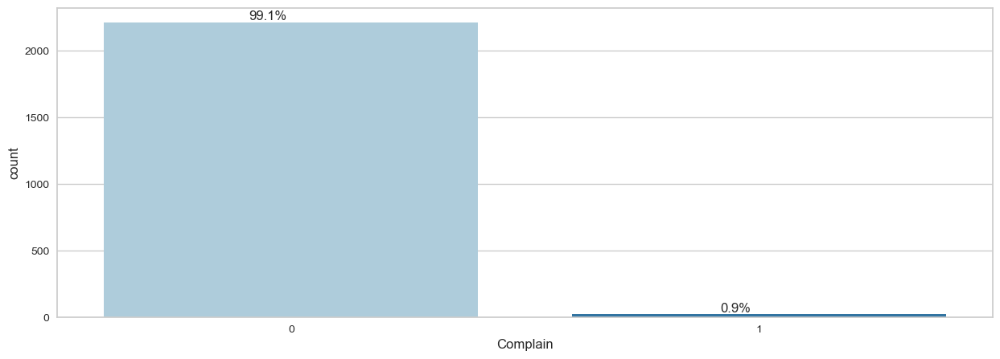

...

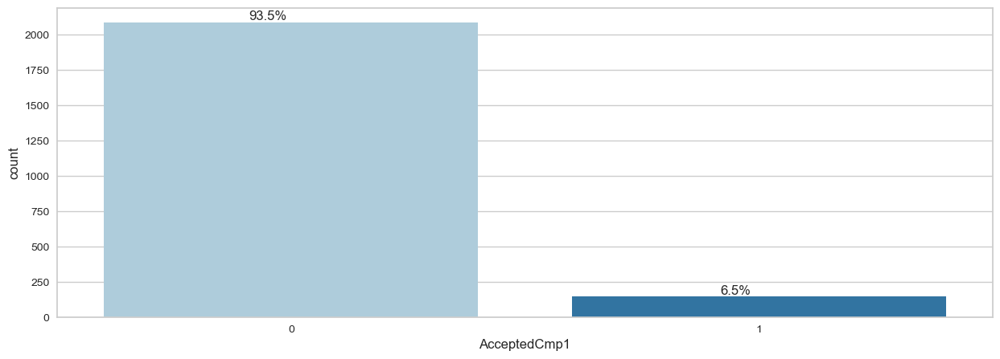

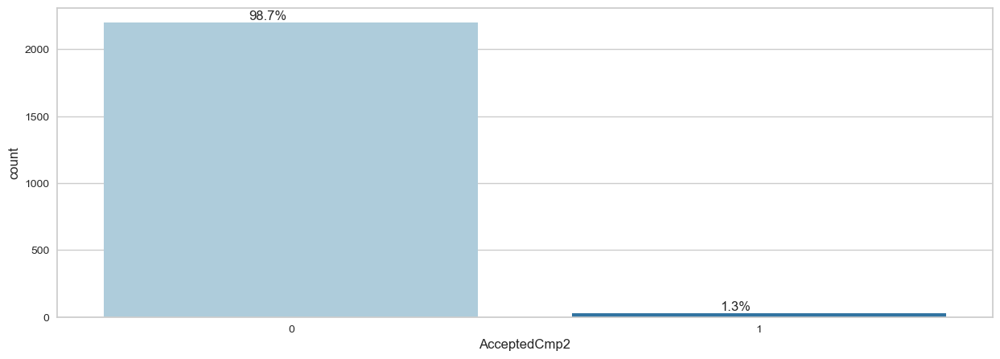

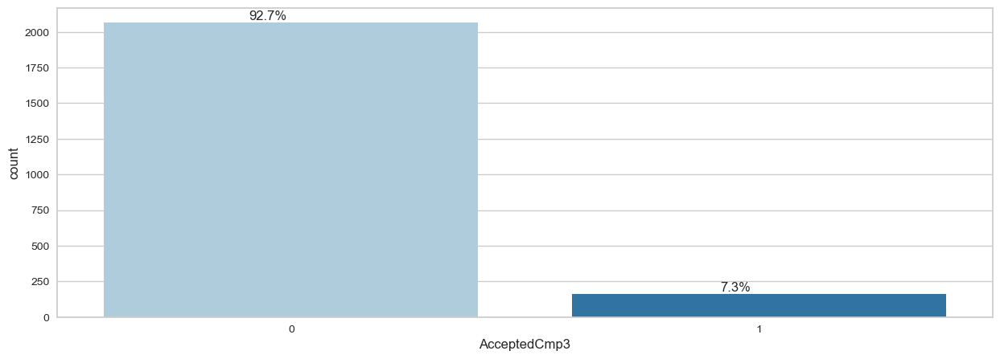

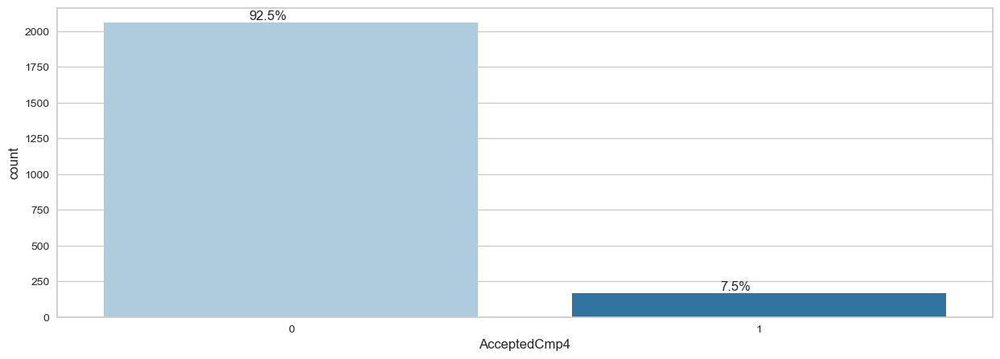

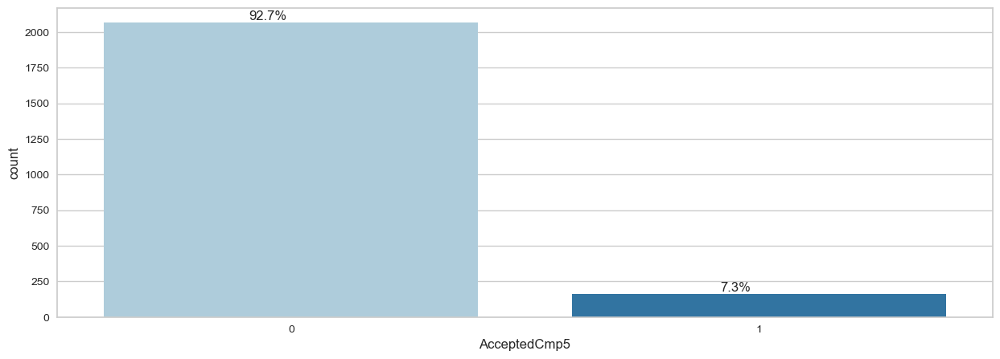

In [33]:

def perc_on_bar_numerical(data, z):
    '''
    Plot
    feature: categorical feature
    The function won't work if a column is passed in hue parameter. We use this to work with categorical variables contained as numerical.
    '''

    total = len(data[z])                                          # Length of the column
    plt.figure(figsize=(15,5))
    ax = sns.countplot(x=z, data=data.astype(str), palette='Paired', order=data[z].astype(str).value_counts().index)
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total) # Percentage of each class of the category
        x = p.get_x() + p.get_width() / 2 - 0.05                  # X coordinate of the bar
        y = p.get_height()                                        # Height of the plot

        ax.annotate(percentage, (x, y), size=12, ha='center', va='bottom')  # Annotate the percentage 

    plt.show()

# Example usage:
for col in cols_cat:
    perc_on_bar_numerical(data, col)

**Observations:** Complain has very low amount of people that complain in the last year, which means that probably won't help with segmentation or profiling. This means that probably the variable doesn't carry any relevant information. Furthermore more the AcceptedCmp is related to Response, and its very low in most cases. Therefore, further onto the analysis this variable will be transformed into something that is more usable. 

# **Bivariate Analysis**

 - Analyze different categorical and numerical variables and check how different variables are related to each other.
 - Check the relationship of numerical variables with categorical variables.

### Numerical relationships

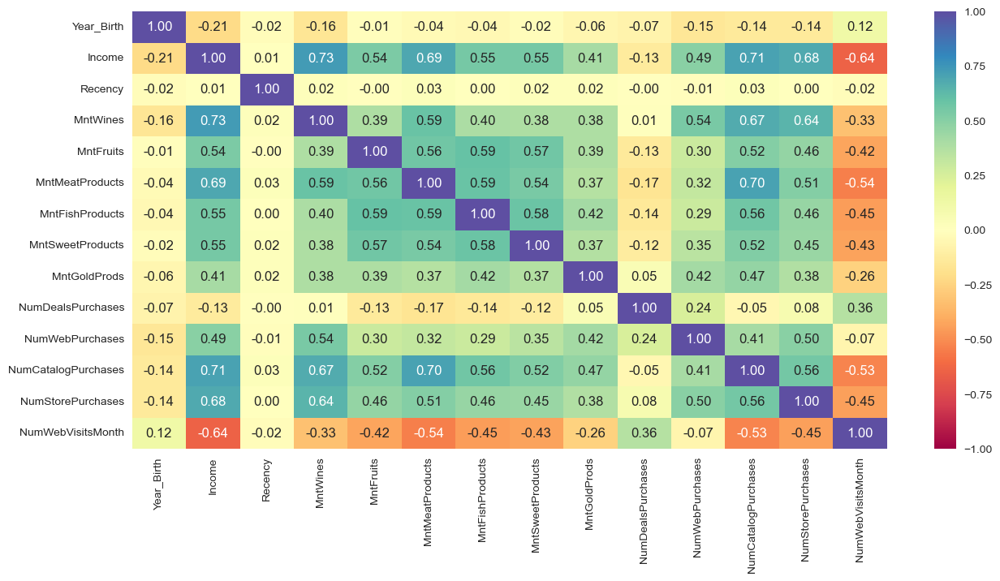

In [34]:
plt.figure(figsize=(15, 7))                                                        # Setting the plot size
sns.heatmap(data[cols_num].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")  # Plotting the correlation plot
plt.show()

**Observations:** A lot of the variables show high correlations in between them. This is called multicollinearity and could be problematic with some clustering methods. 

# Categorical data
For categorical data the weighted- cross occurance were plot. We weighted this cross occurance by the total values on that row to try to avoid the overrepresentation of categories that just had more values attach to them. Not much useful information was extracted after this process. To avoid cluttering the Notebook we will just show examples with four of the categorical variables.

<Axes: xlabel='Marital_Status'>

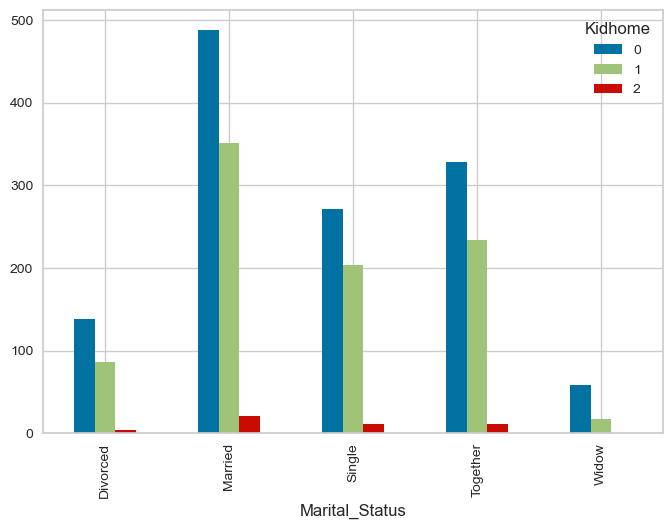

In [35]:
pd.crosstab(data['Marital_Status'], data['Kidhome']).plot(kind='bar', stacked=False)

<Axes: xlabel='Marital_Status'>

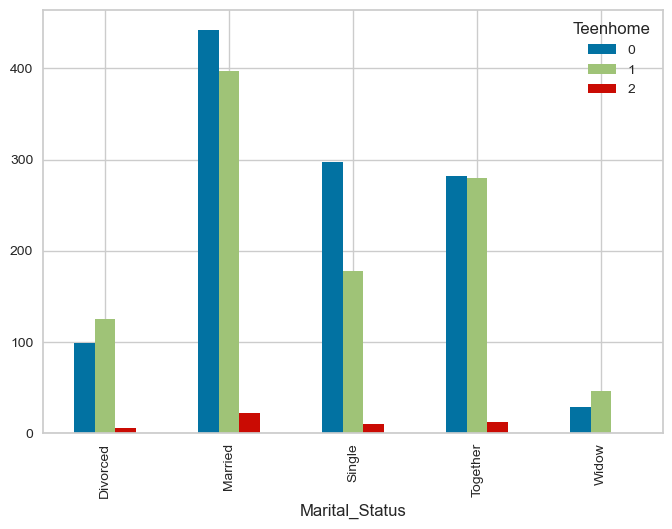

In [36]:
pd.crosstab(data['Marital_Status'], data['Teenhome']).plot(kind='bar', stacked=False)

<Axes: xlabel='Education'>

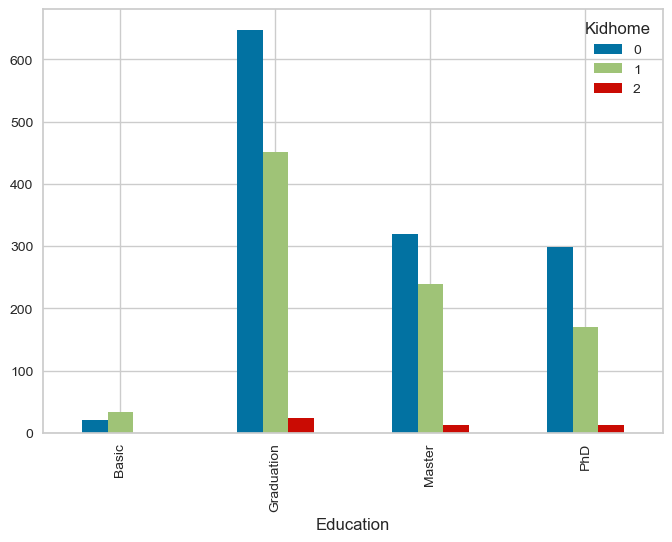

In [37]:
pd.crosstab(data['Education'], data['Kidhome']).plot(kind='bar', stacked=False)

<Axes: xlabel='Education'>

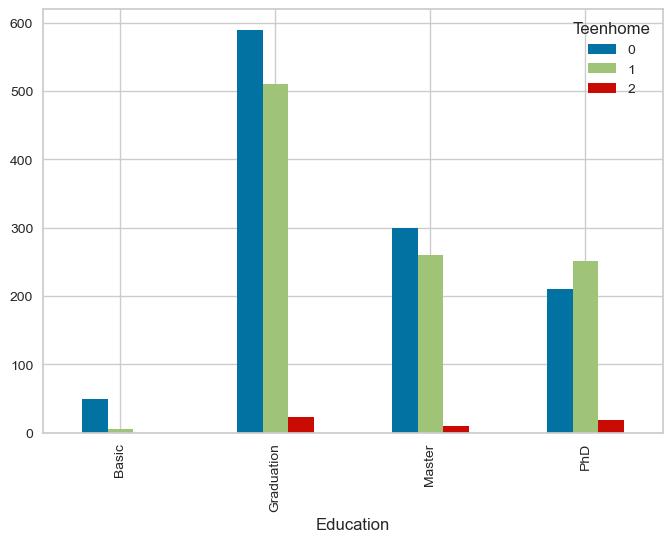

In [38]:
pd.crosstab(data['Education'], data['Teenhome']).plot(kind='bar', stacked=False)

<Axes: xlabel='Marital_Status'>

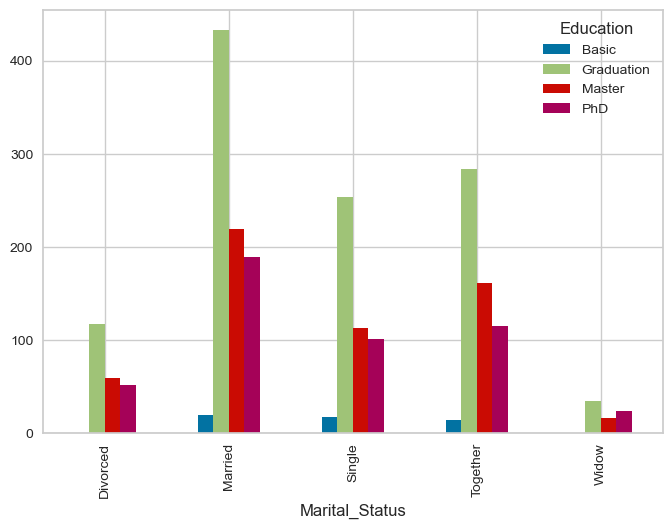

In [39]:
pd.crosstab(data['Marital_Status'], data['Education']).plot(kind='bar', stacked=False)

**Observations:** We don't seem to find a clear relation between the Marital status of couples and the teens and kids in the house, which is kind of surpising. 

# Numerical and Categorical Variables together

<Axes: xlabel='Education', ylabel='Income'>

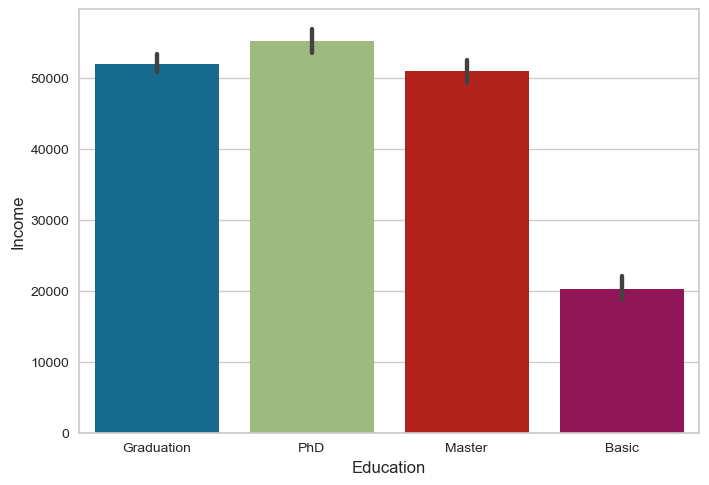

In [40]:
# Plot the bar plot for Education vs. Income
sns.barplot(x='Education', y='Income', data=data)

<Axes: xlabel='Marital_Status', ylabel='Income'>

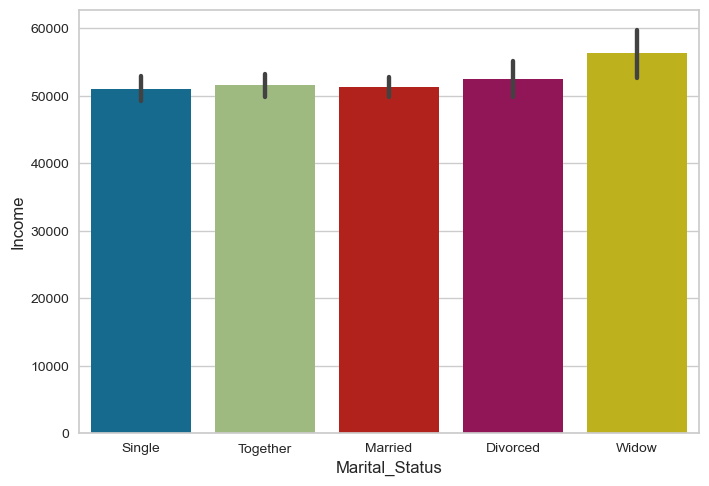

In [41]:
# Plot the bar plot for Education vs. Income
sns.barplot(x='Marital_Status', y='Income', data=data)

<Axes: xlabel='Kidhome', ylabel='Income'>

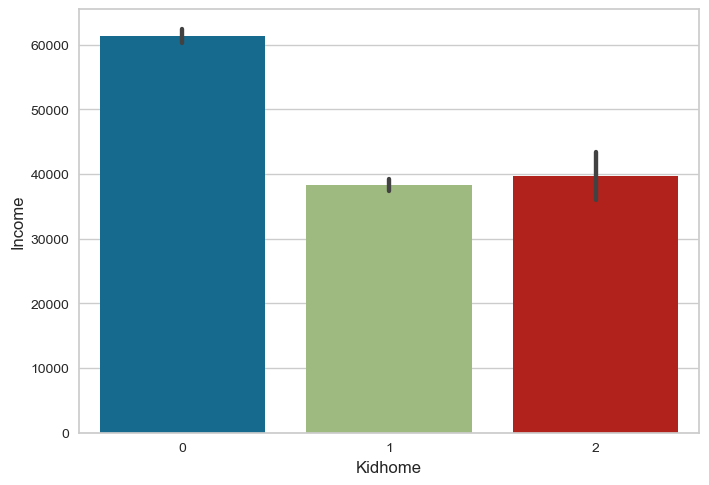

In [42]:
# Plot the bar plot for Education vs. Income
sns.barplot(x='Kidhome', y='Income', data=data)

<Axes: xlabel='Teenhome', ylabel='Income'>

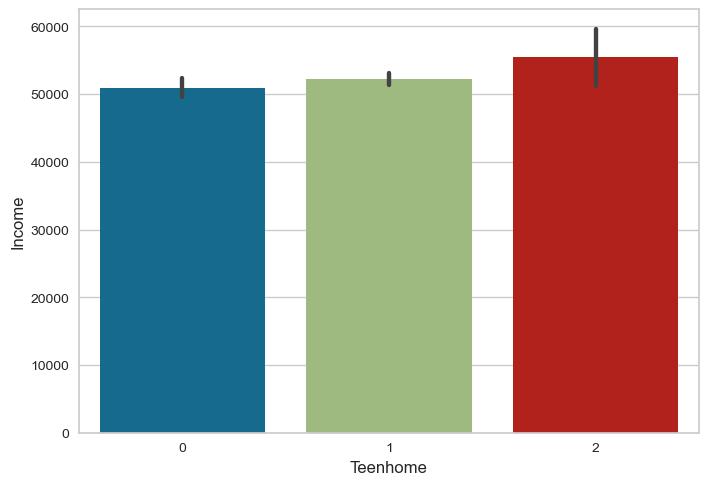

In [43]:
# Plot the bar plot for Education vs. Income
sns.barplot(x='Teenhome', y='Income', data=data)

**Observations:** Their is no clear relation of Income with Teenhome and Kidhome, or with Marital Status. However, their is a relation in between income and Education with lower levels of education having lower incomes. 

# **Feature Engineering and Data Processing**


We will create a set of variables from our data: 

- We will generate a variable `Age` from `Year_Birth`.  
- `Total_Offspring` combining `Teenhome` and `Kidhome`.
- `Couple Status`, simplying `Marital_Status`, into Single and Relationship.
- `Family_Size` using the `Couple_Status` and the `Total_Offspring` to calculate this.
- `Expenses` combining all types of expenses. 
- Days engage with the company (`Engaged_in_days`) using the `Dt_costumer` that is the day the customer enroll with the company.
- Total Accepted Campaings (`TotalAcceptedCmp`), the amount of campaigns accepted by the customer.
- Number of Total Purchaes (`NumTotalPurchases`), the amount of purchases of the customer.
- Amount per Purchase (`AmountPerPurchase`), the amount of expenses per purchaes.

### **Age**


In [44]:
# Extract only the year from the Year_Birth variable and subtracting it from 2015 will give us the age of the customer at the time of data collection in 2015.

data["Age"] = 2015 - pd.to_datetime(data["Year_Birth"], format="%Y").apply(lambda x: x.year)

# Sorting the values in ascending order
print("The max Age is:" ,data["Age"].max())
print("The min Age is:" ,data["Age"].min())
print("The median Age is:" ,data["Age"].median())

The max Age is: 75
The min Age is: 19
The median Age is: 45.0


### Total Offspring

In [45]:
# Total offspring can be calculated easily by summing up Teens and Kids in a Home.
data['Total_Offspring']=  data[['Kidhome','Teenhome']].sum(axis=1)
 # Sorting the values in ascending order
print("The max Total Kids is:" ,data["Total_Offspring"].max())
print("The min Total Kids is:" ,data["Total_Offspring"].min())
print("The mode Total Kids is:" ,data["Total_Offspring"].mode())

The max Total Kids is: 3
The min Total Kids is: 0
The mode Total Kids is: 0    1
Name: Total_Offspring, dtype: int64


### **Couple Status**

In [46]:
# It is possible that a variable that groups Marital Status into less categories, will be helpful. In any case such a variable will help us calculate the amount of people that live in a house.
data.loc[data["Marital_Status"].isin(["Single", "Divorced", "Widow"]), "Couple_Status"] = "Single"
data.loc[data["Marital_Status"].isin(["Married", "Together",]), "Couple_Status"] = "Relationship"

### Family Size

In [47]:
# Create a new feature called "Status" by replacing "Single" with 1 and "Relationship" with 2 in Marital_Status
data["Status"] = data["Couple_Status"].replace({"Single": 1, "Relationship": 2})

In [48]:
data["Family_Size"] = data[["Status",'Total_Offspring']].sum(axis=1)
data["Family_Size"].describe()

count    2229.000000
mean        2.596231
std         0.907432
min         1.000000
25%         2.000000
50%         3.000000
75%         3.000000
max         5.000000
Name: Family_Size, dtype: float64

### Expenses

In [49]:
# Add the amount spent on each of product 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds'
data["Expenses"] = data[["MntWines","MntFruits","MntMeatProducts","MntFishProducts","MntSweetProducts","MntGoldProds"]].sum(axis=1)
data["Expenses"].describe()

count    2229.000000
mean      605.541050
std       601.032228
min         5.000000
25%        69.000000
50%       397.000000
75%      1044.000000
max      2525.000000
Name: Expenses, dtype: float64

### Engage

In [50]:
# Converting Dt_customer variable to Python date time object
data["Dt_Customer"] = pd.to_datetime(data["Dt_Customer"])
data["Dt_Customer"]

print("First date a customer enroll with the company:", data["Dt_Customer"].min())
print("Last date a customer enroll with the company:", data["Dt_Customer"].max())

First date a customer enroll with the company: 2012-01-08 00:00:00
Last date a customer enroll with the company: 2014-12-06 00:00:00


In [51]:
#Last enroll date we have in our Survey is 2014. Taking into account we assume that the data was taken in 2015. We will assume the date that this data was take was 1st january 2015.
# Assigning date to the day variable
data["day"] = "01-01-2015"

# Converting the variable day to Python datetime object
data["day"] = pd.to_datetime(data.day)

In [52]:
# Now we can calculate the amount of days the person spend in the company.
data["Engaged_in_days"] = (data["day"] - data["Dt_Customer"]).dt.days
data['Engaged_in_days'].describe()

count    2229.000000
mean      538.099148
std       232.287894
min        26.000000
25%       367.000000
50%       539.000000
75%       712.000000
max      1089.000000
Name: Engaged_in_days, dtype: float64

### Total Accepted Campaigns

In [53]:
# Add all the campaign related variables to get the total number of accepted campaigns by a customer
# "AcceptedCmp1", "AcceptedCmp2", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5", "Response"
data["TotalAcceptedCmp"] = data["AcceptedCmp1"]+data["AcceptedCmp2"]+data["AcceptedCmp3"]+data["AcceptedCmp4"]+data["AcceptedCmp5"]
print("The max Accepted Offers is:" ,data["TotalAcceptedCmp"].max())
print("The min Accepted Offers is:" ,data["TotalAcceptedCmp"].min())
print("The mode Accepted Offers is:" ,data["TotalAcceptedCmp"].mode())

The max Accepted Offers is: 4
The min Accepted Offers is: 0
The mode Accepted Offers is: 0    0
Name: TotalAcceptedCmp, dtype: int64


### Number of Total Purchases

In [54]:
# Calculate the amount of total Purchases by adding up each type of purchas ('NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases')
data["NumTotalPurchases"] = data[['NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases']].sum(axis=1)
data['NumTotalPurchases'].describe()

count    2229.000000
mean       14.869000
std         7.622187
min         0.000000
25%         8.000000
50%        15.000000
75%        21.000000
max        43.000000
Name: NumTotalPurchases, dtype: float64

### Amount per Purchase

In [55]:
# We will calaculate how much he Spend per purchase. To do so we simply divide the Expenses per number of purchases.
data['AmountPerPurchase'] = data['Expenses'] / data["NumTotalPurchases"]
data['AmountPerPurchase'].describe()

count    2229.000000
mean             inf
std              NaN
min         0.533333
25%         9.714286
50%        23.375000
75%        45.375000
max              inf
Name: AmountPerPurchase, dtype: float64

In [56]:
# Inf results are happening cause, at least in some cases NumTotalPurchases are equal to 0. We will now find the cases where this happens, and if they are a smaller enough amount we will drop them.
data[data['NumTotalPurchases'] == 0]

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,Total_Offspring,Couple_Status,Status,Family_Size,Expenses,day,Engaged_in_days,TotalAcceptedCmp,NumTotalPurchases,AmountPerPurchase
981,1965,Graduation,Divorced,4861.0,0,0,2014-06-22,20,2,1,...,0,Single,1,1,6,2015-01-01,193,0,0,inf
1524,1973,Graduation,Single,3502.0,1,0,2013-04-13,56,2,1,...,1,Single,1,2,5,2015-01-01,628,0,0,inf


In [57]:
data = data[data['NumTotalPurchases'] != 0]

In [58]:
data['AmountPerPurchase'].describe()

count    2227.000000
mean       33.274270
std        45.040897
min         0.533333
25%         9.714286
50%        23.352941
75%        45.281773
max      1679.000000
Name: AmountPerPurchase, dtype: float64

<Axes: xlabel='AmountPerPurchase', ylabel='Count'>

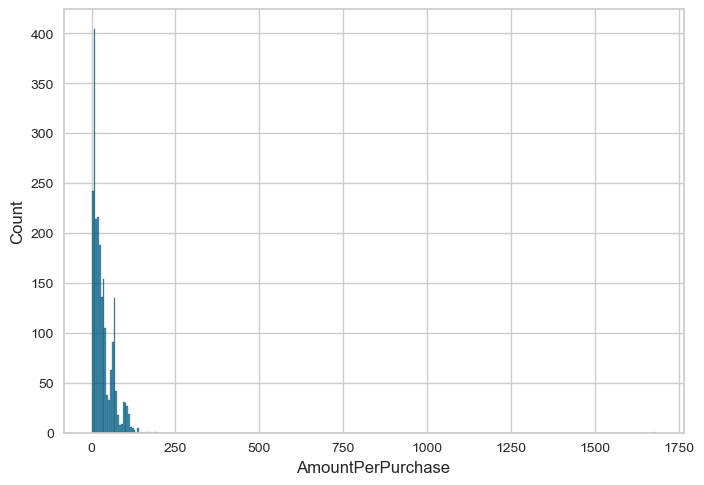

In [59]:
sns.histplot(data['AmountPerPurchase'])

<Axes: xlabel='AmountPerPurchase'>

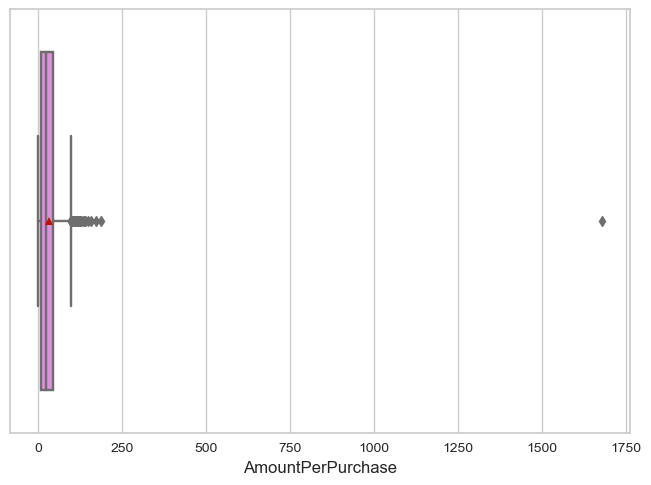

In [60]:
# Plot the boxplot
sns.boxplot(data=data, x="AmountPerPurchase", showmeans=True, color="violet")

Their is a extremely high value compared to the rest. We will remove it as it may affect methods such as k-means.

In [61]:
# Inf results are happening cause, at least in some cases NumTotalPurchases are equal to 0. We will now find the cases where this happens, and if they are a smaller enough amount we will drop them.
data = data[data['AmountPerPurchase'] < 750]

<Axes: xlabel='AmountPerPurchase'>

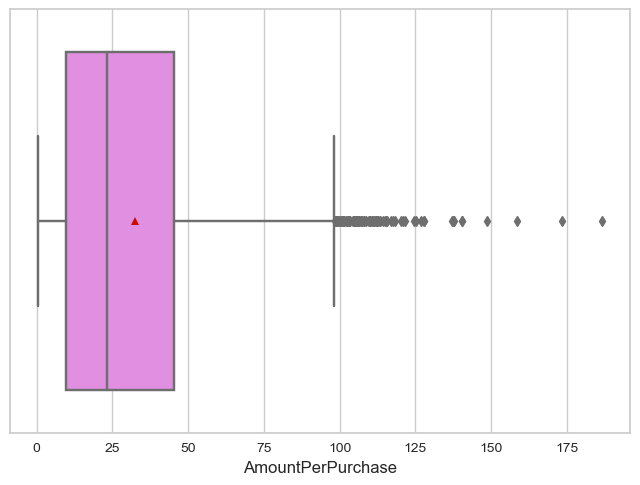

In [62]:
sns.boxplot(data=data, x="AmountPerPurchase", showmeans=True, color="violet")

<Axes: xlabel='AmountPerPurchase', ylabel='Count'>

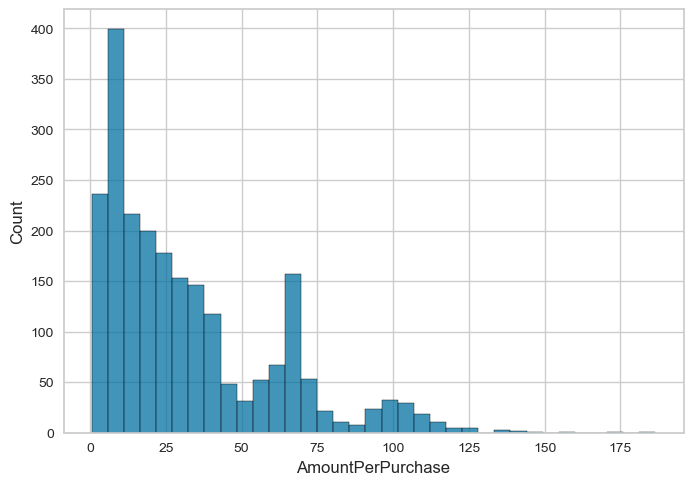

In [63]:
sns.histplot(data['AmountPerPurchase'])

# **Important Insights from EDA and Data Preprocessing**


## **Data Preparation for Segmentation**

The decision about which variables to use for clustering is a critically important decision that will have a big impact on the clustering solution. A lot of the numerical variables have high correlations with each other. Thus, probably some kind of transformation needs to be done into these variables to ensure we do not have multicollinearity.

Here, we will use the behavioral attributes for segmentation and drop the demographic attributes like Income, Age, and Family_Size. In addition to this, we need to drop some other columns which are mentioned below because they were transformed into other variables or we feel they are of no interest for the segmentation:

* `Dt_Customer`: We have created the `Engaged_in_days` variable using the Dt_Customer variable. Hence, we can drop this variable as it will not help with segmentation.
* `Complain`: About 95% of the customers didn't complain and have the same value for this column. This variable will not have a major impact on segmentation. Hence, we can drop this variable. 
* `day`:  We have created the `Engaged_in_days` variable using the 'day' variable. Hence, we can drop this variable as it will not help with segmentation.
* `Status`: This column was created just to get the `Family_Size` variable that contains the information about the Status. Hence, we can drop this variable.
* We also need to drop categorical variables like `Education` and `Marital_Status`, `Total_Offspring`, `Kidhome`, and `Teenhome` as distance-based algorithms cannot use the default distance like Euclidean to find the distance between categorical and numerical variables.
* We can also drop categorical variables like `AcceptedCmp1`, `AcceptedCmp2`, `AcceptedCmp3`, `AcceptedCmp4`, `AcceptedCmp5`, and `Response` for which we have create the variable `TotalAcceptedCmp` which is the aggregate of all these variables.

In [64]:
# Dropping all the irrelevant columns and storing in data_model
data_model = data.drop(
    columns=[
        "Year_Birth",
        "Dt_Customer",
        "day",
        "Complain",
        "Response",
        "AcceptedCmp1",
        "AcceptedCmp2",
        "AcceptedCmp3",
        "AcceptedCmp4",
        "AcceptedCmp5",
        "Marital_Status",
        "Couple_Status",
        "Status",
        "Total_Offspring",
        'Education',
        'Kidhome',
        'Teenhome', 'Income','Age', 'Family_Size'
    ],
    axis=1,
)

In [65]:
data_model.shape

(2226, 17)

In [66]:
data_model.describe()

,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Expenses,Engaged_in_days,TotalAcceptedCmp,NumTotalPurchases,AmountPerPurchase
count,2226.000000,2226.000000,2226.000000,2226.000000,2226.000000,2226.000000,2226.000000,2226.000000,2226.000000,2226.000000,2226.000000,2226.000000,2226.000000,2226.000000,2226.000000,2226.000000,2226.000000
mean,49.114555,305.386343,26.382300,164.783917,37.687332,27.196316,44.161725,2.323001,4.105571,2.640162,5.819856,5.328841,605.597934,538.116801,0.298293,14.888589,32.534950
std,28.958923,336.816488,39.780237,217.289477,54.723363,41.355859,52.108201,1.894612,2.773242,2.796368,3.238030,2.399933,600.737270,232.276365,0.677714,7.608581,28.491805
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,26.000000,0.000000,1.000000,0.533333
25%,24.000000,24.000000,2.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,69.000000,367.000000,0.000000,8.000000,9.714286
50%,49.000000,177.500000,8.000000,67.500000,12.000000,8.000000,25.000000,2.000000,4.000000,2.000000,5.000000,6.000000,397.000000,539.000000,0.000000,15.000000,23.348346
75%,74.000000,505.000000,33.000000,230.750000,50.000000,34.000000,56.750000,3.000000,6.000000,4.000000,8.000000,7.000000,1043.750000,712.000000,0.000000,21.000000,45.185102
max,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,15.000000,27.000000,28.000000,13.000000,20.000000,2525.000000,1089.000000,4.000000,43.000000,186.500000


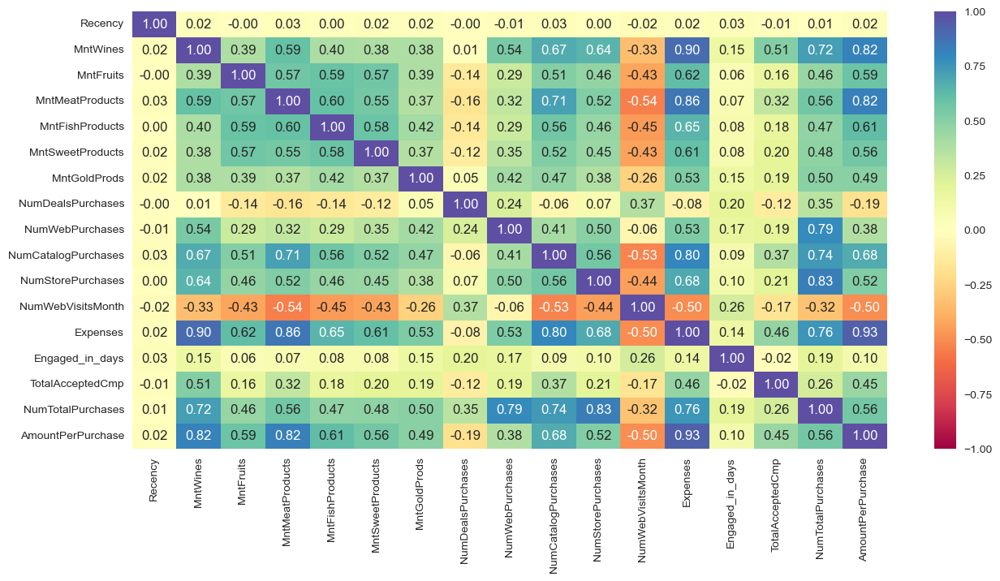

In [67]:
plt.figure(figsize=(15, 7))                                                        # Setting the plot size
sns.heatmap(data_model.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")  # Plotting the correlation plot
plt.show()

**Observations:** As could be expected the new variables introduce only increased the high levels of correlation found in between variables. Therefore, probably we need to apply some dimension reduction techniques, such as PCA, that ensure we don't have multicollinearity problems.  

# **Applying T-SNE and PCA to the data to visualize the data distributed in less dimensions**

To start with we need to scale all variables to ensure that no variables is overweighted in the final result. To do so their are a lot of ways of doing so. In this case we will use a standard scaler ensuring all the data has mean 0 and standard deviation 1. 

In [68]:
# Initialize the Standard Scaler
scaler = StandardScaler()

df_scaled = scaler.fit_transform(data_model)

# Converting the scaled data to a dataframe
df_scaled = pd.DataFrame(df_scaled, columns=data_model.columns)

# Display the first few rows of the scaled dataframe
df_scaled.describe()

,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Expenses,Engaged_in_days,TotalAcceptedCmp,NumTotalPurchases,AmountPerPurchase
count,2.226000e+03,2.226000e+03,2.226000e+03,2.226000e+03,2.226000e+03,2.226000e+03,2.226000e+03,2.226000e+03,2.226000e+03,2.226000e+03,2.226000e+03,2.226000e+03,2.226000e+03,2.226000e+03,2.226000e+03,2.226000e+03,2.226000e+03
mean,-1.197006e-17,1.915210e-17,-2.394012e-17,5.266826e-17,-4.947625e-17,-4.867824e-17,-4.149621e-17,-4.788024e-17,1.276806e-16,9.576048e-17,2.433912e-17,1.308727e-16,-6.224431e-17,-2.186531e-16,5.426427e-17,8.259341e-17,-2.170571e-16
std,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00,1.000225e+00
min,-1.696389e+00,-9.068884e-01,-6.633502e-01,-7.585316e-01,-6.888429e-01,-6.577648e-01,-8.476909e-01,-1.226384e+00,-1.480755e+00,-9.443519e-01,-1.797749e+00,-2.220911e+00,-9.949977e-01,-2.205269e+00,-4.402447e-01,-1.825795e+00,-1.123439e+00
25%,-8.674424e-01,-8.356170e-01,-6.130627e-01,-6.848806e-01,-6.340094e-01,-6.335790e-01,-6.749346e-01,-6.984532e-01,-7.594157e-01,-9.443519e-01,-8.710512e-01,-9.705954e-01,-8.934330e-01,-7.368604e-01,-4.402447e-01,-9.055745e-01,-8.011353e-01
50%,-3.956673e-03,-3.797768e-01,-4.622001e-01,-4.478163e-01,-4.695089e-01,-4.642783e-01,-3.678122e-01,-1.705222e-01,-3.807610e-02,-2.289776e-01,-2.532529e-01,2.797202e-01,-3.473146e-01,3.803215e-03,-4.402447e-01,1.464605e-02,-3.225022e-01
75%,8.595291e-01,5.927813e-01,1.663939e-01,3.036544e-01,2.250489e-01,1.645526e-01,2.416338e-01,3.574088e-01,6.832635e-01,4.863966e-01,6.734446e-01,6.964921e-01,7.295211e-01,7.487730e-01,-4.402447e-01,8.034066e-01,4.440924e-01
max,1.723015e+00,3.526788e+00,4.340258e+00,7.181971e+00,4.045117e+00,5.703102e+00,6.100953e+00,6.692581e+00,8.257329e+00,9.070888e+00,2.217940e+00,6.114526e+00,3.195795e+00,2.372204e+00,5.463278e+00,3.695528e+00,5.405050e+00


### **Applying T-SNE**

<Axes: xlabel='0', ylabel='1'>

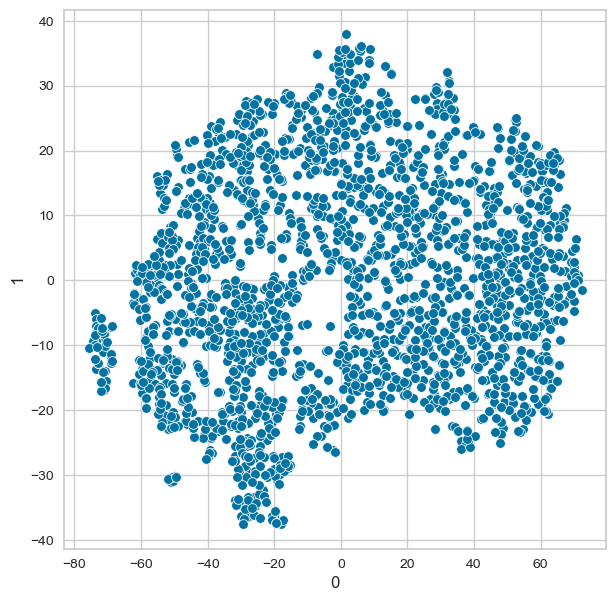

In [69]:
# Fitting T-SNE with number of components equal to 2 to visualize how data is distributed

tsne = TSNE(n_components=2, random_state=1, perplexity=35)        # Initializing T-SNE with number of component equal to 2, random_state=1, and perplexity=35

data_tsne =tsne.fit_transform(df_scaled)                          # fit_transform T-SNE on df_scaled

data_tsne = pd.DataFrame(data_tsne, columns=[0, 1])           # Converting the embeddings to a dataframe

plt.figure(figsize=(7, 7))                                                    # Scatter plot for two components

sns.scatterplot(x=0, y=1, data=data_tsne)     

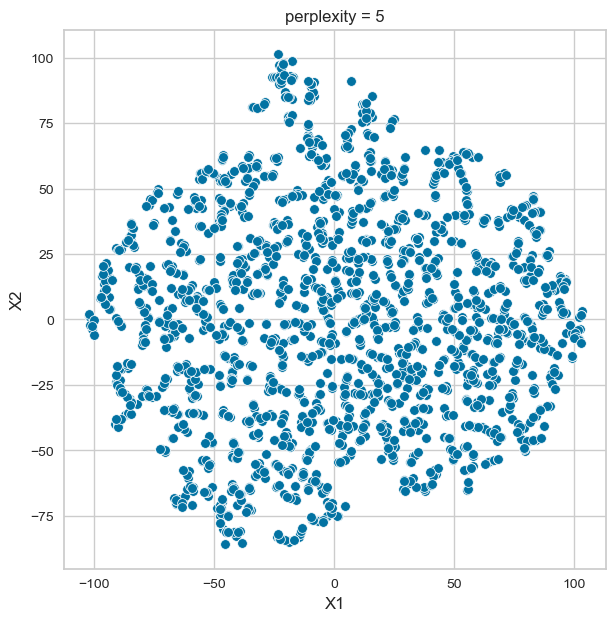

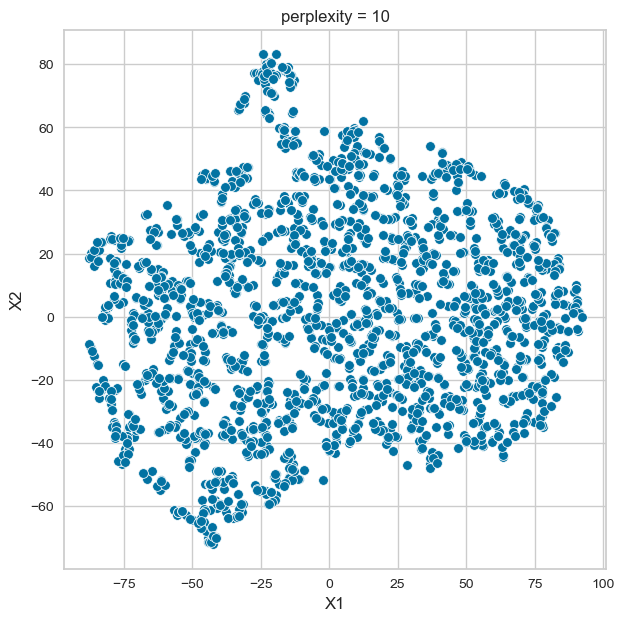

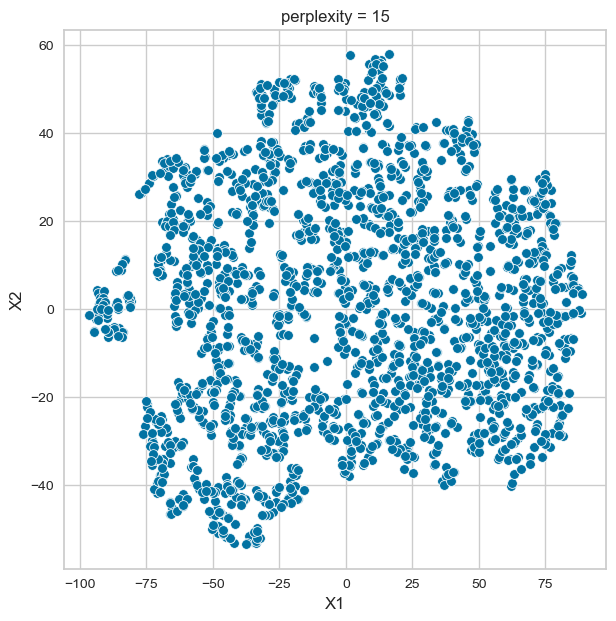

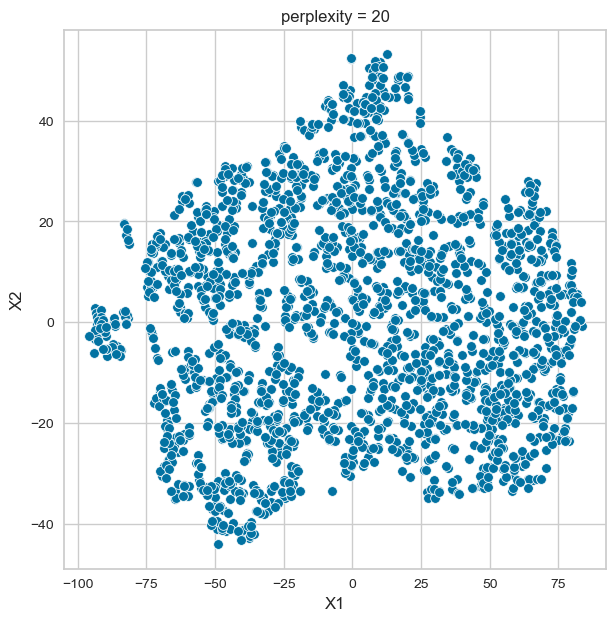

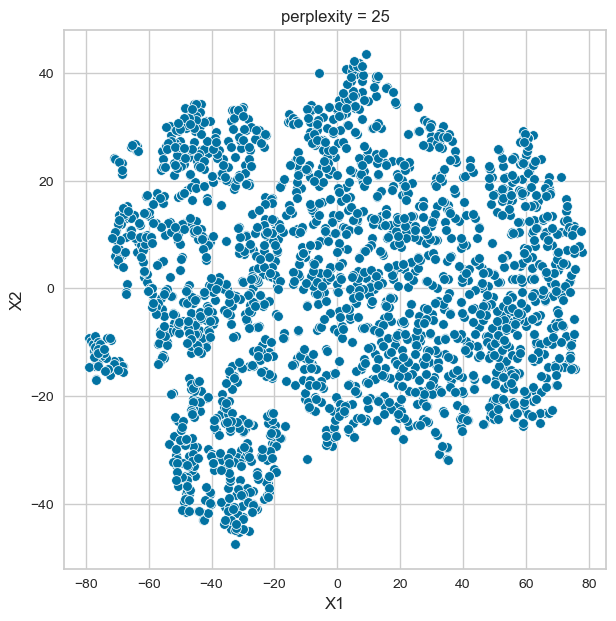

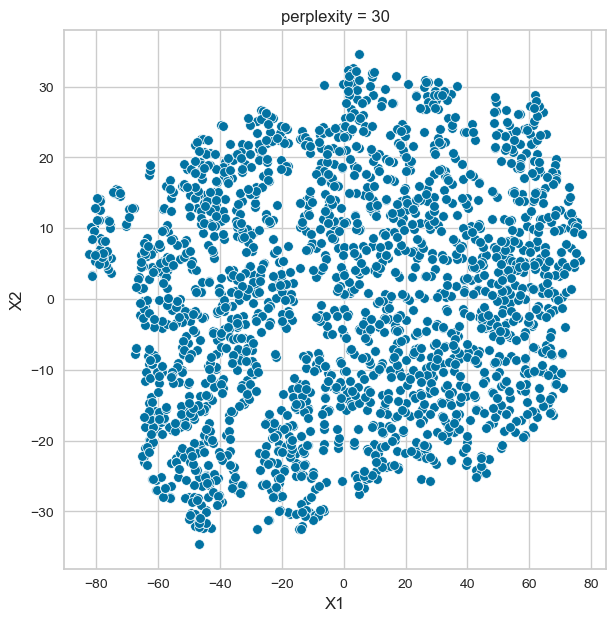

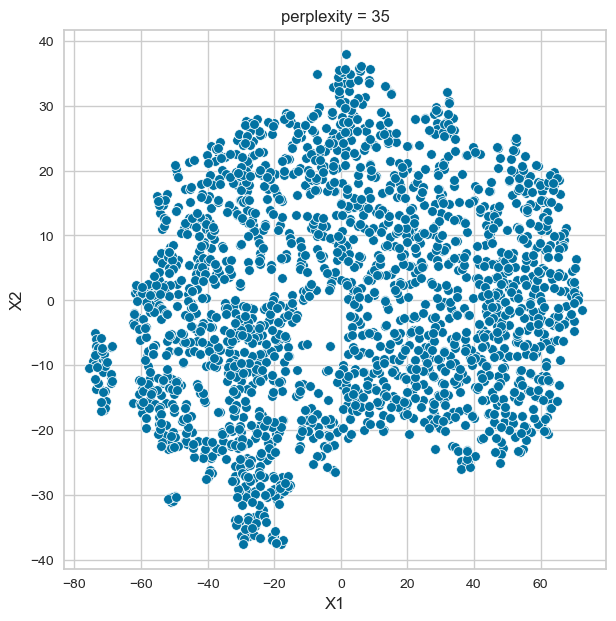

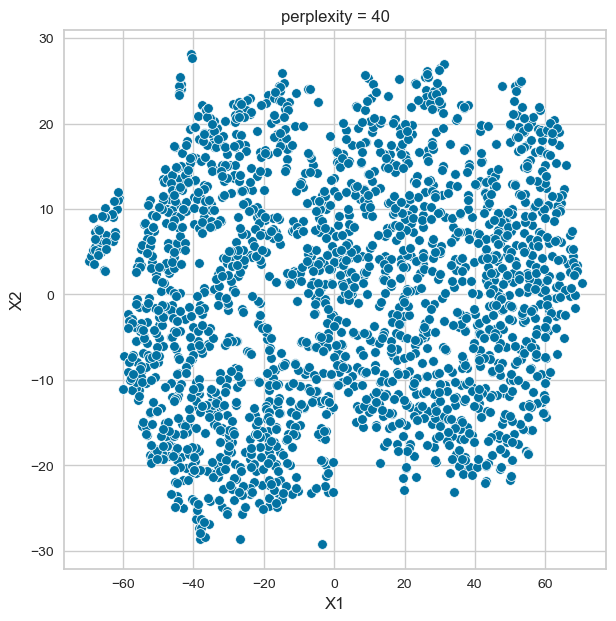

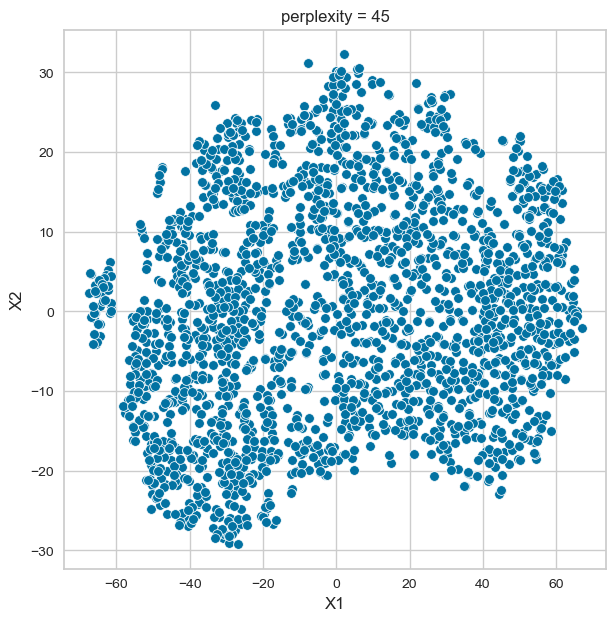

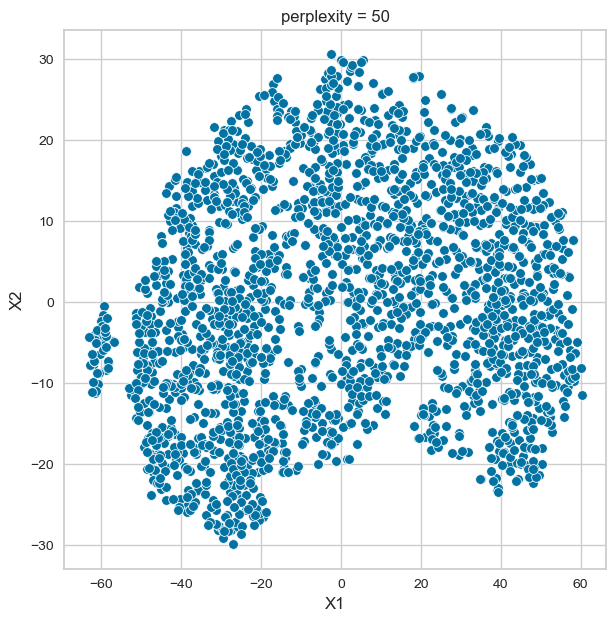

In [70]:
# Fitting T-SNE with number of components equal to 2 to visualize how data is distributed
for i in range(5, 55, 5):
    tsne = TSNE(n_components = 2, random_state = 1, perplexity = i)
    
    data_tsne = tsne.fit_transform(df_scaled)
    
    data_tsne = pd.DataFrame(data_tsne)
    
    data_tsne.columns = ['X1', 'X2']
    
    plt.figure(figsize = (7, 7))
    
    sns.scatterplot(x = 'X1', y = 'X2', data = data_tsne)
    
    plt.title("perplexity = {}".format(i))

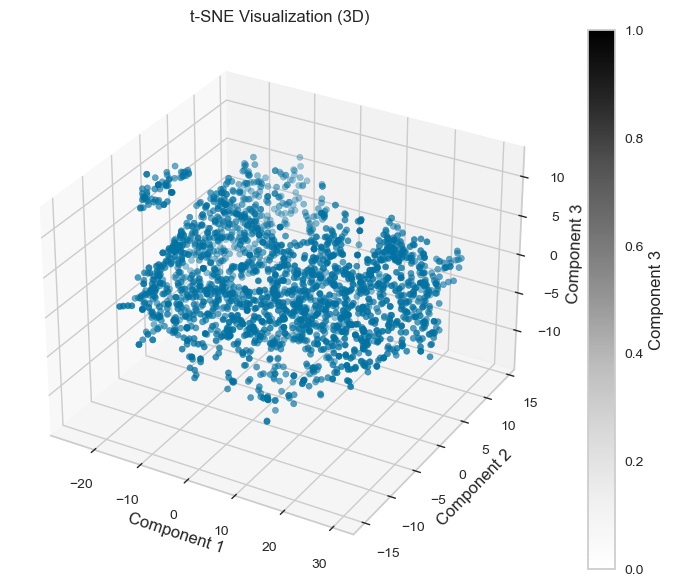

In [71]:
# Initializing T-SNE with number of components equal to 3, random_state=1, and perplexity=35
tsne = TSNE(n_components=3, random_state=1, perplexity=35)

# Fit_transform T-SNE on df_scaled
data_air_pol_tsne = tsne.fit_transform(df_scaled)

# Converting the embeddings to a dataframe
data_air_pol_tsne = pd.DataFrame(data_air_pol_tsne, columns=[0, 1, 2])

from mpl_toolkits.mplot3d import Axes3D

# Scatter plot for three components
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plotting the data
scatter = ax.scatter(data_air_pol_tsne[0], data_air_pol_tsne[1], data_air_pol_tsne[2], cmap='viridis')

# Adding labels and title
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
ax.set_title('t-SNE Visualization (3D)')

# Adding color bar
plt.colorbar(scatter, ax=ax, label='Component 3')

plt.show()

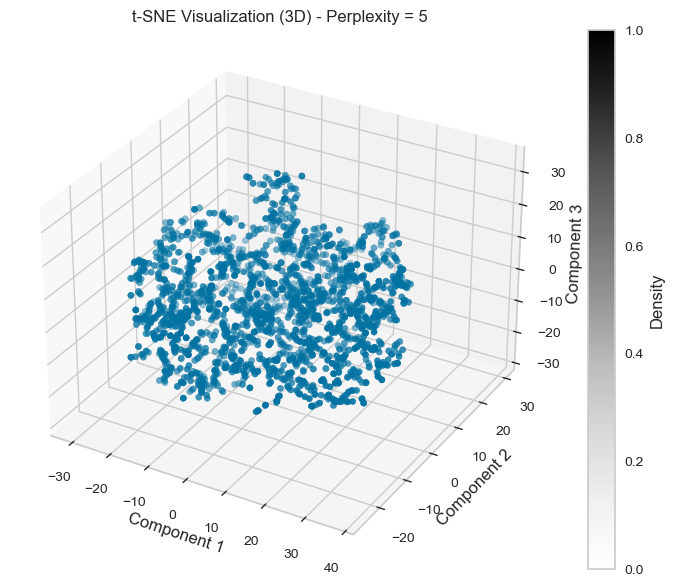

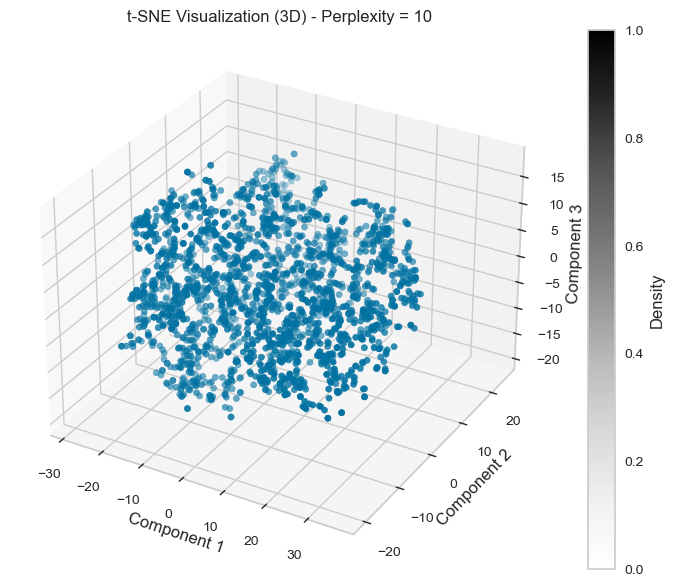

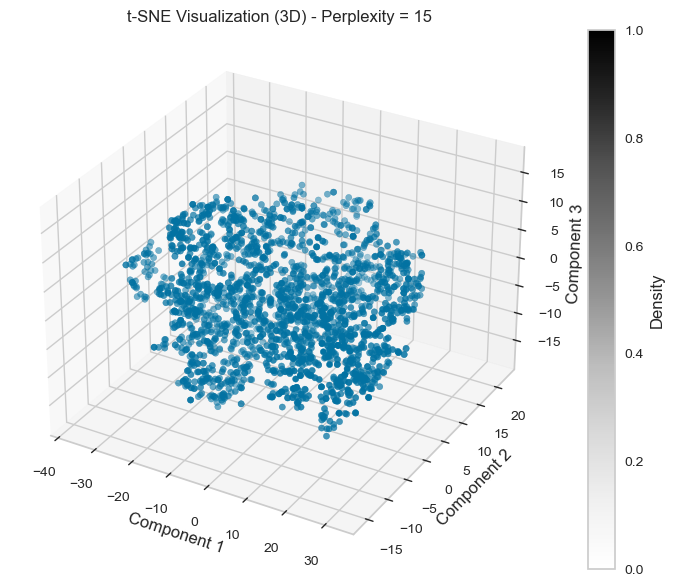

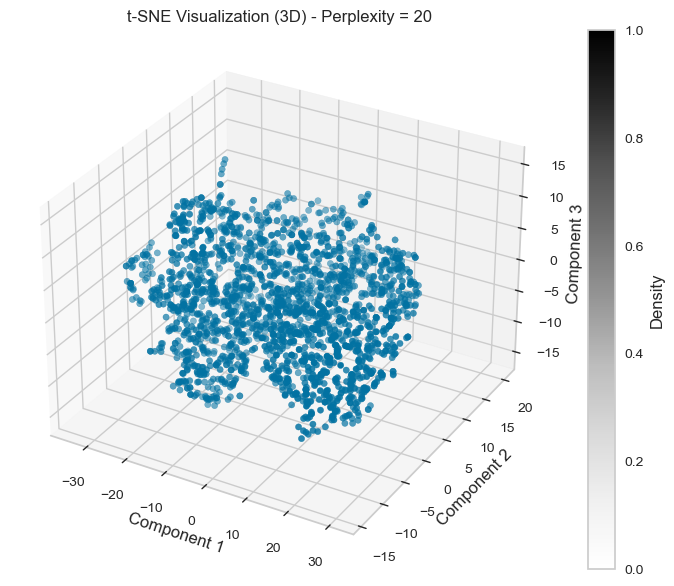

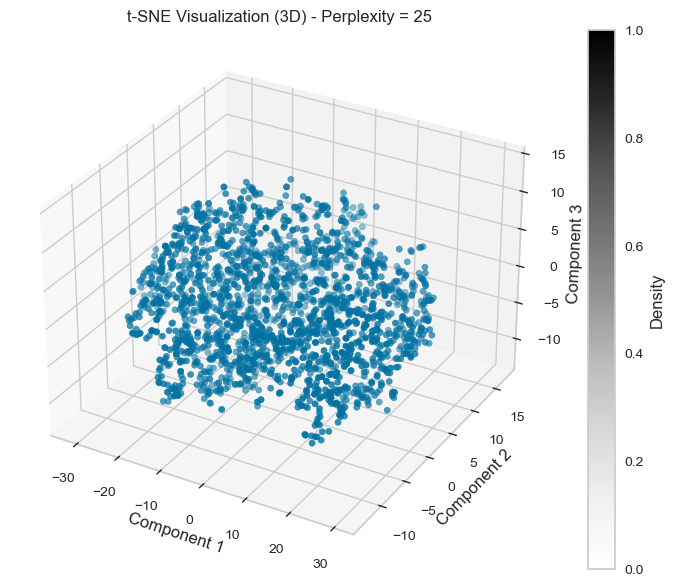

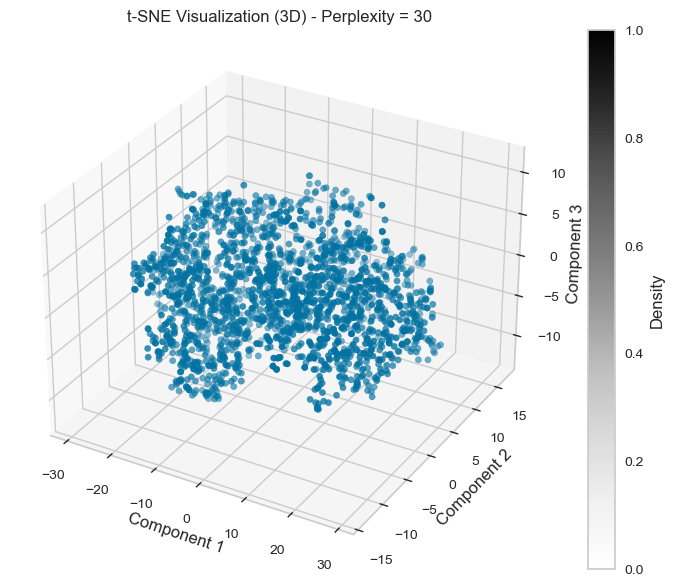

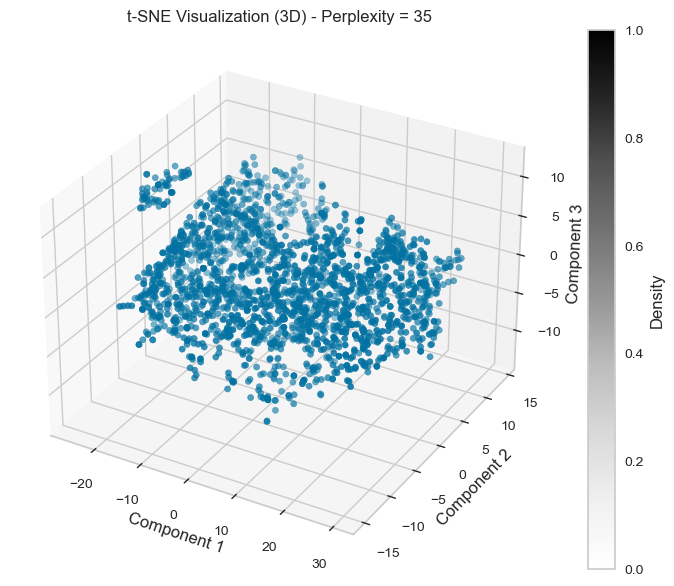

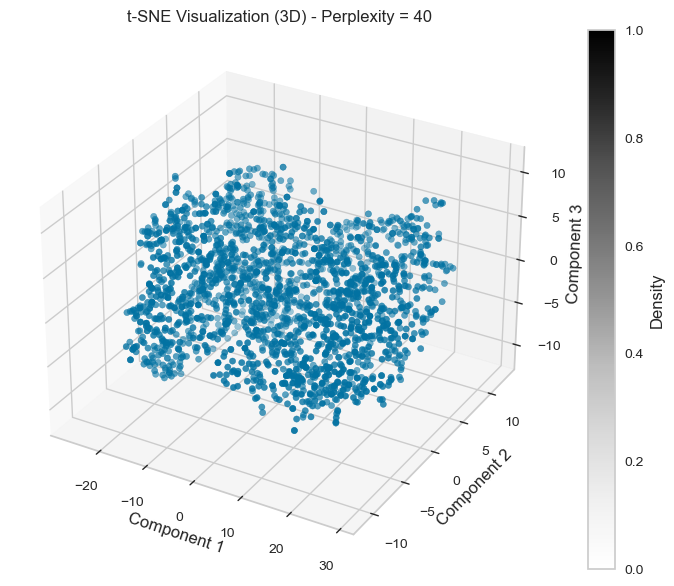

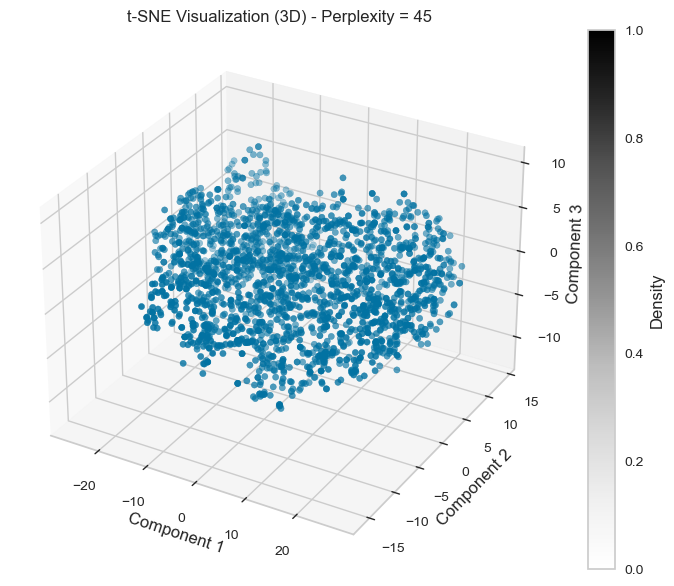

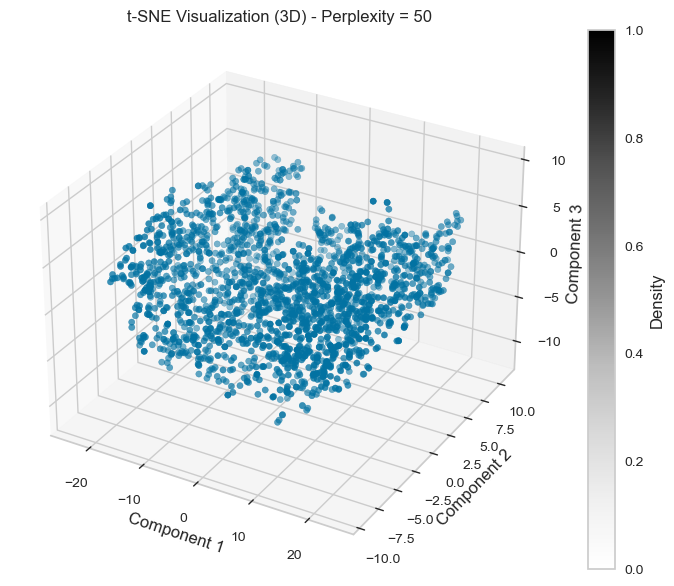

In [72]:
# Iterate over perplexity values
for i in range(5, 55, 5):
    # Initializing t-SNE with number of components equal to 3, random_state=1, and varying perplexity
    tsne = TSNE(n_components=3, random_state=1, perplexity=i)
    
    # Fit_transform t-SNE on df_scaled
    data_tsne = tsne.fit_transform(df_scaled)
    
    # Converting the embeddings to a dataframe
    data_tsne = pd.DataFrame(data_tsne, columns=['X1', 'X2', 'X3'])
    
    # Creating a new figure for each perplexity value
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # Plotting the data
    scatter = ax.scatter(data_tsne['X1'], data_tsne['X2'], data_tsne['X3'], cmap='viridis')

    # Adding labels and title
    ax.set_xlabel('Component 1')
    ax.set_ylabel('Component 2')
    ax.set_zlabel('Component 3')
    ax.set_title('t-SNE Visualization (3D) - Perplexity = {}'.format(i))

    # Adding color bar
    plt.colorbar(scatter, ax=ax, label='Density')

    # Show the plot for the current perplexity value
    plt.show()

**Observation and Insights:** We did not find very clear groupings of data. Their is only one clear cluster that concentrates a few values. It can be clearly seen in the t-SNE of two dimensions and perplexity over 35, been clearly under -65 in component 1 and perplexity 35. We will plot now this t-SNE of perplexity 35 marking that cluster, and we will study its characteristics. 

<Axes: xlabel='X1', ylabel='X2'>

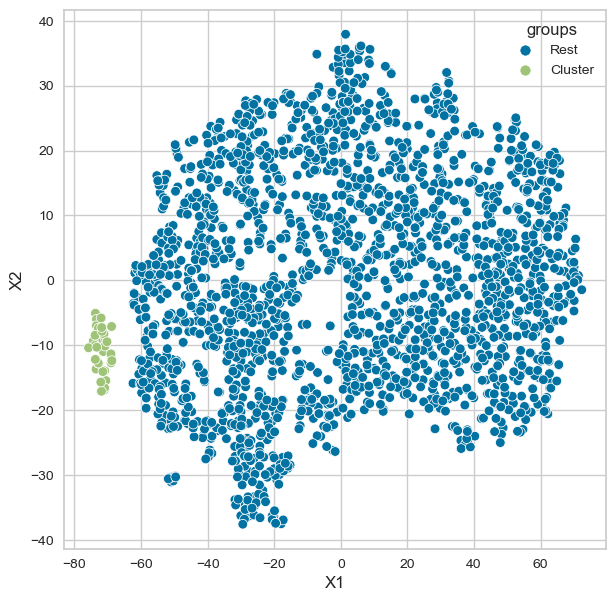

In [73]:
# Fitting T-SNE with number of components equal to 2 to visualize how data is distributed

tsne = TSNE(n_components=2, random_state=1, perplexity=35)        # Initializing T-SNE with number of component equal to 2, random_state=1, and perplexity=35

data_tsne =tsne.fit_transform(df_scaled)                          # fit_transform T-SNE on df_scaled

data_tsne = pd.DataFrame(data_tsne, columns=[0, 1])           # Converting the embeddings to a dataframe
data_tsne.columns = ['X1', 'X2']

# Let's assign points to 4 different groups
def cluster(x):
    first_component = x['X1']
    
    second_component = x['X2']
    
    if first_component < -60:
        return 'Cluster'
    
    else: 
        return 'Rest'
    
data_tsne['groups'] = data_tsne.apply(cluster, axis = 1)   
    
# Scatter plot for two components with hue
plt.figure(figsize = (7, 7))

sns.scatterplot(x = 'X1', y = 'X2', data = data_tsne, hue = 'groups')


In [74]:
data_tsne['groups'].value_counts()

Rest       2183
Cluster      43
Name: groups, dtype: int64

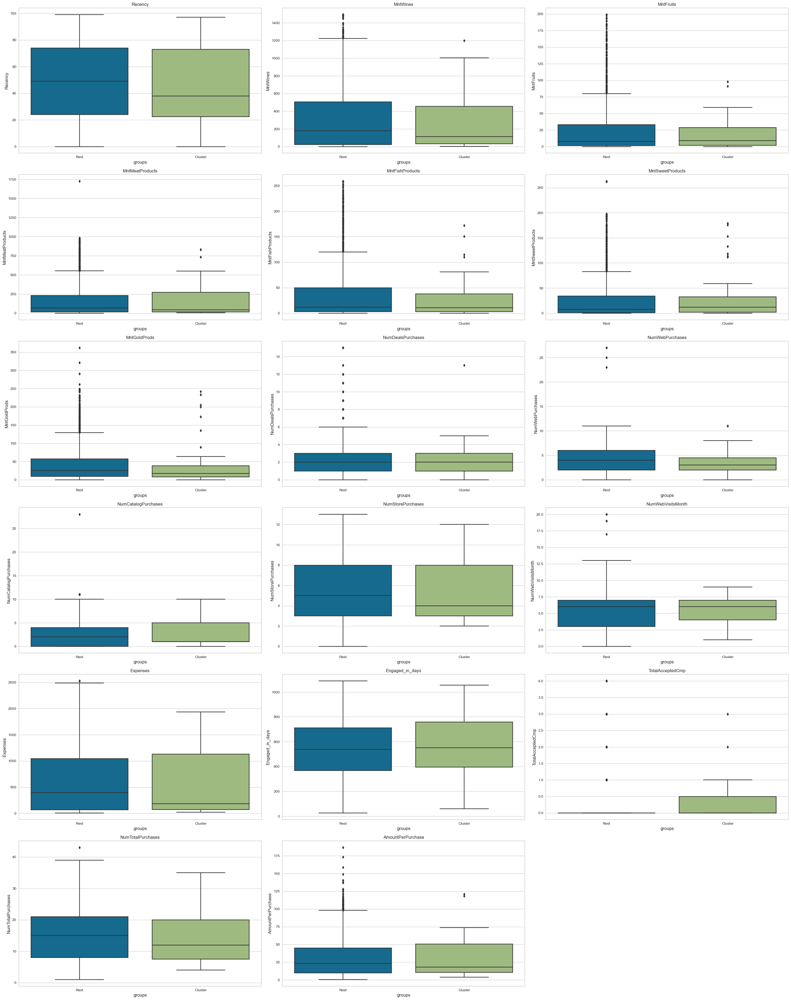

In [75]:
all_col = data_model.columns.tolist()

plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(8, 3, i + 1)
    
    sns.boxplot(y=data[variable], x=data_tsne['groups'])
    
    plt.tight_layout()
    
    plt.title(variable)

plt.show()

**Observations:** The cluster includes a very small sample of only 43 customers. There are no clear differences also. However, this is not a satisfactory solution as we still have most of our data without any segmentation. 

### **Applying PCA**

In [76]:
# Defining the number of principal components to generate
n = df_scaled.shape[1]

# Finding principal components for the data
pca1 = PCA(n_components = n, random_state = 1)
data_pca = pd.DataFrame(pca1.fit_transform(df_scaled))

# The percentage of variance explained by each principal component
exp_var1 = pca1.explained_variance_ratio_ 
# Extract eigenvalues
eigenvalues = pca1.explained_variance_

print("Eigenvalues:", eigenvalues)

Eigenvalues: [7.71972264e+00 1.97802234e+00 1.17181494e+00 1.02750857e+00
 9.75344551e-01 7.10451277e-01 6.03942769e-01 5.69782926e-01
 4.86274933e-01 4.37862985e-01 3.93631333e-01 3.65049359e-01
 2.73560101e-01 2.48531842e-01 4.61398774e-02 1.48006544e-31
 1.78685075e-32]


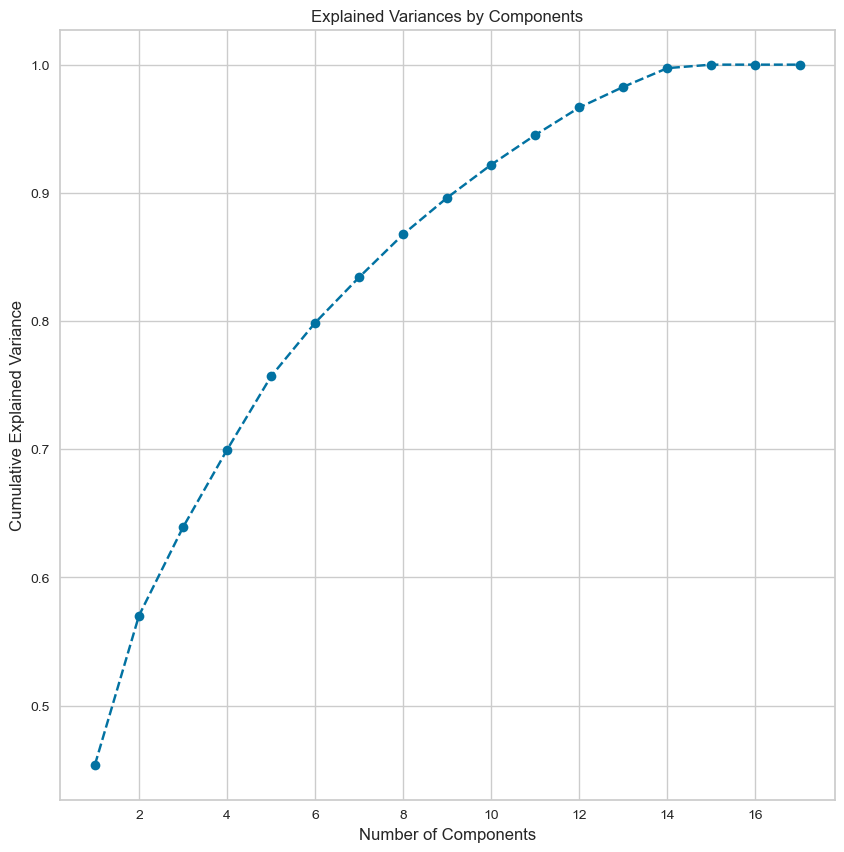

In [77]:
# Visualize the explained variance by individual components
plt.figure(figsize = (10, 10))

plt.plot(range(1, 18), pca1.explained_variance_ratio_.cumsum(), marker = 'o', linestyle = '--')

plt.title("Explained Variances by Components")

plt.xlabel("Number of Components")

plt.ylabel("Cumulative Explained Variance")

plt.show()

In [78]:
cumulative_variance_ratio = np.cumsum(pca1.explained_variance_ratio_)

# Find the index where cumulative variance ratio exceeds 80%
components_for_80_variance = np.argmax(cumulative_variance_ratio >= 0.8) + 1

print("Number of components to retain 80% variance:", components_for_80_variance)

Number of components to retain 80% variance: 7


In [79]:
# Making a new dataframe with first 5 principal components as columns and original features as indices
cols = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6','PC7']

pc1 = pd.DataFrame(np.round(pca1.components_.T[:, 0:7], 2), index = df_scaled.columns, columns = cols)

In [80]:
def color_high(val):
    
    if val <= -0.2:                    # You can decide any value as per your understanding
        return 'background: pink'
    
    elif val >= 0.2:
        return 'background: skyblue'   
    
pc1.style.applymap(color_high)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7
Recency,0.010000,-0.000000,-0.060000,0.740000,-0.660000,0.050000,0.060000
MntWines,0.300000,0.120000,0.370000,0.030000,-0.020000,-0.150000,-0.090000
MntFruits,0.250000,-0.140000,-0.320000,0.020000,0.130000,0.050000,0.310000
MntMeatProducts,0.300000,-0.160000,0.010000,0.080000,0.060000,-0.200000,0.020000
MntFishProducts,0.260000,-0.150000,-0.310000,0.050000,0.140000,0.080000,0.180000
MntSweetProducts,0.250000,-0.110000,-0.290000,0.050000,0.090000,0.080000,0.470000
MntGoldProds,0.210000,0.110000,-0.160000,0.050000,0.080000,0.770000,-0.470000
NumDealsPurchases,-0.020000,0.570000,-0.100000,-0.120000,-0.140000,-0.020000,0.310000
NumWebPurchases,0.210000,0.390000,-0.010000,-0.150000,-0.110000,0.200000,0.070000
NumCatalogPurchases,0.300000,-0.020000,0.040000,-0.010000,-0.060000,-0.080000,-0.110000


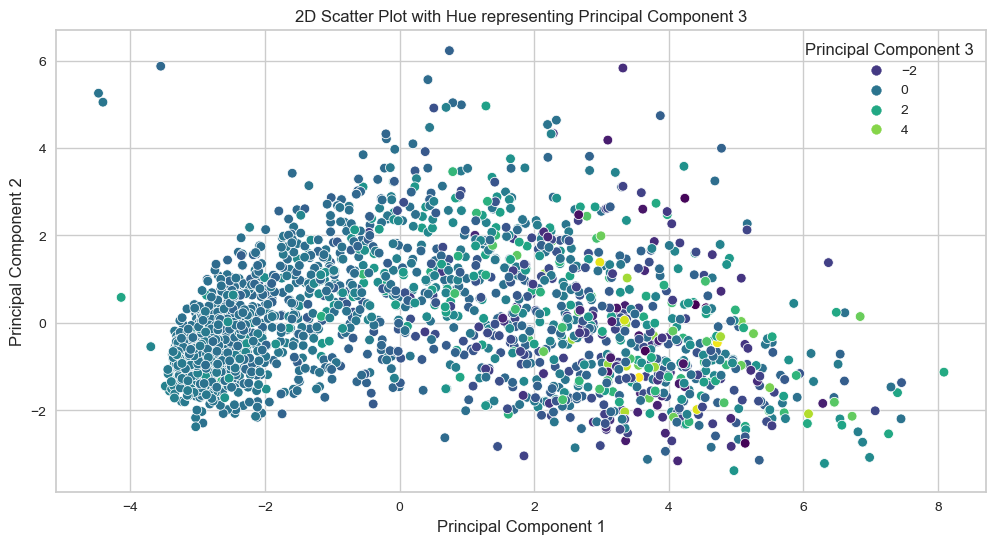

In [81]:
import matplotlib.pyplot as plt


# Assuming the first two principal components represent the x and y axes
x = data_pca[0]
y = data_pca[1]
hue = data_pca[2]

# Create a 2D scatter plot with hue representing the third principal component
plt.figure(figsize=(12,6))
sns.scatterplot(x=x, y=y, hue=hue, palette='viridis')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('2D Scatter Plot with Hue representing Principal Component 3')
plt.legend(title='Principal Component 3')
plt.show()

In [82]:
data_pca= data_pca.iloc[:,:7]

**Observation and Insights:** Now we are left with a dataset that does not have multicollinearity and for which we reduce dimensions that explain 80% of the variance with 7 components. We decide to remvoe part of the variables to avoid the methods relying in variables that explain little variance of the original data, hence, could be consider noise.  

## **K-Means**

**Think About It:**

- How do we determine the optimal K value from the elbow curve?
- Which metric can be used to determine the final K value?

In [97]:
distortions = []                                                  # Create an empty list

K = range(2, 10)                                                  # Setting the K range from 2 to 10

for k in K:
    kmeanModel = KMeans(n_clusters=k,random_state=1)              # Initialize K-Means
    kmeanModel.fit(data_pca)                                      # Fit K-Means on the data
    distortions.append(kmeanModel.inertia_)                       # Append distortion values to the empty list created above

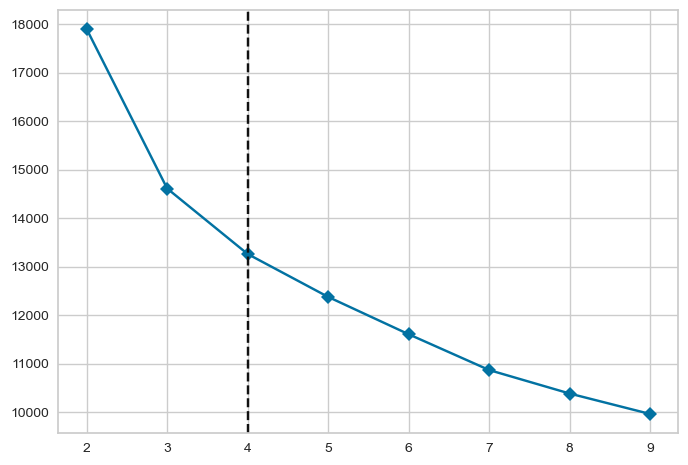

In [98]:
import numpy as np
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans

# Instantiate the KMeans model
model = KMeans()

# Instantiate the KElbowVisualizer with the KMeans model
visualizer = KElbowVisualizer(model, k=(2, 10), timings=False)

# Fit the visualizer to your data (replace X with your data)
visualizer.fit(data_pca) 

# Get the values of K and distortions from the visualizer
K = visualizer.k_values_
distortions = visualizer.k_scores_

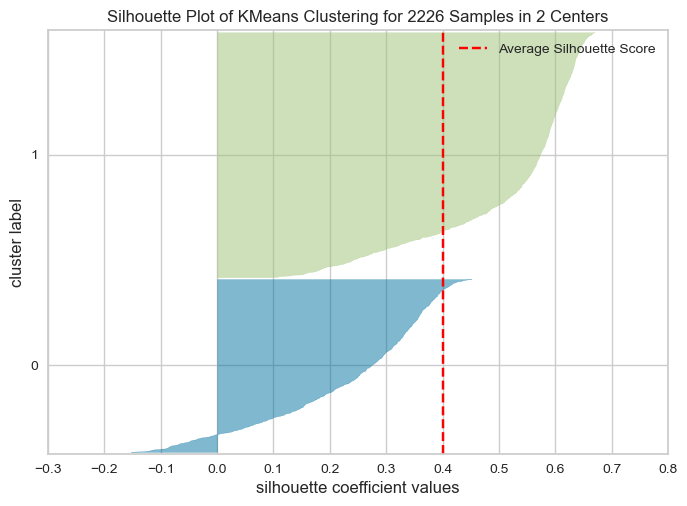

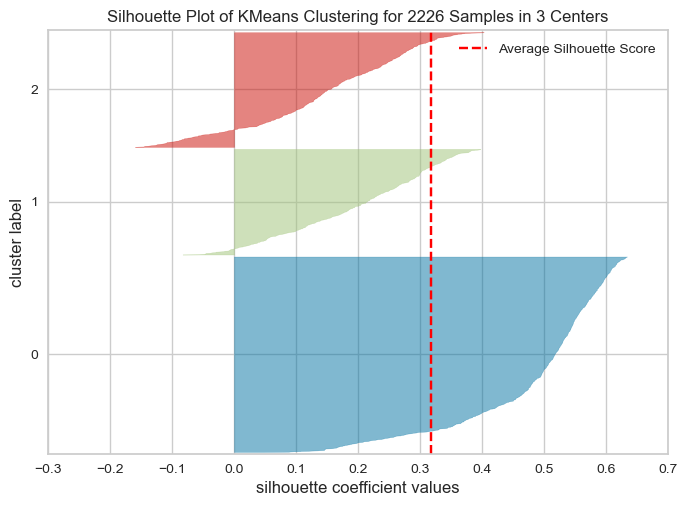

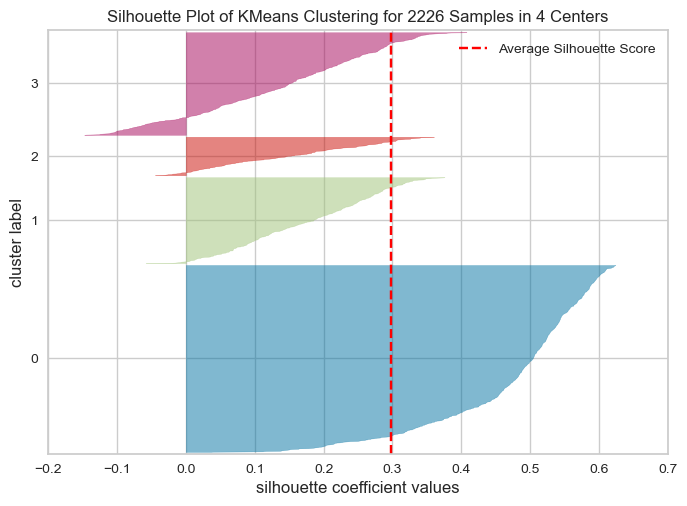

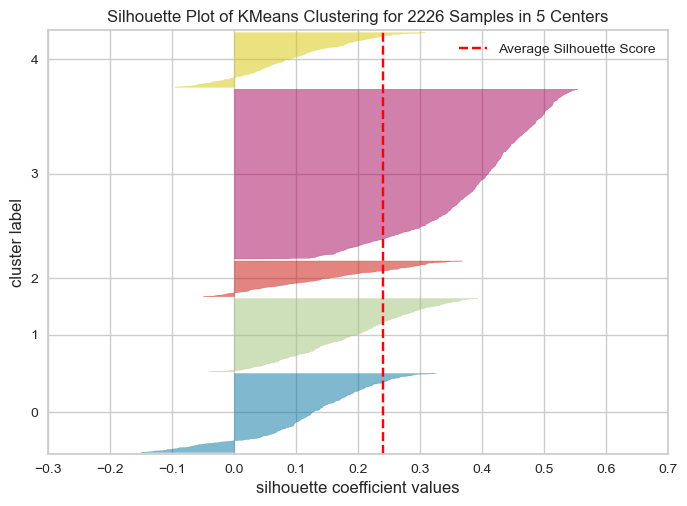

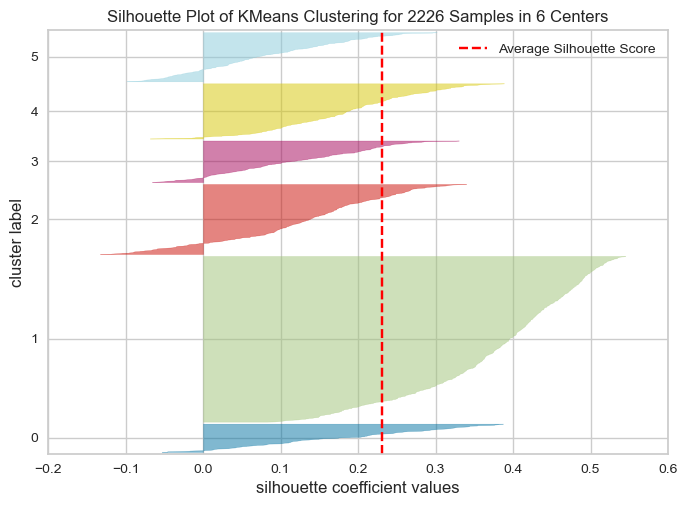

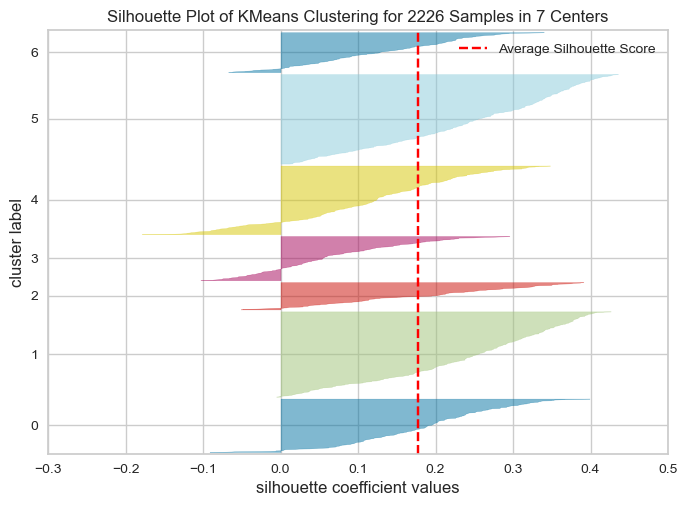

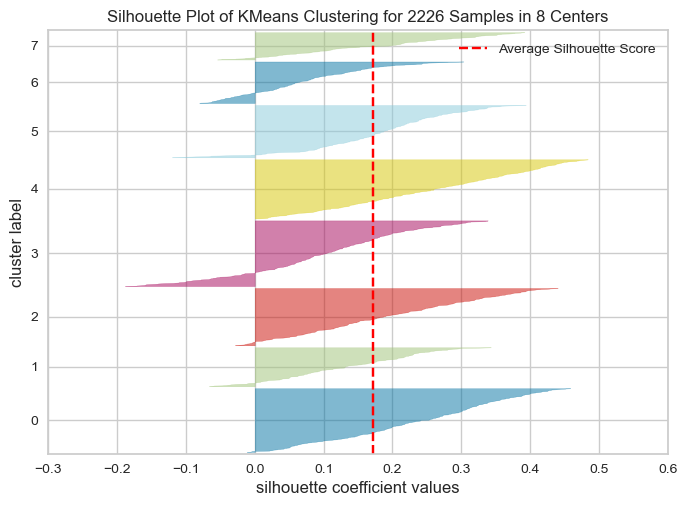

In [99]:
# Creating an empty list to store silhouette scores
sil_score = []  

# Creating a range from 2 to 8 for the number of clusters
cluster_list = range(2, 9)  

# Initialize a KMeans estimator
model = KMeans(random_state=1)

for n_clusters in cluster_list:
    # Fit the KMeans model with the current number of clusters
    model.set_params(n_clusters=n_clusters)
    model.fit(data_pca)
    
    # Visualize the silhouette score
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
    visualizer.fit(data_pca)
    visualizer.show()
    
    # Get the silhouette score and append it to the list
    sil_score.append(visualizer.silhouette_score_)

**Observations:** From the elbow method it sems like 4 clusters is the ideal solution. This is also suggested by the silhoute score, which has a very similar value and shape for 4 and 3 components. It seems though as if cluster 3 is the lest consistent of all the clusters.

### **Applying KMeans on the PCA data and visualize the clusters**

In [100]:
kmeans = KMeans(n_clusters = 4, random_state = 1)

kmeans.fit(data_pca)

KMeans(n_clusters=4, random_state=1)

### **Cluster Profiling**

In [101]:
data_pca["K_means_segments_4"] = kmeans.labels_                    # Adding K-Means cluster labels to the data_pca data

data["K_means_segments_4"] = kmeans.labels_                        # Adding K-Means cluster labels to the whole data

data_model["K_means_segments_4"] = kmeans.labels_                  # Adding K-Means cluster labels to data_model

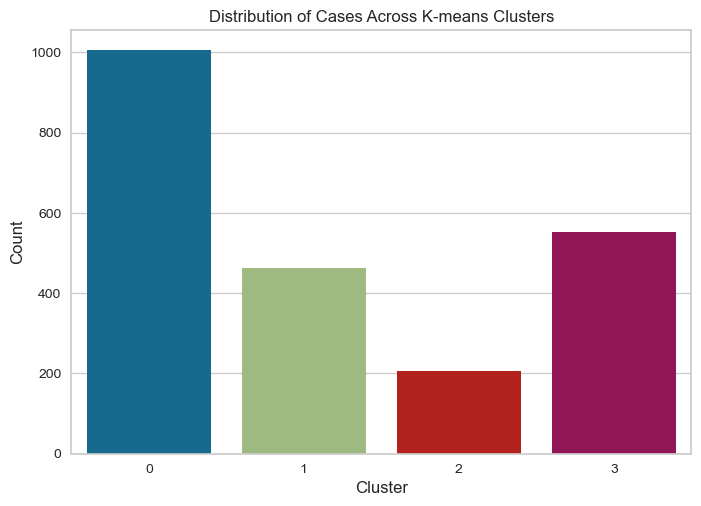

In [102]:
# Assuming 'K_means_segments_3' contains the cluster labels
sns.countplot(data=data_model, x='K_means_segments_4')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Distribution of Cases Across K-means Clusters')
plt.show()

In [103]:
# Function to visualize PCA data with clusters formed
def PCA_PLOT(X, Y, PCA, cluster):
    sns.scatterplot(x=X, y=1, data=PCA, hue=cluster)

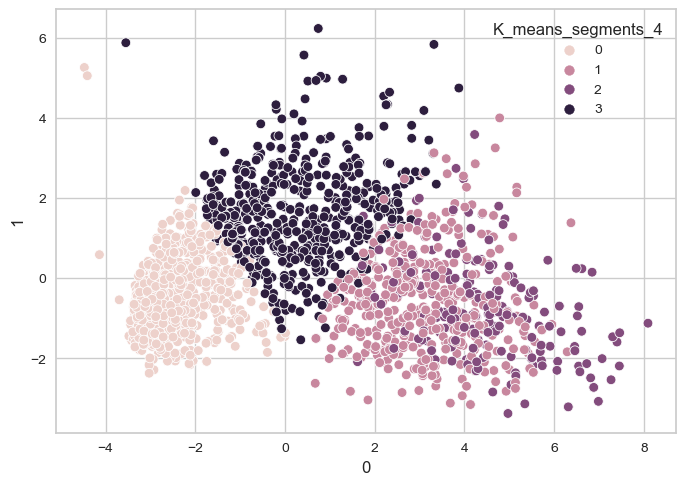

In [104]:
PCA_PLOT(0, 1, data_pca, "K_means_segments_4")

In [105]:
# Taking the cluster-wise mean of all the variables. Hint: First groupby 'data' by 'K_means_segments_3' and then find mean
# List of columns you're interested in
columns_of_interest = ['Income', 'Age','Kidhome', 'Teenhome','Total_Offspring', 'Family_Size', 'Recency','Engaged_in_days',
                       'Expenses','AmountPerPurchase','MntWines','MntFruits', 'MntMeatProducts','MntFishProducts', 'MntSweetProducts',
                      'MntGoldProds', 'NumTotalPurchases','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumWebVisitsMonth',
                       'NumStorePurchases','TotalAcceptedCmp'] 
cluster_profile_KMeans_4 = data.groupby('K_means_segments_4').mean()
pd.set_option('display.max_columns', None)
# Highlighting the maximum average value among all the clusters for each of the variables
highlighted_max = cluster_profile_KMeans_4[columns_of_interest].style.highlight_max(color="lightgreen", axis=0)

# Highlighting the minimum average value among all the clusters for each of the variables
highlighted_min_max = highlighted_max.apply(lambda x: ['background-color: red' if value == x.min() else '' for value in x], axis=0)

# Displaying the styled DataFrame
highlighted_min_max 

,Income,Age,Kidhome,Teenhome,Total_Offspring,Family_Size,Recency,Engaged_in_days,Expenses,AmountPerPurchase,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumTotalPurchases,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumWebVisitsMonth,NumStorePurchases,TotalAcceptedCmp
K_means_segments_4,,,,,,,,,,,,,,,,,,,,,,,
0,34817.934328,43.761194,0.757214,0.460697,1.217910,2.872637,49.332338,493.672637,91.702488,10.850187,38.964179,4.872637,21.454726,6.999005,5.106468,14.305473,7.673632,1.904478,2.022886,0.528358,6.346269,3.217910,0.079602
1,71521.703463,47.551948,0.058442,0.320346,0.378788,2.002165,51.000000,542.512987,1186.209957,58.801539,475.417749,70.142857,389.640693,100.333333,70.103896,80.571429,21.030303,1.638528,5.274892,5.525974,2.978355,8.590909,0.136364
2,80316.111111,45.840580,0.043478,0.178744,0.222222,1.864734,48.782609,560.714976,1701.241546,83.585295,932.946860,57.057971,490.888889,82.178744,63.260870,74.908213,21.265700,1.140097,5.599034,6.169082,3.405797,8.357488,1.855072
3,54959.769928,49.302536,0.349638,0.875000,1.224638,2.869565,47.264493,606.880435,644.409420,30.887490,412.804348,17.414855,115.251812,24.443841,17.978261,56.516304,20.492754,4.101449,6.358696,2.746377,6.164855,7.286232,0.248188


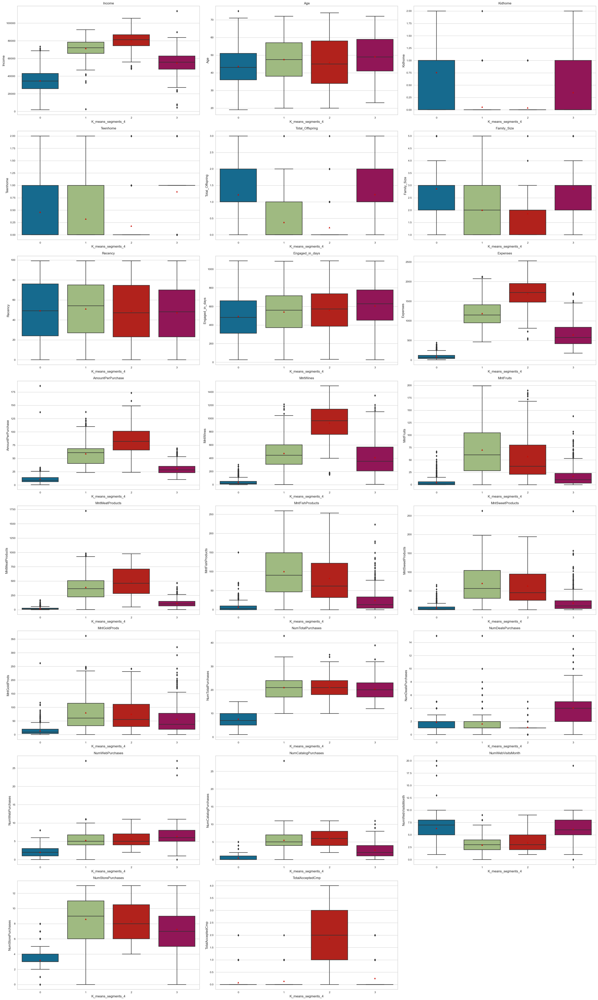

In [106]:
# Creating boxplot for each of the variables
all_col = columns_of_interest

plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(8, 3, i + 1)
    
    sns.boxplot(y=data[variable], x=data['K_means_segments_4'],showmeans=True)
    
    plt.tight_layout()
    
    plt.title(variable)

plt.show()

### **Describe the characteristics of each cluster**

**Summary of each cluster:**
- **Cluster 0 (Low Income-Low Expenses Cluster):** **Cluster 0** is characterized by low levels of income and expenses, and it comprises the youngest demographic. They make fewer purchases, typically of lower value. They do all this despite having larger families and more offspring at home compared other clusters. However, they exhibit a higher frequency of website visits, possibly influenced by outliers who visit the webpage frequently.

- **Cluster 1 (High Expenses- Fruit/Fish/Sweet):** **Cluster 1** consists of individuals with high income and expenses, albeit lower than those in **Cluster 2**. Their purchase frequency is similar to **Clusters 2** and **3**. However the expense per purhcase is the second highest only behind **Cluster 2**. They are the second oldest cluster and have smaller families, although larger than those in **Cluster 2**. Notably, they allocate a higher expenses to categories such as fruits, fish, sweets, and gold products compared to other clusters.

- **Cluster 2 (High Expenses- Wine/Meat):** **Cluster 2** exhibits the highest income and expenses among all clusters, with the smallest family sizes and the second youngest demographic. Their elevated expenditure primarily stems from increased consumption of wine and meat products. Additionally, they are the most responsive to promotional campaigns, indicating a higher engagement level with the company.

- **Cluster 3 (Medium Expenses):** **Cluster 3** comprises individuals with moderate income and expenses, larger families, and the oldest demographic. They demonstrate a higher propensity for purchasing deals and exhibit more frequently buying in the website, reflecting their longer time they been engaged with the company.

# **K-Medoids**

In [108]:
data_pca.drop('K_means_segments_4', axis=1, inplace=True)

In [109]:
distortions = []                                                  # Create an empty list

K = range(2, 10)                                                  # Setting the K range from 2 to 10

for k in K:
    kmedoidModel = KMedoids(n_clusters=k,random_state=1)              # Initialize K-Means
    kmedoidModel.fit(data_pca)                                      # Fit K-Means on the data
    distortions.append(kmedoidModel.inertia_)   

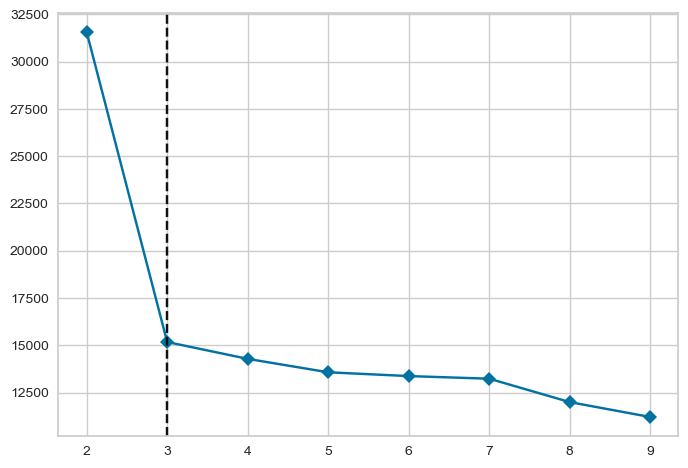

In [110]:
import numpy as np
from yellowbrick.cluster import KElbowVisualizer


# Instantiate the KMeans model
model = KMedoids()

# Instantiate the KElbowVisualizer with the KMeans model
visualizer = KElbowVisualizer(model, k=(2, 10), timings=False,random_state=1)

# Fit the visualizer to your data (replace X with your data)
visualizer.fit(data_pca) 

# Get the values of K and distortions from the visualizer
K = visualizer.k_values_
distortions = visualizer.k_scores_

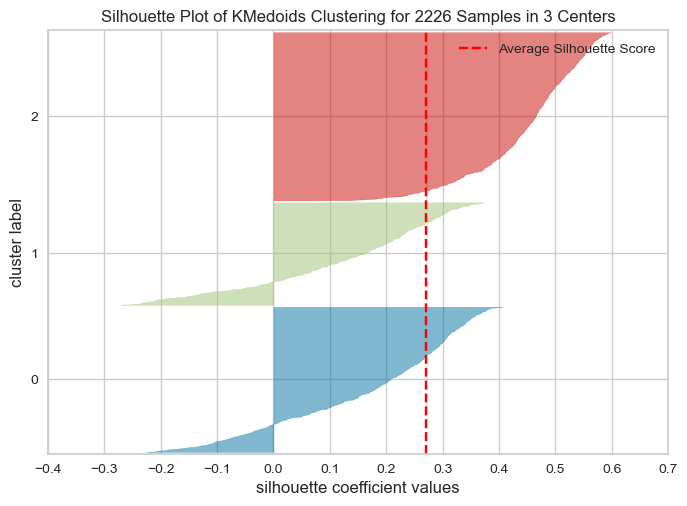

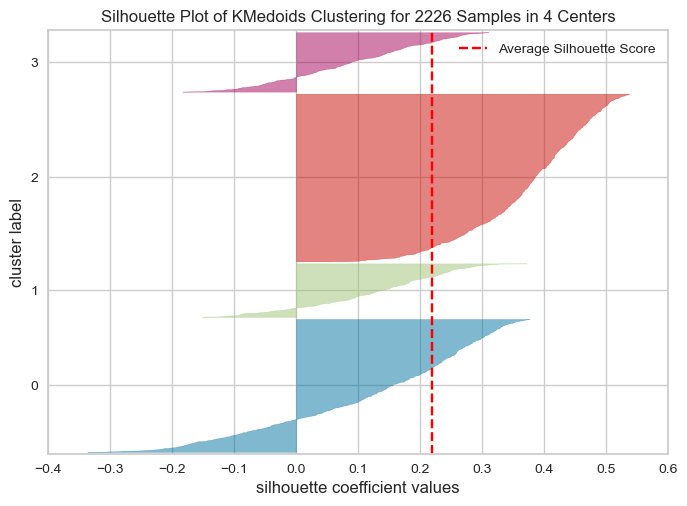

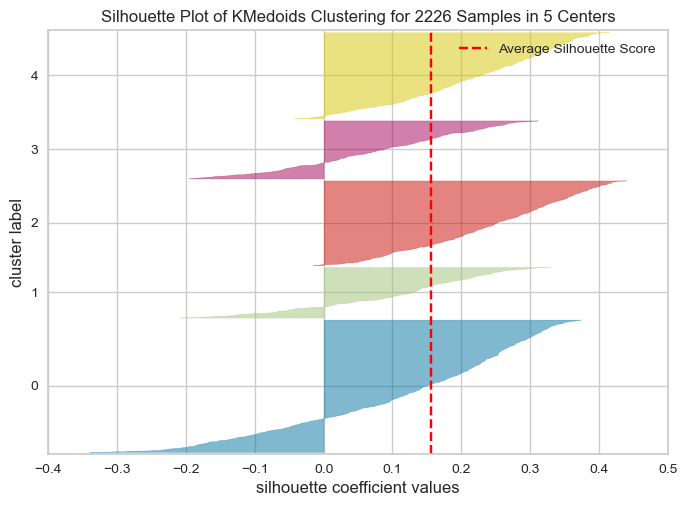

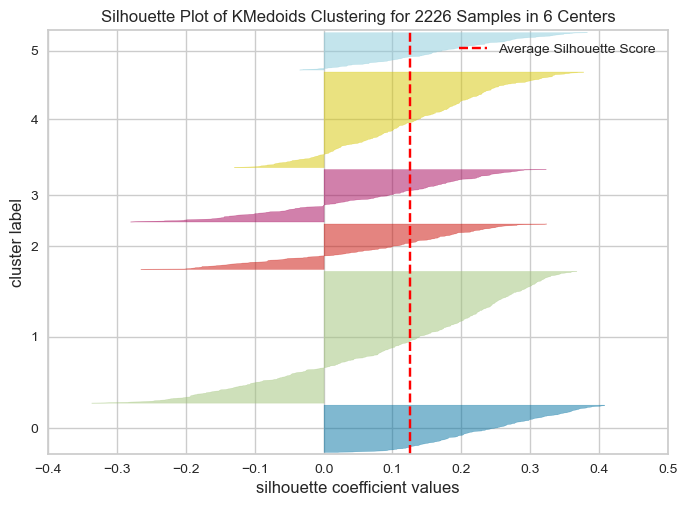

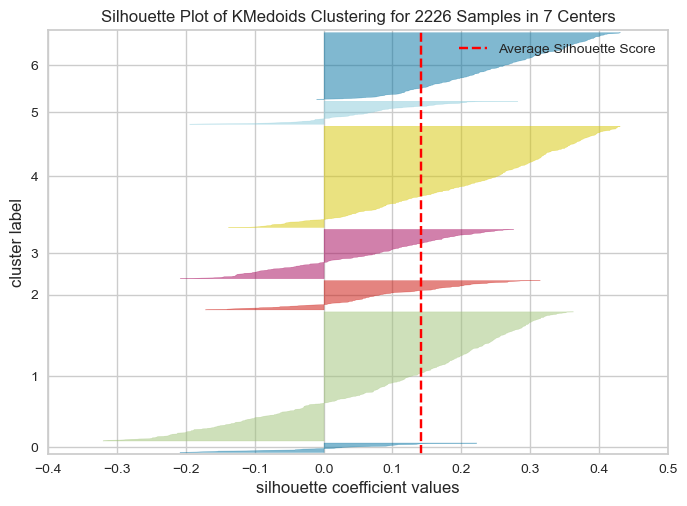

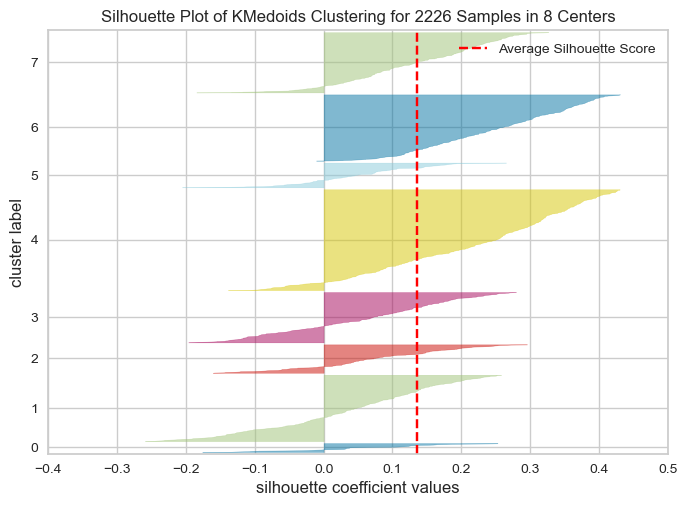

In [111]:
# Creating an empty list to store silhouette scores
sil_score = []  

# Creating a range from 2 to 8 for the number of clusters
cluster_list = range(3, 9)  

# Initialize a KMeans estimator
model = KMedoids(random_state=1)

for n_clusters in cluster_list:
    # Fit the KMeans model with the current number of clusters
    model.set_params(n_clusters=n_clusters)
    model.fit(data_pca)
    
    # Visualize the silhouette score
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
    visualizer.fit(data_pca)
    visualizer.show()
    
    # Get the silhouette score and append it to the list
    sil_score.append(visualizer.silhouette_score_)

In [112]:
kmedoids = KMedoids(n_clusters = 3, random_state = 1)

kmedoids.fit(data_pca)

KMedoids(n_clusters=3, random_state=1)

In [113]:
data_pca["K_medoids_segments_3"] = kmedoids.labels_                    # Adding K-medoids cluster labels to the data_pca data

data["K_medoids_segments_3"] = kmedoids.labels_                        # Adding K-medoids cluster labels to the whole data

data_model["K_medoids_segments_3"] = kmedoids.labels_                  # Adding K-medoids cluster labels to data_model

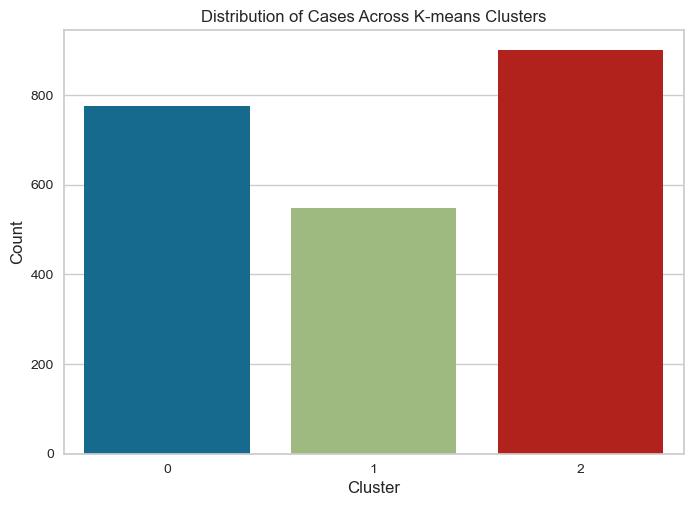

In [114]:
# Assuming 'K_means_segments_3' contains the cluster labels
sns.countplot(data=data_model, x='K_medoids_segments_3')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Distribution of Cases Across K-means Clusters')
plt.show()

### **Visualize the clusters using PCA**

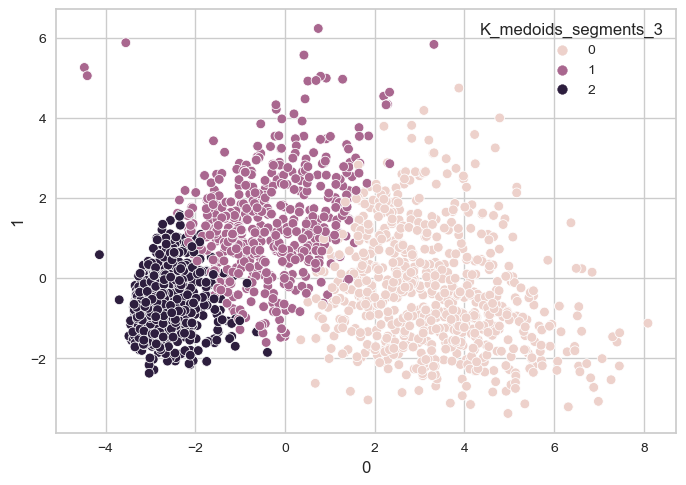

In [115]:
PCA_PLOT(0, 1, data_pca, "K_medoids_segments_3")

### **Cluster Profiling**

In [116]:

cluster_profile_KMedoids_3 = data.groupby('K_medoids_segments_3').mean()
pd.set_option('display.max_columns', None)
# Highlighting the maximum average value among all the clusters for each of the variables
highlighted_max = cluster_profile_KMedoids_3[columns_of_interest].style.highlight_max(color="lightgreen", axis=0)

# Highlighting the minimum average value among all the clusters for each of the variables
highlighted_min_max = highlighted_max.apply(lambda x: ['background-color: red' if value == x.min() else '' for value in x], axis=0)

# Displaying the styled DataFrame
highlighted_min_max

,Income,Age,Kidhome,Teenhome,Total_Offspring,Family_Size,Recency,Engaged_in_days,Expenses,AmountPerPurchase,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumTotalPurchases,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumWebVisitsMonth,NumStorePurchases,TotalAcceptedCmp
K_medoids_segments_3,,,,,,,,,,,,,,,,,,,,,,,
0,72848.839125,47.510940,0.066924,0.362934,0.429858,2.056628,48.464607,556.510940,1300.518662,63.105475,623.118404,61.270270,389.433719,87.384813,62.952381,76.359073,21.601030,1.758044,5.611326,5.543115,3.438867,8.688546,0.612613
1,51177.974499,48.466302,0.418944,0.812386,1.231330,2.892532,50.666667,595.652095,495.014572,26.456668,309.404372,13.222222,88.887067,19.604736,13.919854,49.976321,18.216758,4.012750,5.717668,2.154827,6.287796,6.331512,0.220401
2,33664.470000,43.476667,0.786667,0.447778,1.234444,2.884444,48.728889,487.140000,73.105556,9.850149,28.626667,4.290000,17.133333,5.812222,4.425556,12.817778,7.063333,1.780000,1.822222,0.430000,6.375556,3.031111,0.074444


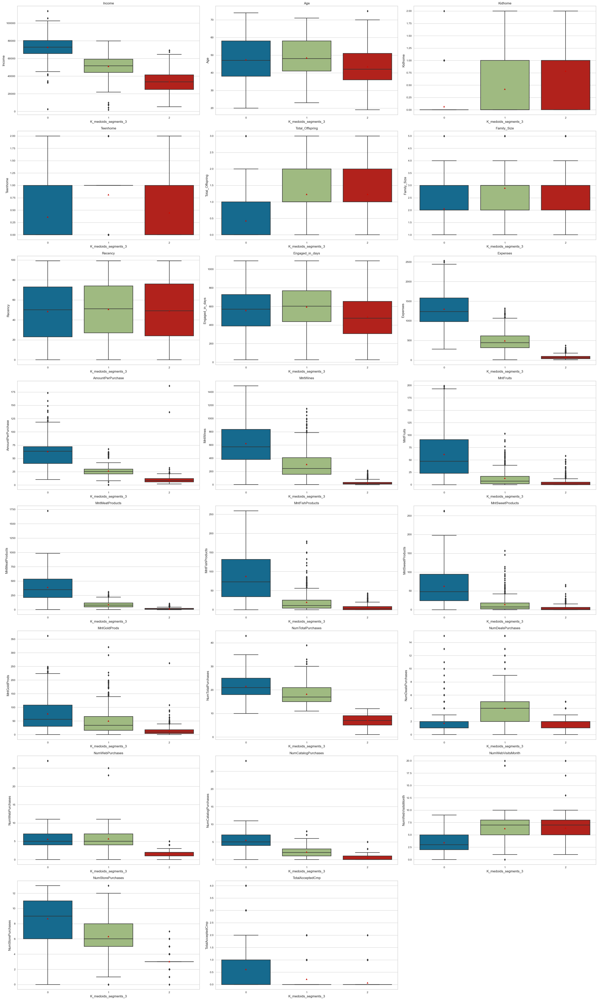

In [117]:
# Creating boxplot for each of the variables
all_col = columns_of_interest

plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(8, 3, i + 1)
    
    sns.boxplot(y=data[variable], x=data['K_medoids_segments_3'],showmeans=True)
    
    plt.tight_layout()
    
    plt.title(variable)

plt.show()

**Observations and Insights:** The number of observations per cluster is more evenly distributed with this method. This is explain by K-Medoids been less affected by extreme results than K-means. The K-Medoids with 3 clusters shows some slight differences with K-Means 3 clusters, however the silhoute scores and the elbow method suggest that this is not the greatest method. As we see the clusters contains a lot of points that don't resemble their own cluster.

## **Hierarchical Clustering**

Now we will test Dendograms to see if they inform us more about the possible clusters. Dendograms don't give explicit creations of clusters but may help decide which direction follow, or the amount of clusters we might use. 

In [119]:
data_pca.drop('K_medoids_segments_3', axis=1, inplace=True)

In [120]:
# list of distance metrics
distance_metrics = ["euclidean", "chebyshev", "mahalanobis", "cityblock"]

# list of linkage methods
linkage_methods = ["single", "complete", "average"]

high_cophenet_corr = 0                                                 # Creating a variable by assigning 0 to it
high_dm_lm = [0, 0]                                                    # Creating a list by assigning 0's to it

for dm in distance_metrics:
    for lm in linkage_methods:
        Z = linkage(data_pca, metric=dm, method=lm)                    # Applying different linkages with different distance on data_pca
        c, coph_dists = cophenet(Z, pdist(data_pca))                   # Calculating cophenetic correlation
        print(
            "Cophenetic correlation for {} distance and {} linkage is {}.".format(
                dm.capitalize(), lm, c
            )
        )
        if high_cophenet_corr < c:                                     # Checking if cophenetic correlation is higher than previous score
            high_cophenet_corr = c                                     # Appending to high_cophenet_corr list if it is higher
            high_dm_lm[0] = dm                                         # Appending its corresponding distance
            high_dm_lm[1] = lm                                         # Appending its corresponding method or linkage

Cophenetic correlation for Euclidean distance and single linkage is 0.6805971010276695.
Cophenetic correlation for Euclidean distance and complete linkage is 0.7003449834046146.
Cophenetic correlation for Euclidean distance and average linkage is 0.7648715091932329.
Cophenetic correlation for Chebyshev distance and single linkage is 0.6818843631195162.
Cophenetic correlation for Chebyshev distance and complete linkage is 0.7180433129673358.
Cophenetic correlation for Chebyshev distance and average linkage is 0.767930304332681.
Cophenetic correlation for Mahalanobis distance and single linkage is 0.6520728707451213.
Cophenetic correlation for Mahalanobis distance and complete linkage is 0.42980604370934544.
Cophenetic correlation for Mahalanobis distance and average linkage is 0.6786419741058927.
Cophenetic correlation for Cityblock distance and single linkage is 0.6804279329298546.
Cophenetic correlation for Cityblock distance and complete linkage is 0.7211229491408362.
Cophenetic corr

In [121]:
# Printing the combination of distance metric and linkage method with the highest cophenetic correlation
print(
    "Highest cophenetic correlation is {}, which is obtained with {} distance and {} linkage.".format(
        high_cophenet_corr, high_dm_lm[0].capitalize(), high_dm_lm[1]
    )
)

Highest cophenetic correlation is 0.7866199950359717, which is obtained with Cityblock distance and average linkage.


### **Cityblock**

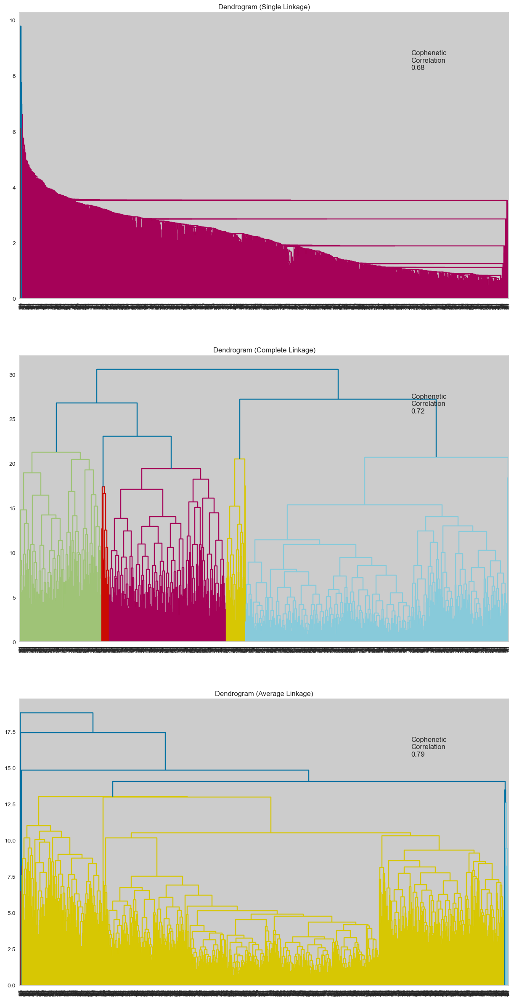

In [122]:
# List of linkage methods
linkage_methods = ["single", "complete", "average"]

# Lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]

# To create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 30))            # Setting the plot size

# We will enumerate through the list of linkage methods above
# For each linkage method, we will plot the dendrogram and calculate the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(data_pca, metric="Cityblock", method=method)                  # Measures the distances between two clusters

    dendrogram(Z, ax=axs[i])
    axs[i].set_title(f"Dendrogram ({method.capitalize()} Linkage)")           # Title of dendrogram

    coph_corr, coph_dist = cophenet(Z, pdist(data_pca))                       # Finding cophenetic correlation for different linkages with city block distance
    axs[i].annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

### **Chebyshev**

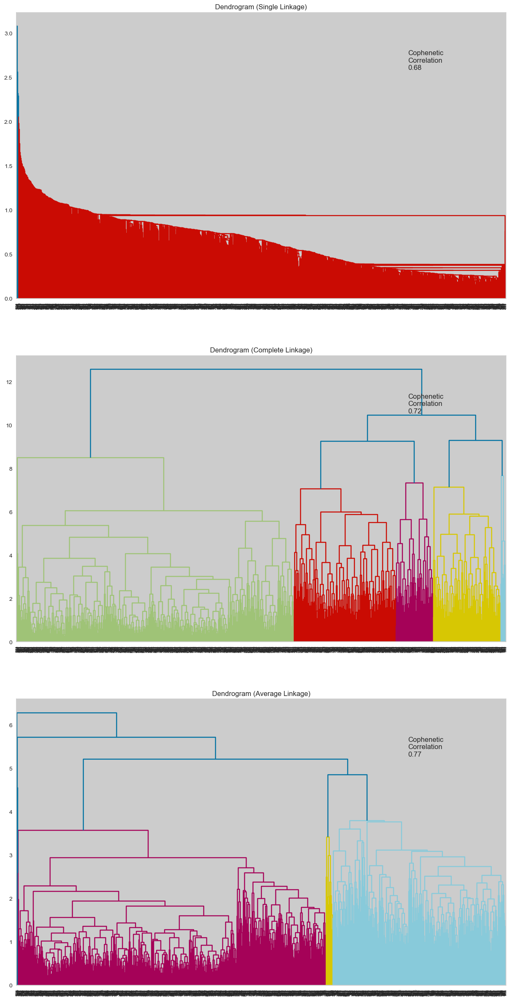

In [123]:
# List of linkage methods
linkage_methods = ["single", "complete", "average"]

# Lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]

# To create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 30))            # Setting the plot size

# We will enumerate through the list of linkage methods above
# For each linkage method, we will plot the dendrogram and calculate the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(data_pca, metric="Chebyshev", method=method)                  # Measures the distances between two clusters

    dendrogram(Z, ax=axs[i])
    axs[i].set_title(f"Dendrogram ({method.capitalize()} Linkage)")           # Title of dendrogram

    coph_corr, coph_dist = cophenet(Z, pdist(data_pca))                       # Finding cophenetic correlation for different linkages with city block distance
    axs[i].annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

### **Mahalanobis**

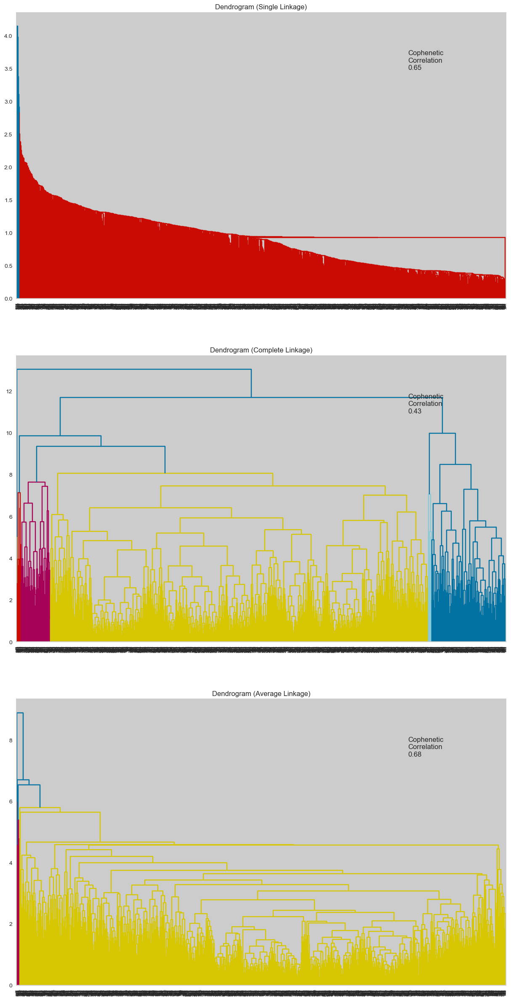

In [124]:
# List of linkage methods
linkage_methods = ["single", "complete", "average"]

# Lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]

# To create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 30))            # Setting the plot size

# We will enumerate through the list of linkage methods above
# For each linkage method, we will plot the dendrogram and calculate the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(data_pca, metric="Mahalanobis", method=method)                  # Measures the distances between two clusters

    dendrogram(Z, ax=axs[i])
    axs[i].set_title(f"Dendrogram ({method.capitalize()} Linkage)")           # Title of dendrogram

    coph_corr, coph_dist = cophenet(Z, pdist(data_pca))                       # Finding cophenetic correlation for different linkages with city block distance
    axs[i].annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

### **Euclidean**

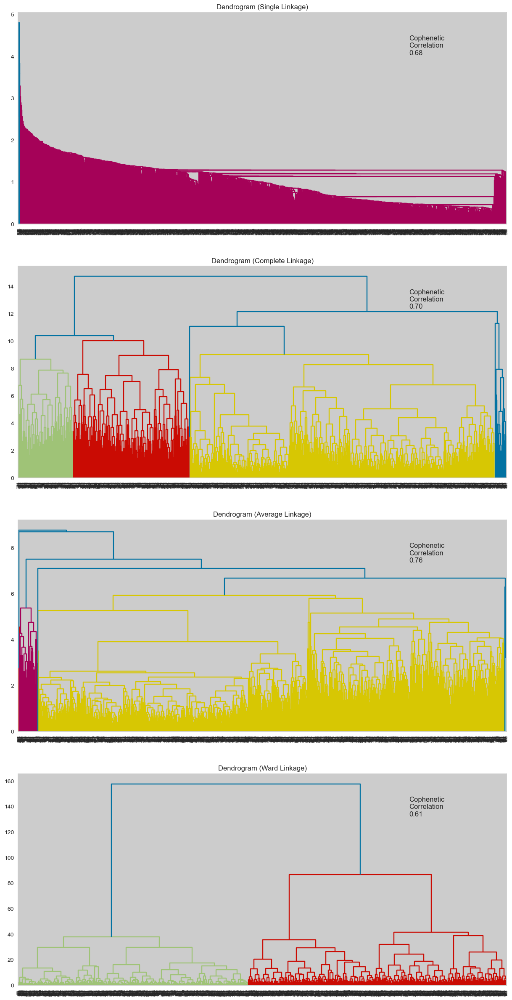

In [125]:
# List of linkage methods
linkage_methods = ["single", "complete", "average", "ward"]

# Lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]

# To create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 30))            # Setting the plot size

# We will enumerate through the list of linkage methods above
# For each linkage method, we will plot the dendrogram and calculate the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(data_pca, metric="euclidean", method=method)                  # Measures the distances between two clusters

    dendrogram(Z, ax=axs[i])
    axs[i].set_title(f"Dendrogram ({method.capitalize()} Linkage)")           # Title of dendrogram

    coph_corr, coph_dist = cophenet(Z, pdist(data_pca))                       # Finding cophenetic correlation for different linkages with city block distance
    axs[i].annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

**Observations:** Most of the methods we employed didn't really gave us valuable information, with some clusters been too small thus leading to confusing results. The **City Block** Complete linkage seems to have 4 clusters with them having a decent size and Cophenetic correlation been 0.74 (horizontal cut around 22 or so). Also the **Chebyshev** Complete Linkage (horizontal cut around 9) seems to have 4 clusters and Cophenetic correlation been 0.74. Finally with **Euclidean** distances and Complete Linkage we seem to see three clusters with Cophenetic Correlation of 0.74. Thus, we will test the Chebyshev, Euclidian and  City Block solutions.

# Cityblock

In [126]:
# Initialize Agglomerative Clustering with affinity (distance) as Euclidean, linkage as 'Ward' with clusters=3
HCmodel = AgglomerativeClustering(n_clusters=4, affinity="cityblock", linkage="complete",) 

# Fit on data_pca
HCmodel.fit(data_pca)        

AgglomerativeClustering(affinity='cityblock', linkage='complete', n_clusters=4)

In [127]:
data_pca["HCmodel_cityblock"] = HCmodel.labels_                    # Adding K-medoids cluster labels to the data_pca data

data["HCmodel_cityblock"] = HCmodel.labels_                        # Adding K-medoids cluster labels to the whole data

data_model["HCmodel_cityblock"] = HCmodel.labels_     

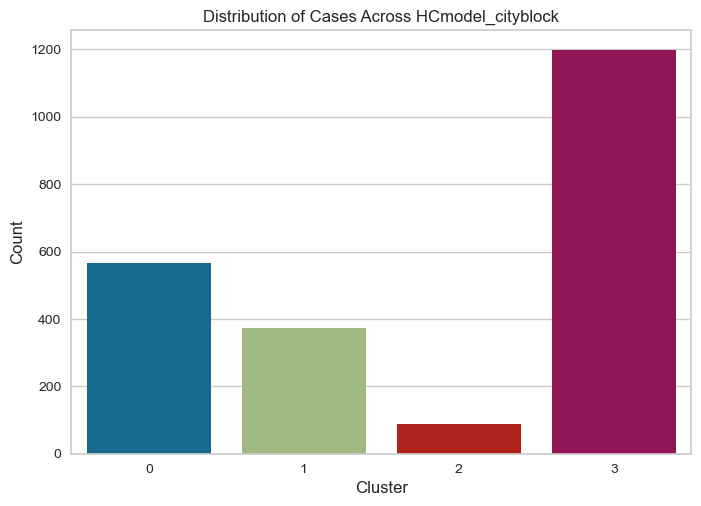

In [128]:
# Assuming 'K_means_segments_3' contains the cluster labels
sns.countplot(data=data_model, x='HCmodel_cityblock')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Distribution of Cases Across HCmodel_cityblock')
plt.show()

### **Visualize the clusters using PCA**

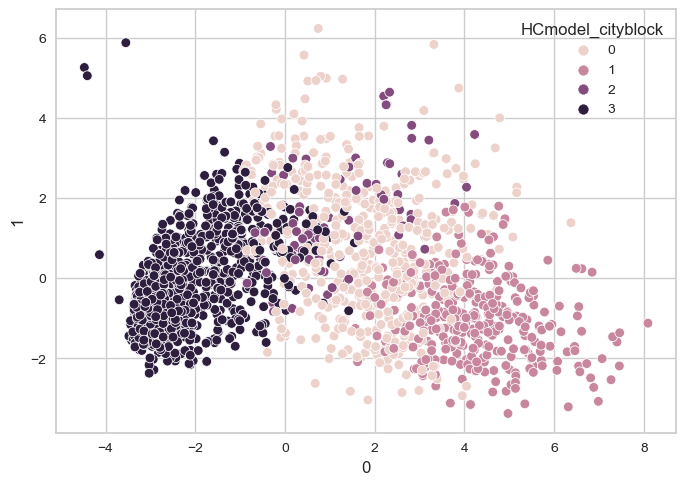

In [129]:
PCA_PLOT(0, 1, data_pca, "HCmodel_cityblock")

### **Cluster Profiling**

In [130]:
# Taking the cluster-wise mean of all the variables. Hint: First groupby 'data' by 'K_medoids_segments_5' and then find mean
# List of columns you're interested in
columns_of_interest = ['Income', 'Age','Kidhome', 'Teenhome','Total_Offspring', 'Family_Size', 'Recency','Engaged_in_days',
                       'Expenses','AmountPerPurchase','MntWines','MntFruits', 'MntMeatProducts','MntFishProducts', 'MntSweetProducts',
                      'MntGoldProds', 'NumTotalPurchases','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumWebVisitsMonth',
                       'NumStorePurchases','TotalAcceptedCmp']  # Replace with your actual column names
cluster_profile_HC_model = data.groupby('HCmodel_cityblock').mean()
pd.set_option('display.max_columns', None)
# Highlighting the maximum average value among all the clusters for each of the variables
highlighted_max = cluster_profile_HC_model[columns_of_interest].style.highlight_max(color="lightgreen", axis=0)

# Highlighting the minimum average value among all the clusters for each of the variables
highlighted_min_max = highlighted_max.apply(lambda x: ['background-color: red' if value == x.min() else '' for value in x], axis=0)

# Displaying the styled DataFrame
highlighted_min_max

,Income,Age,Kidhome,Teenhome,Total_Offspring,Family_Size,Recency,Engaged_in_days,Expenses,AmountPerPurchase,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumTotalPurchases,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumWebVisitsMonth,NumStorePurchases,TotalAcceptedCmp
HCmodel_cityblock,,,,,,,,,,,,,,,,,,,,,,,
0,64068.807420,49.445230,0.203180,0.639576,0.842756,2.510601,44.067138,558.667845,927.950530,43.099834,506.148410,39.091873,231.144876,55.616608,41.303887,54.644876,22.173145,3.180212,6.254417,4.199647,4.706714,8.538869,0.302120
1,78122.077540,45.823529,0.032086,0.165775,0.197861,1.780749,55.326203,553.387701,1549.470588,77.687324,706.561497,73.689840,500.326203,105.799465,75.291444,87.802139,20.724599,1.152406,5.117647,6.173797,2.836898,8.280749,1.002674
2,54820.303371,46.561798,0.157303,0.752809,0.910112,2.494382,46.146067,685.494382,803.382022,41.420805,461.359551,18.337079,124.415730,28.269663,19.651685,151.348315,20.134831,2.865169,6.910112,3.505618,6.157303,6.853933,0.202247
3,37292.121972,44.598997,0.709273,0.534670,1.243943,2.901420,49.781119,512.670008,143.557226,12.770913,73.512949,6.189641,31.567251,8.628237,6.059315,17.599833,9.230576,2.243108,2.564745,0.734336,6.340017,3.688388,0.083542


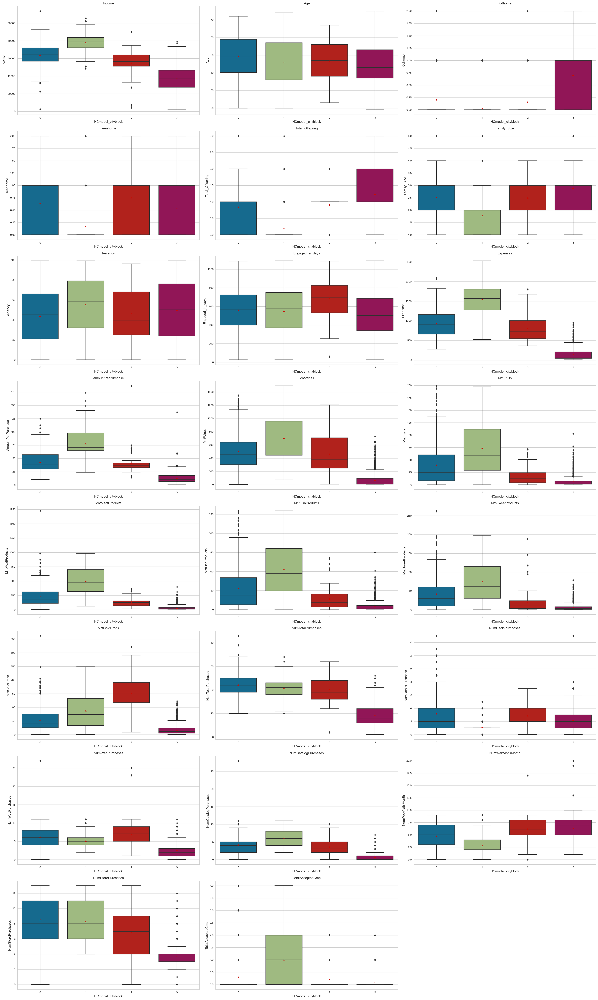

In [131]:
# Creating boxplot for each of the variables
all_col = columns_of_interest

plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(8, 3, i + 1)
    
    sns.boxplot(y=data[variable], x=data['HCmodel_cityblock'],showmeans=True)
    
    plt.tight_layout()
    
    plt.title(variable)

plt.show()

**Observations:** This results are very simila to the ones contained in the K-means method with 4 clusters. However the mean seems a bit less Income. However the clusters are in essence the same as the ones found in K-means 3 clusters. 

# **Chebyshev**

In [132]:
data_pca.drop('HCmodel_cityblock', axis=1, inplace=True)

In [133]:
# Initialize Agglomerative Clustering with affinity (distance) as Euclidean, linkage as 'Ward' with clusters=3
HCmodel = AgglomerativeClustering(n_clusters=3, affinity="chebyshev", linkage="complete",) 

# Fit on data_pca
HCmodel.fit(data_pca)  

AgglomerativeClustering(affinity='chebyshev', linkage='complete', n_clusters=3)

In [134]:
data_pca["HCmodel_Chebyshev"] = HCmodel.labels_                    # Adding K-medoids cluster labels to the data_pca data

data["HCmodel_Chebyshev"] = HCmodel.labels_                        # Adding K-medoids cluster labels to the whole data

data_model["HCmodel_Chebyshev"] = HCmodel.labels_   

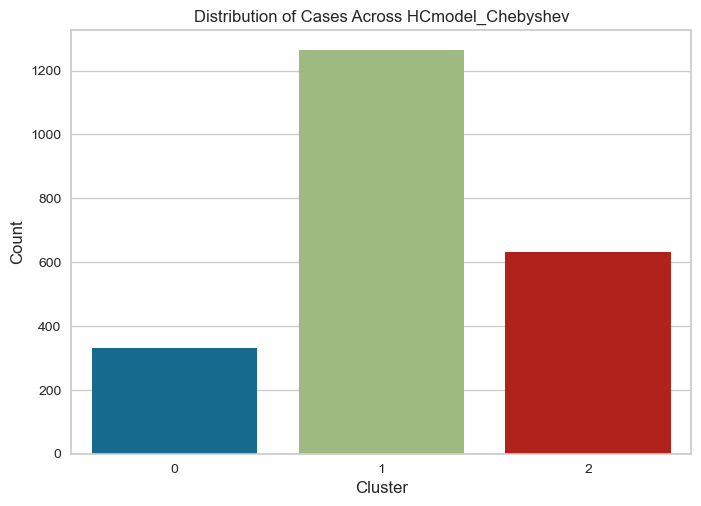

In [135]:
# Assuming 'K_means_segments_3' contains the cluster labels
sns.countplot(data=data_model, x='HCmodel_Chebyshev')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Distribution of Cases Across HCmodel_Chebyshev')
plt.show()

### **Visualize the clusters using PCA**

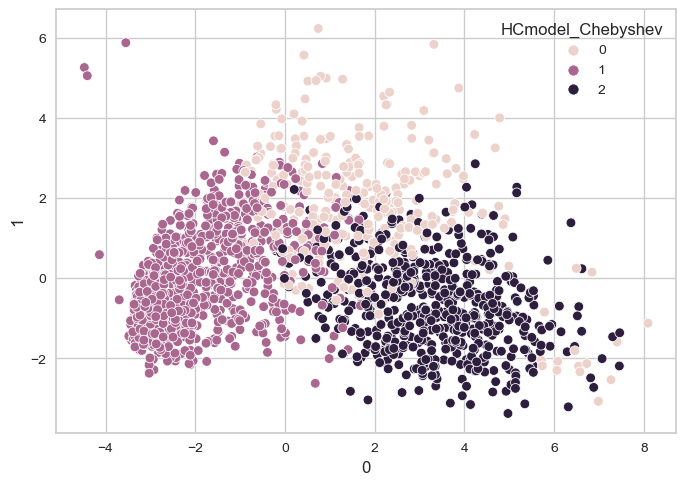

In [136]:
PCA_PLOT(0, 1, data_pca, "HCmodel_Chebyshev")

### **Cluster Profiling**

In [137]:
# Taking the cluster-wise mean of all the variables. Hint: First groupby 'data' by 'K_medoids_segments_5' and then find mean
cluster_profile_HC_model = data.groupby('HCmodel_Chebyshev').mean()
pd.set_option('display.max_columns', None)
# Highlighting the maximum average value among all the clusters for each of the variables
highlighted_max = cluster_profile_HC_model[columns_of_interest].style.highlight_max(color="lightgreen", axis=0)

# Highlighting the minimum average value among all the clusters for each of the variables
highlighted_min_max = highlighted_max.apply(lambda x: ['background-color: red' if value == x.min() else '' for value in x], axis=0)

# Displaying the styled DataFrame
highlighted_min_max

,Income,Age,Kidhome,Teenhome,Total_Offspring,Family_Size,Recency,Engaged_in_days,Expenses,AmountPerPurchase,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumTotalPurchases,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumWebVisitsMonth,NumStorePurchases,TotalAcceptedCmp
HCmodel_Chebyshev,,,,,,,,,,,,,,,,,,,,,,,
0,59356.306061,48.812121,0.263636,0.772727,1.036364,2.675758,52.206061,686.018182,947.478788,40.992228,544.736364,36.236364,198.584848,48.121212,38.836364,80.963636,23.324242,4.142424,7.190909,3.848485,6.003030,8.142424,0.424242
1,38394.654790,44.798100,0.689628,0.535234,1.224861,2.878860,48.184481,503.184481,171.760887,14.300217,94.903405,6.361045,34.618369,8.992874,6.229612,20.655582,9.667458,2.257324,2.746635,0.863025,6.313539,3.800475,0.117181
2,74120.456556,47.338073,0.050553,0.315956,0.366509,1.995261,49.358610,530.710900,1292.984202,64.508989,600.575039,61.192733,406.876777,89.500790,62.962085,71.876777,20.908373,1.505529,5.208531,5.556082,3.012638,8.638231,0.593997


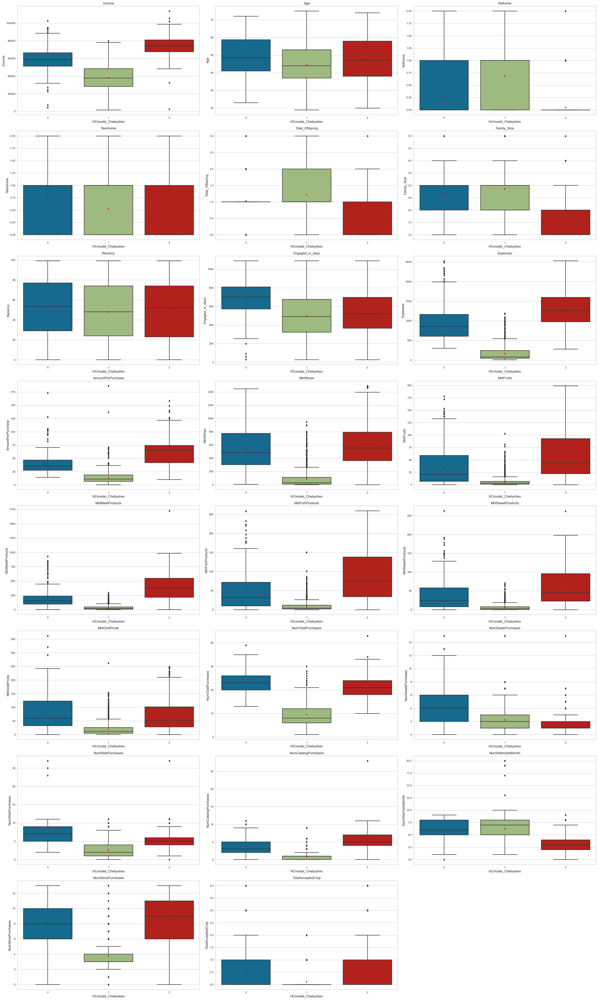

In [138]:
# Creating boxplot for each of the variables
all_col = columns_of_interest

plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(8, 3, i + 1)
    
    sns.boxplot(y=data[variable], x=data['HCmodel_Chebyshev'],showmeans=True)
    
    plt.tight_layout()
    
    plt.title(variable)

plt.show()

**Observations:** These results are very similar to the ones in the K-Medoids ncluster 3. However the information that can be extracted from the clusters is less than in the methods that contained 4 clusters. 

# **Euclidean**

In [139]:
data_pca.drop('HCmodel_Chebyshev', axis=1, inplace=True,)

In [140]:
# Initialize Agglomerative Clustering with affinity (distance) as Euclidean, linkage as 'Ward' with clusters=3
HCmodel = AgglomerativeClustering(n_clusters=3, affinity="euclidean", linkage="complete",) 

# Fit on data_pca
HCmodel.fit(data_pca) 

AgglomerativeClustering(affinity='euclidean', linkage='complete', n_clusters=3)

In [141]:
data_pca["HCmodel_euclidean"] = HCmodel.labels_                    # Adding K-medoids cluster labels to the data_pca data

data["HCmodel_euclidean"] = HCmodel.labels_                        # Adding K-medoids cluster labels to the whole data

data_model["HCmodel_euclidean"] = HCmodel.labels_   

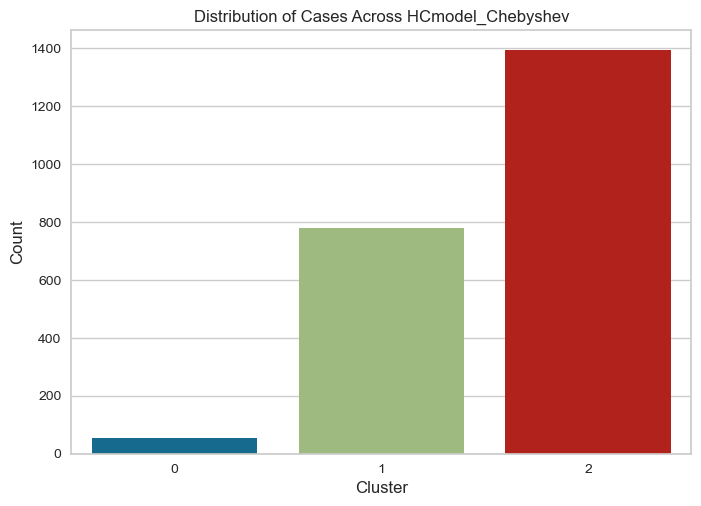

In [142]:
# Assuming 'K_means_segments_3' contains the cluster labels
sns.countplot(data=data_model, x='HCmodel_euclidean')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Distribution of Cases Across HCmodel_Chebyshev')
plt.show()

### **Visualize the clusters using PCA**


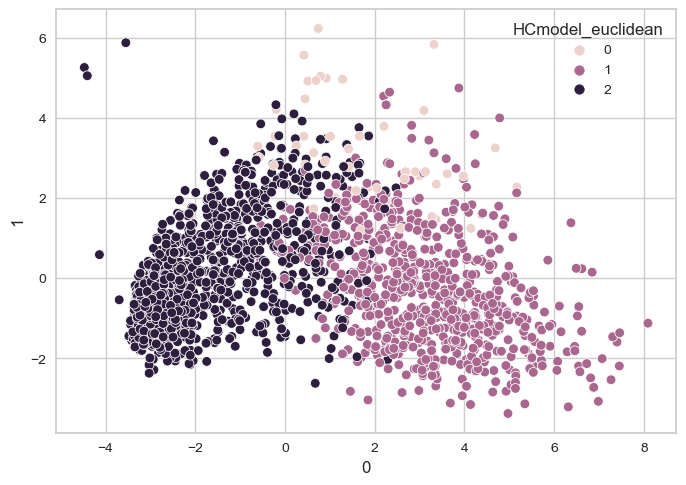

In [143]:
PCA_PLOT(0, 1, data_pca, "HCmodel_euclidean")

In [144]:
# Taking the cluster-wise mean of all the variables. Hint: First groupby 'data' by 'K_medoids_segments_5' and then find mean
cluster_profile_HC_model = data.groupby('HCmodel_euclidean').mean()
pd.set_option('display.max_columns', None)
# Highlighting the maximum average value among all the clusters for each of the variables
highlighted_max = cluster_profile_HC_model[columns_of_interest].style.highlight_max(color="lightgreen", axis=0)

# Highlighting the minimum average value among all the clusters for each of the variables
highlighted_min_max = highlighted_max.apply(lambda x: ['background-color: red' if value == x.min() else '' for value in x], axis=0)

# Displaying the styled DataFrame
highlighted_min_max

,Income,Age,Kidhome,Teenhome,Total_Offspring,Family_Size,Recency,Engaged_in_days,Expenses,AmountPerPurchase,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumTotalPurchases,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumWebVisitsMonth,NumStorePurchases,TotalAcceptedCmp
HCmodel_euclidean,,,,,,,,,,,,,,,,,,,,,,,
0,54719.277778,49.592593,0.555556,0.814815,1.370370,3.148148,36.462963,737.481481,934.500000,33.914992,531.351852,32.462963,210.666667,44.185185,53.648148,62.185185,27.648148,7.129630,8.851852,3.796296,6.481481,7.870370,0.111111
1,72251.691026,47.430769,0.066667,0.397436,0.464103,2.079487,52.238462,554.460256,1278.462821,62.332643,622.116667,58.655128,375.842308,83.501282,59.730769,78.616667,21.438462,1.803846,5.584615,5.398718,3.561538,8.651282,0.624359
2,40005.114224,45.243534,0.652299,0.558190,1.210489,2.866379,47.854885,521.224856,215.802443,15.784431,119.142241,8.062500,44.738506,11.763649,7.939655,24.155891,10.723420,2.427443,3.092672,1.049569,6.274425,4.153736,0.122845


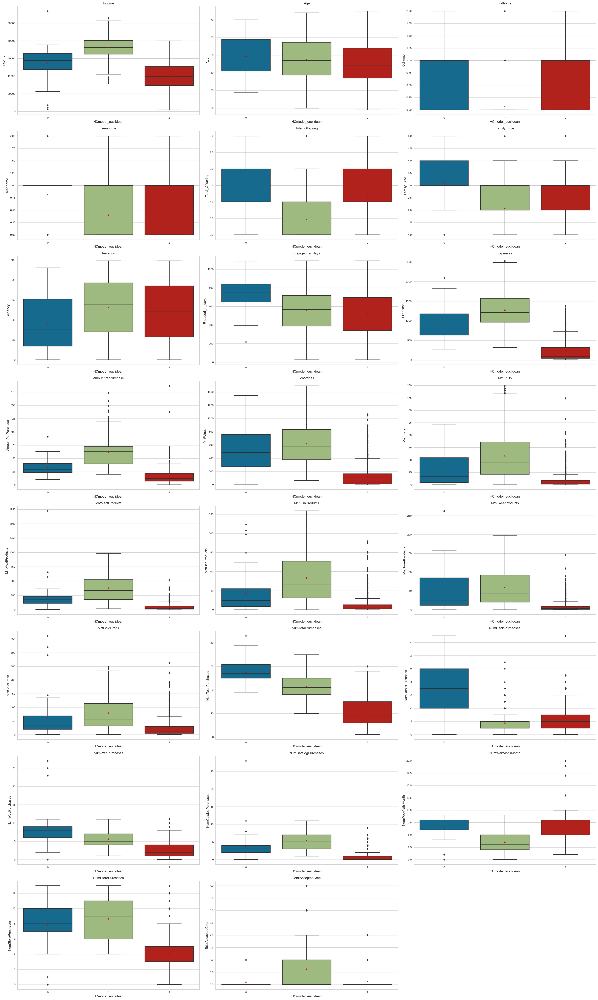

In [145]:
# Creating boxplot for each of the variables
all_col = columns_of_interest

plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(8, 3, i + 1)
    
    sns.boxplot(y=data[variable], x=data['HCmodel_euclidean'],showmeans=True)
    
    plt.tight_layout()
    
    plt.title(variable)

plt.show()

**Observations:** These results are very similar to the ones in the K-Medoids ncluster 3. However the information that can be extracted from the clusters is less than in the methods that contained 4 clusters.

## **DBSCAN**

DBSCAN is a very powerful algorithm for finding high-density clusters, but the problem is determining the best set of hyperparameters to use with it. It includes two hyperparameters, `eps`, and `min samples`.

Since it is an unsupervised algorithm, you have no control over it, unlike a supervised learning algorithm, which allows you to test your algorithm on a validation set. The approach we can follow is basically trying out a bunch of different combinations of values and finding the silhouette score for each of them. For that we wil do a grid search testing the best parameters. We tried a bunch of different combinations. Here we show a single grid that shows values of eps where their is lower silhoutte score and how it drops after eps value 5.

However the best performing silhouete scores correspond ton clusters that are mark by two clusters, one with most of the data and a small one with 'outliers'. 

In [146]:
data_pca.drop('HCmodel_euclidean', axis=1, inplace=True)

In [147]:
from sklearn.cluster import DBSCAN
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import silhouette_score
from sklearn import metrics

# Define the range of values for eps and min_samples
param_grid = {
    'eps': [0.1, 0.5, 1, 1.5, 2, 2.5, 3],
    'min_samples': [ 3, 6, 10,15, 20, 25, 30, 50, 100,150, 200]
}

# Initialize variables to store the best silhouette score and corresponding parameters
best_silhouette_score = -1
best_eps = None
best_min_samples = None

# Iterate over the parameter grid
for eps in param_grid['eps']:
    for min_samples in param_grid['min_samples']:
        # Fit DBSCAN model
        db = DBSCAN(eps=eps, min_samples=min_samples).fit(data_pca)
        
        # Compute silhouette score
        labels = db.labels_
        if len(np.unique(labels)) > 1:  # Silhouette score is not defined if there's only one cluster
            silhouette_avg = silhouette_score(data_pca, labels)
        else:
            silhouette_avg = -1  # Assign a dummy value if silhouette score is not defined
        
        # Update best silhouette score and parameters if current score is better
        if silhouette_avg > best_silhouette_score:
            best_silhouette_score = silhouette_avg
            best_eps = eps
            best_min_samples = min_samples
            
        # Print silhouette score for current parameter combination
        print("For eps =", eps, "and min_samples =", min_samples, "the average silhouette score is:", silhouette_avg)

For eps = 0.1 and min_samples = 3 the average silhouette score is: -0.47862097253380753
For eps = 0.1 and min_samples = 6 the average silhouette score is: -1
For eps = 0.1 and min_samples = 10 the average silhouette score is: -1
For eps = 0.1 and min_samples = 15 the average silhouette score is: -1
For eps = 0.1 and min_samples = 20 the average silhouette score is: -1
For eps = 0.1 and min_samples = 25 the average silhouette score is: -1
For eps = 0.1 and min_samples = 30 the average silhouette score is: -1
For eps = 0.1 and min_samples = 50 the average silhouette score is: -1
For eps = 0.1 and min_samples = 100 the average silhouette score is: -1
For eps = 0.1 and min_samples = 150 the average silhouette score is: -1
For eps = 0.1 and min_samples = 200 the average silhouette score is: -1
For eps = 0.5 and min_samples = 3 the average silhouette score is: -0.41782095801656777
For eps = 0.5 and min_samples = 6 the average silhouette score is: -0.22548906385039655
For eps = 0.5 and min_sa

In [148]:
# Print the best parameters found
print("Best parameters - eps:", best_eps, ", min_samples:", best_min_samples, ", silhouette score:", best_silhouette_score)

Best parameters - eps: 3 , min_samples: 25 , silhouette score: 0.405140678044647


In [149]:
# Apply DBSCAN using the above hyperparameter values
dbs = DBSCAN(eps=2, min_samples=200,)
dbs.fit(data_pca)

DBSCAN(eps=2, min_samples=200)

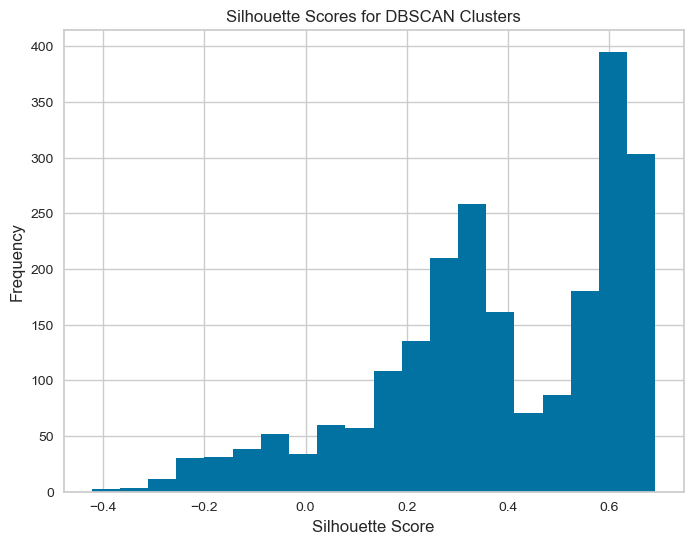

In [150]:
from sklearn.metrics import silhouette_samples
import matplotlib.pyplot as plt
from yellowbrick.cluster import SilhouetteVisualizer

# Calculate silhouette scores for each sample
silhouette_scores = silhouette_samples(data_pca, dbs.labels_)

# Plotting the silhouette scores
plt.figure(figsize=(8, 6))
plt.hist(silhouette_scores, bins=20)
plt.title('Silhouette Scores for DBSCAN Clusters')
plt.xlabel('Silhouette Score')
plt.ylabel('Frequency')
plt.show()

In [151]:
data_pca["DBS"] = dbs.labels_                    # Adding K-medoids cluster labels to the data_pca data

data["DBS"] = dbs.labels_                        # Adding K-medoids cluster labels to the whole data

data_model["DBS"] = dbs.labels_   

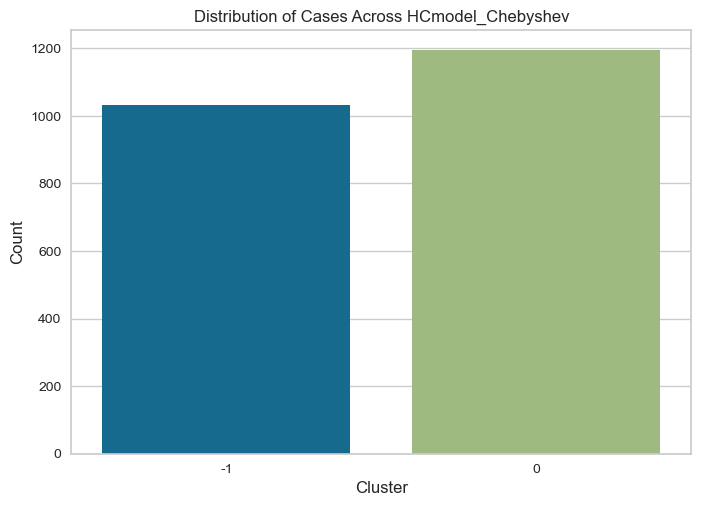

In [152]:
# Assuming 'K_means_segments_3' contains the cluster labels
sns.countplot(data=data_model, x='DBS')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Distribution of Cases Across HCmodel_Chebyshev')
plt.show()

### **Apply DBSCAN for the best hyperparameter and visualize the clusters from PCA**

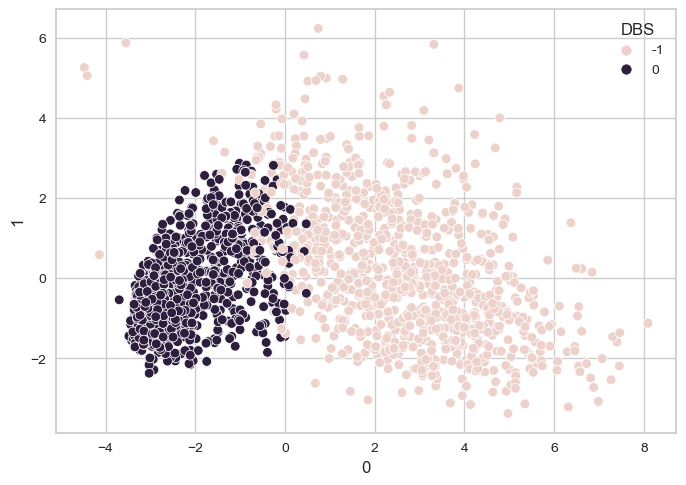

In [153]:
PCA_PLOT(0, 1, data_pca, "DBS")

**Observations:** The clusters seem to be just a division by half with no clear clusters. 

### Cluster profiling

In [154]:
# Taking the cluster-wise mean of all the variables. Hint: First groupby 'data' by 'K_medoids_segments_5' and then find mean
# List of columns you're interested in
columns_of_interest = ['Income', 'Age','Kidhome', 'Teenhome','Total_Offspring', 'Family_Size', 'Recency','Engaged_in_days',
                       'Expenses','AmountPerPurchase','MntWines','MntFruits', 'MntMeatProducts','MntFishProducts', 'MntSweetProducts',
                      'MntGoldProds', 'NumTotalPurchases','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumWebVisitsMonth',
                       'NumStorePurchases','TotalAcceptedCmp']  # Replace with your actual column names
cluster_profile_DBS= data.groupby('DBS').mean()
pd.set_option('display.max_columns', None)
# Highlighting the maximum average value among all the clusters for each of the variables
highlighted_max = cluster_profile_DBS[columns_of_interest].style.highlight_max(color="lightgreen", axis=0)

# Highlighting the minimum average value among all the clusters for each of the variables
highlighted_min_max = highlighted_max.apply(lambda x: ['background-color: red' if value == x.min() else '' for value in x], axis=0)

# Displaying the styled DataFrame
highlighted_min_max

,Income,Age,Kidhome,Teenhome,Total_Offspring,Family_Size,Recency,Engaged_in_days,Expenses,AmountPerPurchase,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumTotalPurchases,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumWebVisitsMonth,NumStorePurchases,TotalAcceptedCmp
DBS,,,,,,,,,,,,,,,,,,,,,,,
-1,68196.991279,47.887597,0.137597,0.480620,0.618217,2.249031,49.500000,568.140504,1144.064922,55.609994,576.728682,49.807171,319.551357,71.358527,51.758721,74.860465,21.500000,2.457364,5.897287,4.842054,4.233527,8.303295,0.548450
0,37369.333333,44.583752,0.710218,0.531826,1.242044,2.898660,48.781407,512.166667,140.189280,12.590691,70.859296,6.135678,31.015075,8.584590,5.966499,17.628141,9.174204,2.206868,2.556951,0.737018,6.275544,3.673367,0.082077


**Observations and Insights:** The method gave us less differentiation that we had before. Now we just have a high income high expense cluster, and one with less income. Thus we beleive it doesn't make sense as a method. DBSCAN may not be suitable for all types of data distributions. The method performs best on datasets with well-defined dense regions separated by areas of lower density. Our data doesnt exhibit clearly denser areas with less dense areas which could indicate that this is not the best algorithm to employ.

## **Gaussian Mixture Model**

In [155]:
# Dropping labels we got from DBSCAN since we will be using PCA data for prediction
# Hint: Use axis=1 and inplace=True
data_pca.drop('DBS', axis=1, inplace=True)

In [156]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.model_selection import GridSearchCV, ParameterGrid  # Import ParameterGrid

param_grid = {
    'covariance_type': ['full', 'tied', 'diag', 'spherical'],
    'tol': [0.01, 1e-3, 1e-4, 1e-5],
    'max_iter': [50, 100, 150, 200],
    'init_params': ['kmeans', 'random_from_data', 'k-means++', 'random'],
    'random_state': [1]
}

# Initialize variables to store the best silhouette score and corresponding parameters for each component
best_silhouette_scores = {}
best_params = {}

# Iterate over the number of components
for n_components in [3,4, 5,6 ,7 ,8]:
    print(f"Grid Search for {n_components} components:")
    # Define the range of values for n_components
    param_grid['n_components'] = [n_components]
    
    # Initialize Gaussian Mixture Model
    gmm = GaussianMixture()

    # Initialize variables to store the best silhouette score and corresponding parameters for this component
    best_silhouette_score = -1
    best_param = None

    # Iterate over the parameter grid
    for params in ParameterGrid(param_grid):
        # Initialize Gaussian Mixture Model with the current parameters
        gmm.set_params(**params)

        # Fit GMM model
        preds = gmm.fit_predict(data_pca)
        
        # Compute silhouette score
        silhouette_avg = silhouette_score(data_pca, preds)
        
        # Update best silhouette score and parameters if current score is better
        if silhouette_avg > best_silhouette_score:
            best_silhouette_score = silhouette_avg
            best_param = params
    
    # Store the best silhouette score and corresponding parameters for this component
    best_silhouette_scores[n_components] = best_silhouette_score
    best_params[n_components] = best_param

    # Print the best parameters and best silhouette score for this component
    print("Best Parameters:", best_params[n_components])
    print("Best Silhouette Score:", best_silhouette_scores[n_components])


Grid Search for 3 components:
Best Parameters: {'covariance_type': 'tied', 'init_params': 'kmeans', 'max_iter': 50, 'n_components': 3, 'random_state': 1, 'tol': 1e-05}
Best Silhouette Score: 0.3219277040816848
Grid Search for 4 components:
Best Parameters: {'covariance_type': 'tied', 'init_params': 'kmeans', 'max_iter': 50, 'n_components': 4, 'random_state': 1, 'tol': 1e-05}
Best Silhouette Score: 0.31621601805304883
Grid Search for 5 components:
Best Parameters: {'covariance_type': 'tied', 'init_params': 'kmeans', 'max_iter': 100, 'n_components': 5, 'random_state': 1, 'tol': 1e-05}
Best Silhouette Score: 0.2893183881111318
Grid Search for 6 components:
Best Parameters: {'covariance_type': 'spherical', 'init_params': 'kmeans', 'max_iter': 50, 'n_components': 6, 'random_state': 1, 'tol': 0.01}
Best Silhouette Score: 0.17123736034516837
Grid Search for 7 components:
Best Parameters: {'covariance_type': 'tied', 'init_params': 'kmeans', 'max_iter': 50, 'n_components': 7, 'random_state': 1,

Average silhouette score: 0.3219277040816848


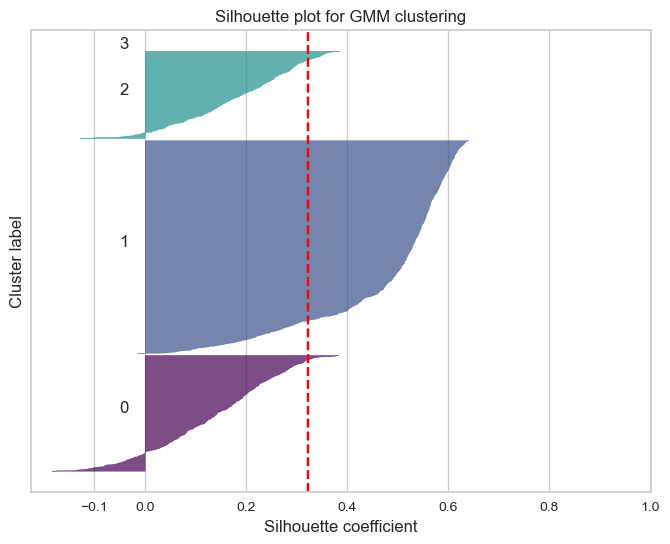

In [157]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_samples, silhouette_score


# Fit GMM
gmm = GaussianMixture(covariance_type= 'tied',
 init_params= 'kmeans',
 max_iter= 50,
 n_components= 3,
 random_state= 1,
 tol= 1e-05)
gmm.fit(data_pca)
labels = gmm.predict(data_pca)

# Calculate silhouette score
silhouette_avg = silhouette_score(data_pca, labels)
print("Average silhouette score:", silhouette_avg)

# Calculate silhouette values for each sample
sample_silhouette_values = silhouette_samples(data_pca, labels)

# Create a subplot with 1 row and 1 column
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(8, 6)

# Initialize y-axis position for each cluster
y_lower = 10

# Loop over clusters
for i in range(4):
    # Aggregate silhouette values for samples in cluster i
    cluster_silhouette_values = sample_silhouette_values[labels == i]

    # Sort silhouette values for better visualization
    cluster_silhouette_values.sort()

    # Calculate the size of the current cluster
    cluster_size = cluster_silhouette_values.shape[0]
    y_upper = y_lower + cluster_size

    # Fill color for the cluster
    color = plt.cm.viridis(float(i) / 4)

    # Fill silhouette plot
    ax.fill_betweenx(np.arange(y_lower, y_upper),
                      0, cluster_silhouette_values,
                      facecolor=color, edgecolor=color, alpha=0.7)

    # Label cluster centers
    ax.text(-0.05, y_lower + 0.5 * cluster_size, str(i))

    # Update y_lower for the next plot
    y_lower = y_upper + 10  # 10 for the 0 samples

ax.set_title("Silhouette plot for GMM clustering")
ax.set_xlabel("Silhouette coefficient")
ax.set_ylabel("Cluster label")

# The vertical line for average silhouette score of all the values
ax.axvline(x=silhouette_avg, color="red", linestyle="--")

ax.set_yticks([])  # Clear the yaxis labels / ticks
ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

plt.show()

Average silhouette score: 0.3145116352530792


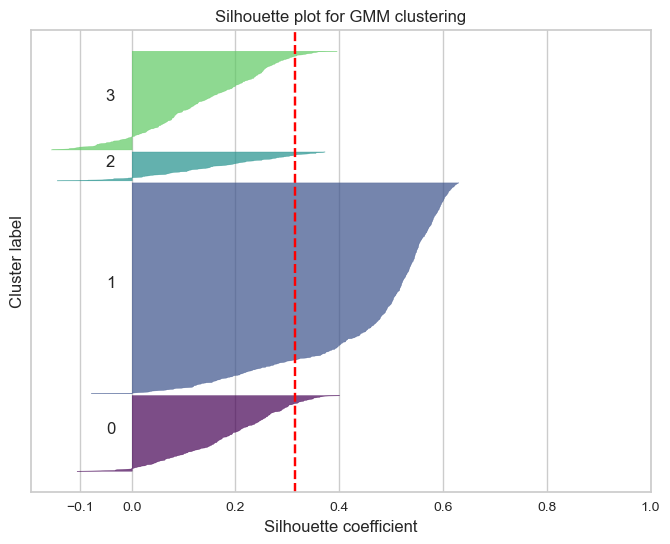

In [158]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_samples, silhouette_score


# Fit GMM
gmm = GaussianMixture(covariance_type= 'tied',
 init_params= 'kmeans',
 max_iter= 50,
 n_components= 4,
 random_state= 1,
 tol= 1e-05)
gmm.fit(data_pca)
labels = gmm.predict(data_pca)

# Calculate silhouette score
silhouette_avg = silhouette_score(data_pca, labels)
print("Average silhouette score:", silhouette_avg)

# Calculate silhouette values for each sample
sample_silhouette_values = silhouette_samples(data_pca, labels)

# Create a subplot with 1 row and 1 column
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(8, 6)

# Initialize y-axis position for each cluster
y_lower = 10

# Loop over clusters
for i in range(4):
    # Aggregate silhouette values for samples in cluster i
    cluster_silhouette_values = sample_silhouette_values[labels == i]

    # Sort silhouette values for better visualization
    cluster_silhouette_values.sort()

    # Calculate the size of the current cluster
    cluster_size = cluster_silhouette_values.shape[0]
    y_upper = y_lower + cluster_size

    # Fill color for the cluster
    color = plt.cm.viridis(float(i) / 4)

    # Fill silhouette plot
    ax.fill_betweenx(np.arange(y_lower, y_upper),
                      0, cluster_silhouette_values,
                      facecolor=color, edgecolor=color, alpha=0.7)

    # Label cluster centers
    ax.text(-0.05, y_lower + 0.5 * cluster_size, str(i))

    # Update y_lower for the next plot
    y_lower = y_upper + 10  # 10 for the 0 samples

ax.set_title("Silhouette plot for GMM clustering")
ax.set_xlabel("Silhouette coefficient")
ax.set_ylabel("Cluster label")

# The vertical line for average silhouette score of all the values
ax.axvline(x=silhouette_avg, color="red", linestyle="--")

ax.set_yticks([])  # Clear the yaxis labels / ticks
ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

plt.show()

Average silhouette score: 0.2742293134701222


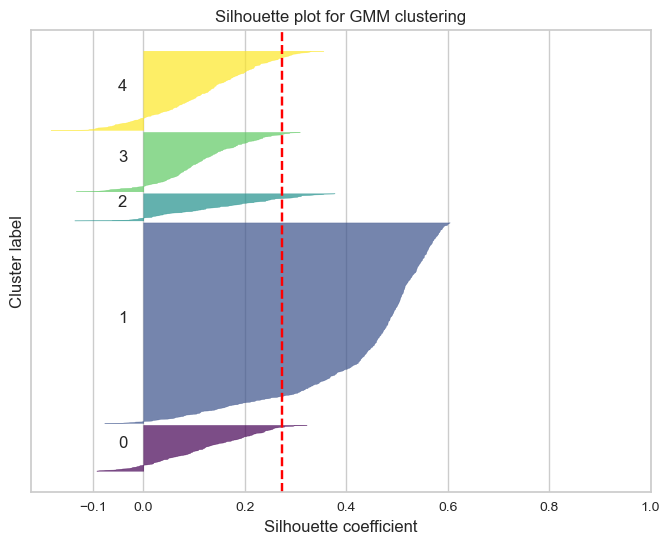

In [159]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_samples, silhouette_score


# Fit GMM
gmm = GaussianMixture(covariance_type= 'tied',
 init_params= 'kmeans',
 max_iter= 100,
 n_components= 5,
 random_state= 1,
 tol= 1e-05)
gmm.fit(data_pca)
labels = gmm.predict(data_pca)

# Calculate silhouette score
silhouette_avg = silhouette_score(data_pca, labels)
print("Average silhouette score:", silhouette_avg)

# Calculate silhouette values for each sample
sample_silhouette_values = silhouette_samples(data_pca, labels)

# Create a subplot with 1 row and 1 column
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(8, 6)

# Initialize y-axis position for each cluster
y_lower = 10

# Loop over clusters
for i in range(5):
    # Aggregate silhouette values for samples in cluster i
    cluster_silhouette_values = sample_silhouette_values[labels == i]

    # Sort silhouette values for better visualization
    cluster_silhouette_values.sort()

    # Calculate the size of the current cluster
    cluster_size = cluster_silhouette_values.shape[0]
    y_upper = y_lower + cluster_size

    # Fill color for the cluster
    color = plt.cm.viridis(float(i) / 4)

    # Fill silhouette plot
    ax.fill_betweenx(np.arange(y_lower, y_upper),
                      0, cluster_silhouette_values,
                      facecolor=color, edgecolor=color, alpha=0.7)

    # Label cluster centers
    ax.text(-0.05, y_lower + 0.5 * cluster_size, str(i))

    # Update y_lower for the next plot
    y_lower = y_upper + 10  # 10 for the 0 samples

ax.set_title("Silhouette plot for GMM clustering")
ax.set_xlabel("Silhouette coefficient")
ax.set_ylabel("Cluster label")

# The vertical line for average silhouette score of all the values
ax.axvline(x=silhouette_avg, color="red", linestyle="--")

ax.set_yticks([])  # Clear the yaxis labels / ticks
ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

plt.show()

# **3 clusters**

In [160]:
gmm = GaussianMixture(n_components=3, 
                      covariance_type='tied', 
                      tol=1e-05, 
                      max_iter=50, 
                      init_params='kmeans',random_state = 1)
gmm.fit(data_pca)

GaussianMixture(covariance_type='tied', max_iter=50, n_components=3,
                random_state=1, tol=1e-05)

In [161]:
# Get cluster labels for data_pca
cluster_labels = gmm.predict(data_pca)

data_pca["gmm3"] =cluster_labels# Adding K-medoids cluster labels to the data_pca data

data["gmm3"] = cluster_labels                    # Adding K-medoids cluster labels to the whole data

data_model["gmm3"] = cluster_labels   

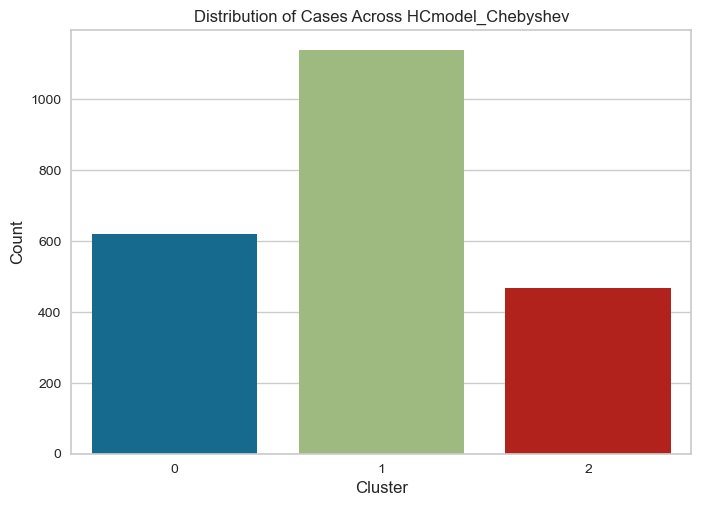

In [162]:
# Assuming 'K_means_segments_3' contains the cluster labels
sns.countplot(data=data_model, x='gmm3')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Distribution of Cases Across HCmodel_Chebyshev')
plt.show()

### **Visualize the clusters using PCA**

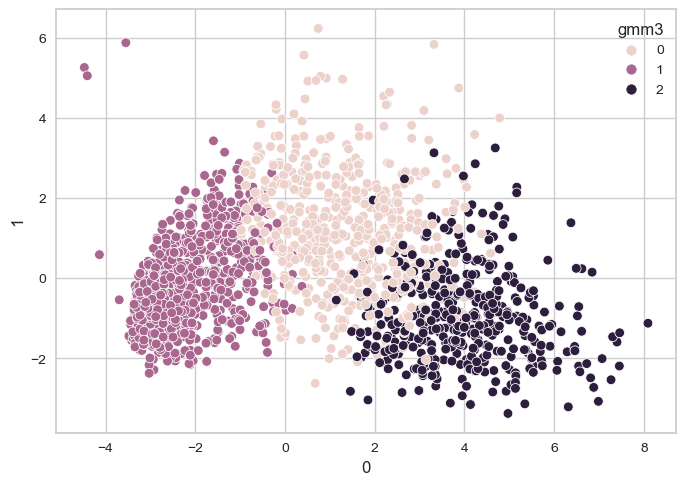

In [163]:
PCA_PLOT(0, 1, data_pca, "gmm3")

### **Cluster Profiling**

In [164]:
# Taking the cluster-wise mean of all the variables. Hint: First groupby 'data' by 'K_medoids_segments_5' and then find mean
# List of columns you're interested in
columns_of_interest = ['Income', 'Age','Kidhome', 'Teenhome','Total_Offspring', 'Family_Size', 'Recency','Engaged_in_days',
                       'Expenses','AmountPerPurchase','MntWines','MntFruits', 'MntMeatProducts','MntFishProducts', 'MntSweetProducts',
                      'MntGoldProds', 'NumTotalPurchases','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumWebVisitsMonth',
                       'NumStorePurchases','TotalAcceptedCmp']  # Replace with your actual column names
cluster_profile_gmm= data.groupby('gmm3').mean()
pd.set_option('display.max_columns', None)
# Highlighting the maximum average value among all the clusters for each of the variables
highlighted_max = cluster_profile_gmm[columns_of_interest].style.highlight_max(color="lightgreen", axis=0)

# Highlighting the minimum average value among all the clusters for each of the variables
highlighted_min_max = highlighted_max.apply(lambda x: ['background-color: red' if value == x.min() else '' for value in x], axis=0)

# Displaying the styled DataFrame
highlighted_min_max

,Income,Age,Kidhome,Teenhome,Total_Offspring,Family_Size,Recency,Engaged_in_days,Expenses,AmountPerPurchase,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumTotalPurchases,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumWebVisitsMonth,NumStorePurchases,TotalAcceptedCmp
gmm3,,,,,,,,,,,,,,,,,,,,,,,
0,61493.306452,49.341935,0.211290,0.758065,0.969355,2.629032,48.648387,567.275806,843.370968,38.915782,502.520968,26.704839,178.256452,36.543548,27.570968,71.774194,21.983871,3.367742,6.437097,3.751613,5.108065,8.427419,0.300000
1,36061.610721,44.197715,0.738137,0.498243,1.236380,2.884886,48.995606,512.493849,120.611599,12.113857,56.066784,5.852373,27.030756,8.524605,5.719684,17.417399,8.622144,2.151142,2.389279,0.652900,6.427065,3.428822,0.094903
2,76569.051282,46.504274,0.040598,0.200855,0.241453,1.856838,50.021368,561.792735,1469.903846,73.738131,650.476496,75.876068,481.899573,110.115385,78.923077,72.613248,20.726496,1.356838,5.190171,6.000000,2.950855,8.179487,0.790598


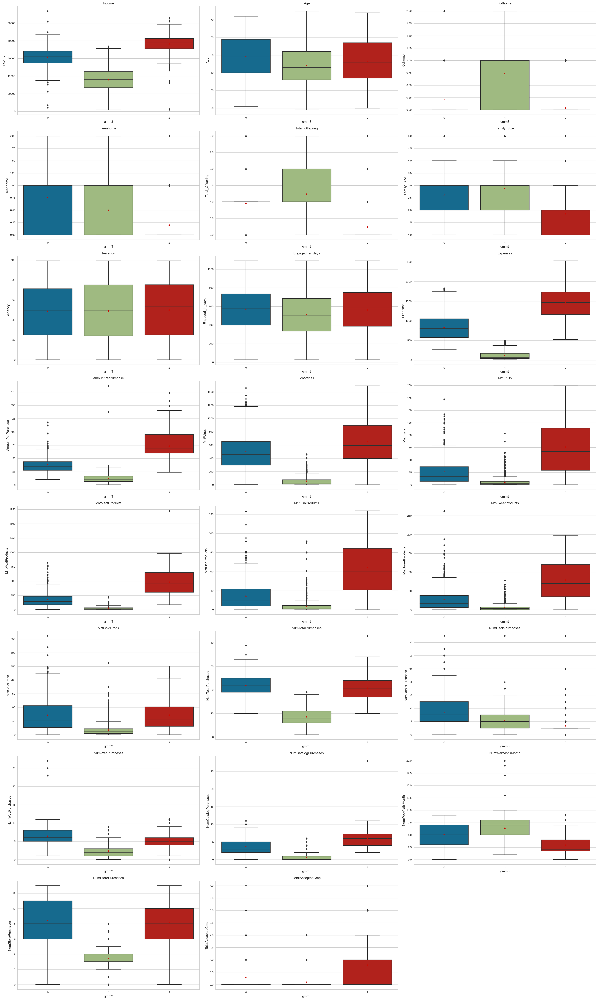

In [165]:
# Creating boxplot for each of the variables
all_col = columns_of_interest

plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(8, 3, i + 1)
    
    sns.boxplot(y=data[variable], x=data['gmm3'],showmeans=True)
    
    plt.tight_layout()
    
    plt.title(variable)

plt.show()

**Observations:** Despite this been the solution with higher Silhoute score it doesn't contain extremely interesting information. We will try the 3 cluster solution cause it had very similar Silhoute score and possibly contains more useful information. 

# **4 clusters**

In [166]:
# Dropping labels we got from gmm since we will be using PCA data for prediction
# Hint: Use axis=1 and inplace=True
data_pca.drop('gmm3', axis=1, inplace=True)

In [167]:
gmm = GaussianMixture(covariance_type= 'tied',
 init_params= 'kmeans',
 max_iter= 50,
 n_components= 4,
 random_state= 1,
 tol= 1e-05)
gmm.fit(data_pca)

GaussianMixture(covariance_type='tied', max_iter=50, n_components=4,
                random_state=1, tol=1e-05)

In [168]:
# Get cluster labels for data_pca
cluster_labels = gmm.predict(data_pca)

data_pca["gmm4"] =cluster_labels# Adding K-medoids cluster labels to the data_pca data

data["gmm4"] = cluster_labels                    # Adding K-medoids cluster labels to the whole data

data_model["gmm4"] = cluster_labels   

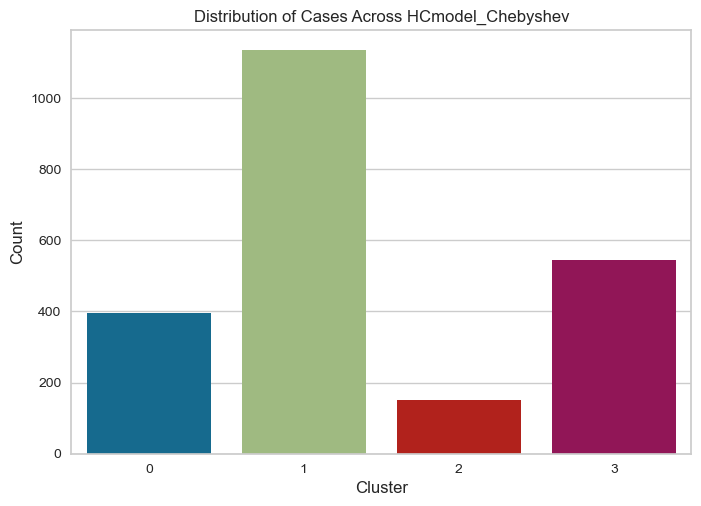

In [169]:
# Assuming 'K_means_segments_3' contains the cluster labels
sns.countplot(data=data_model, x='gmm4')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Distribution of Cases Across HCmodel_Chebyshev')
plt.show()

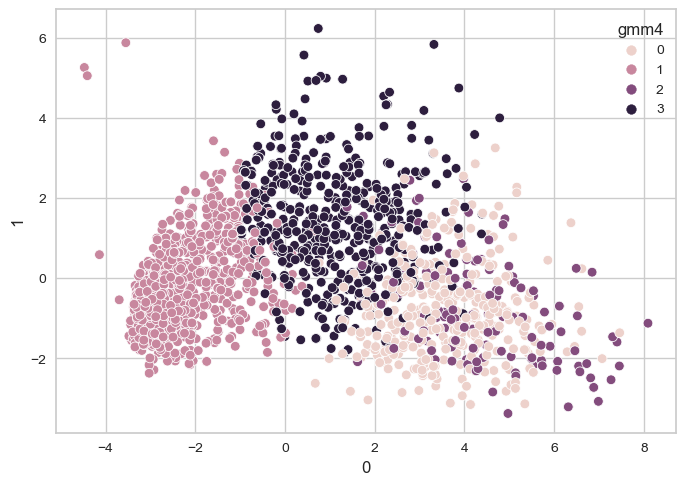

In [170]:
PCA_PLOT(0, 1, data_pca, "gmm4")

In [171]:
# Taking the cluster-wise mean of all the variables. Hint: First groupby 'data' by 'K_medoids_segments_5' and then find mean
# List of columns you're interested in
columns_of_interest = ['Income', 'Age','Kidhome', 'Teenhome','Total_Offspring', 'Family_Size', 'Recency','Engaged_in_days',
                       'Expenses','AmountPerPurchase','MntWines','MntFruits', 'MntMeatProducts','MntFishProducts', 'MntSweetProducts',
                      'MntGoldProds', 'NumTotalPurchases','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumWebVisitsMonth',
                       'NumStorePurchases','TotalAcceptedCmp']  # Replace with your actual column names
cluster_profile_gmm= data.groupby('gmm4').mean()
pd.set_option('display.max_columns', None)
# Highlighting the maximum average value among all the clusters for each of the variables
highlighted_max = cluster_profile_gmm[columns_of_interest].style.highlight_max(color="lightgreen", axis=0)

# Highlighting the minimum average value among all the clusters for each of the variables
highlighted_min_max = highlighted_max.apply(lambda x: ['background-color: red' if value == x.min() else '' for value in x], axis=0)

# Displaying the styled DataFrame
highlighted_min_max

,Income,Age,Kidhome,Teenhome,Total_Offspring,Family_Size,Recency,Engaged_in_days,Expenses,AmountPerPurchase,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumTotalPurchases,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumWebVisitsMonth,NumStorePurchases,TotalAcceptedCmp
gmm4,,,,,,,,,,,,,,,,,,,,,,,
0,73582.136709,47.182278,0.045570,0.253165,0.298734,1.918987,50.303797,569.792405,1322.081013,65.731940,529.144304,79.141772,448.240506,114.035443,77.086076,74.432911,20.835443,1.506329,5.116456,5.774684,2.936709,8.437975,0.227848
1,36101.262787,44.184303,0.738095,0.496473,1.234568,2.884480,49.217813,512.870370,119.329806,12.070077,53.968254,6.105820,27.344797,8.726631,5.960317,17.223986,8.582892,2.140212,2.354497,0.652557,6.396825,3.435626,0.086420
2,80296.177632,44.875000,0.065789,0.190789,0.256579,1.875000,50.736842,526.421053,1680.407895,84.616295,956.342105,50.250000,467.282895,73.526316,64.894737,68.111842,20.809211,1.184211,5.473684,6.052632,3.500000,8.098684,2.217105
3,60164.190826,49.706422,0.229358,0.805505,1.034862,2.693578,47.585321,570.952294,798.343119,36.531263,484.796330,23.677064,160.950459,32.616514,24.710092,71.592661,22.047706,3.612844,6.634862,3.552294,5.350459,8.247706,0.255046


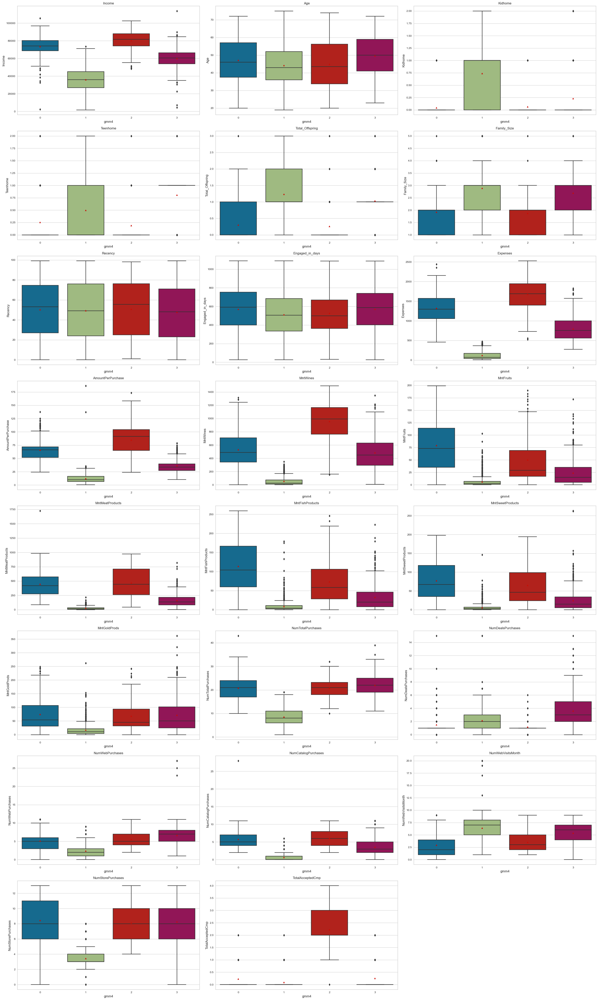

In [172]:
# Creating boxplot for each of the variables
all_col = columns_of_interest

plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(8, 3, i + 1)
    
    sns.boxplot(y=data[variable], x=data['gmm4'],showmeans=True)
    
    plt.tight_layout()
    
    plt.title(variable)

plt.show()

### **Characteristics of each cluster**

**Summary of each cluster:**

- **Cluster 0 (High Expenses - Fruit/Fish/Sweet/Gold):** This cluster exhibits high income levels and expenses, although slightly lower than **Cluster 2**. They make a similar number of purchases compared to **Cluster 2** and **3**, but spend more per purchase than **Cluster 3** and less than **Cluster 2**. **Cluster 0** is the second oldest age group and has relatively small families. Notably, they spend the most on items such as fruits, fish products, sweet products, and gold products compared to other clusters.

- **Cluster 1 (Low Income-Low Expenses Cluster):** This cluster has low levels of income and expenses and is the youngest group. They make fewer purchases, with the purchases been low despite having larger families and more offspring than most clusters (except for **Cluster 3**) they spend less overall. However, they show higher engagement with the website compared to other clusters.

- **Cluster 2 (High Expenses - Wine/Meat):** Characterized by the highest income and expenses, **Cluster 2** has the smallest families and is the second youngest group. They spend significantly more on wine and meat than other clusters and are the most responsive to our promotions.

- **Cluster 3 (Medium Expenses):** This cluster has moderate income and expenses, large families, and is the oldest group. They are the most loyal customers, been with the company for the longest time. They make more purchases than any other and engage with the website frequently. They are the ones buying more deals than any other group and also the ones that are buying more in the webpage. However, their expenditure per purchase is lower compared to **Cluster 2** and **1**.

## **Conclusion and Recommendations**

**1. Comparison of various techniques and their relative performance based on chosen Metric (Measure of success)**:

During this project, we employed a variety of unsupervised segmentation techniques. Our dataset, particularly after feature engineering, exhibited significant multicollinearity, characterized by high correlation among numerical variables. Given that many of these techniques rely on distance-based calculations, we utilized Principal Component Analysis (PCA) to alleviate these correlations and utilized the first seven components for subsequent analysis.

Among the algorithms tested, Gaussian Mixture Models (GMM) and k-means clustering with four clusters emerged as the most effective. Despite the silhouette score not reaching high values, the resulting clusters displayed distinct characteristics and provided valuable insights into customer profiles. GMM, in particular, outperformed k-means by yielding more clearly defined clusters.

However, there is room for further improvement in the data analysis process. Exploring new algorithms for segmenting the data could potentially lead to more refined cluster assignments and deeper insights. Additionally, employing other techniques for dimensionality reduction or addressing multicollinearity could enhance the quality of the clustering results.

In summary, while our current approach yielded meaningful results, there are opportunities to enhance the segmentation process and extract even more valuable information from the dataset.

**2. Refined insights**:

Utilizing the identified clusters, we can derive refined insights that offer deeper understanding and actionable implications for decision-making:

- **Targeted Marketing Strategies:**

Tailor marketing campaigns specifically to each cluster's preferences and spending habits. For instance, **Cluster 0**, characterized by high expenses on fruits, fish, sweets, and gold, may respond well to premium offers in these kind of products. promotions, while **Cluster 2**, known for its expenditure on wine and meat, could be targeted with exclusive deals on these items. On the other hand, **Cluster 3** visit the webpage a lot while been the ones that bought more deals. Thus presentation of deals in the webpage may be a good marketing strategy. 

- **Product Assortment Optimization:**

Optimize product assortments and offerings based on the unique preferences of each cluster. **Cluster 2**'s affinity for wine and meat suggests an opportunity to expand the selection in these categories, while **Cluster 1**'s lower expenses indicate a need for budget-friendly options that are displated in the webpage, that they visit a lot.

- **Customer Experience Enhancements:**

Enhance the overall customer experience by catering to the distinct needs and preferences of each cluster. For example, **Cluster 3**, characterized by loyalty and frequent website engagement, may benefit from personalized recommendations or loyalty rewards programs to further incentivize their continued patronage.

- **Retention and Loyalty Programs:**

Develop targeted retention and loyalty programs aimed at retaining customers and strengthening relationships with each cluster. Recognize and reward the loyalty of **Cluster 3** with exclusive perks or discounts, while incentivizing repeat purchases from **Cluster 2** through tailored loyalty incentives.

By refining insights derived from the identified clusters, businesses can effectively segment their customer base and implement targeted strategies to drive growth, enhance customer satisfaction, and maximize profitability.

**3. Proposal for the final solution design:**

Proposing the utilization of the Gaussian Mixture Model (GMM) with a four-cluster solution over K-means clustering aligns with the aim of achieving more refined and distinct clusters. While both solutions yielded similar outcomes in terms of the number of clusters identified, GMM offers advantages in terms of cluster definition and information granularity.